# Analysis of hippocampal theta sweeps across hemispheres

***Sidney Rafilson | Buzsaki Lab***



This notebook loads the preprocessed electrophysiology (CatGT -> Kilosort4 -> CellMetrics) and tracking data, builds spike rate matrices and place fields and implements bayessian decoding


overlay ripple times on decoding

In [128]:
import numpy as np
import pandas as pd

from scipy.stats import zscore, wasserstein_distance
from scipy.interpolate import interp1d
from scipy.io import loadmat
from scipy.special import logsumexp
from scipy.io import loadmat

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sns
import plotly.graph_objects as go
from ipywidgets import interact, FloatSlider

from core import *

sns.set_context('notebook', font_scale=1.5)

## Pipeline configuration settings

In [130]:
# ----------------------------- Config ---------------------------------

# Data paths and session info
DATA_DIR = r"\\research-cifs.nyumc.org\research\buzsakilab\Homes\voerom01\Bilat_HPC\Bilat_R02\Bilat_R02_20251106"
FIG_DIR = r"\\research-cifs.nyumc.org\research\buzsakilab\Homes\voerom01\Bilat_HPC\Bilat_R02\Bilat_R02_20251106\analysisFigures"
SESSION_NAME = "pre_sleep_g0"
BASE_NAME = "Bilat_R02_20251106"
PROBES = [0, 1, 2, 3]


# Spike rate computation parameters
WINDOW_SIZE = 0.04         # s
STEP_SIZE   = 0.04        # s
SIGMA       = 5          # smoothing sigma (0 -> no smoothing)
USE_UNITS   = "good"       # {'all', 'good', 'mua'}
NORMALIZE   = True         # z-score each unit's rates

# Filtering thresholds
MIN_TOTAL_SPIKES   = 100
MIN_MEAN_RATE_HZ   = 0.01
MIN_PRESENCE_RATIO = 0.75
N_TIME_BINS        = 100    # coarse bins for presence ratio


# defining the region dictionary. Keys are probe numbers, values are dictionaries which are further mapping shanks to regions
#region_dict = {0: {0: 'CA1', 1: 'RSP', 2: 'CA3', 3: 'CA1', 4: 'RSP', 5: 'CA3', 6: 'CA1', 7: 'RSP'}, 1: {0: 'CA3', 1: 'CA1', 2: 'CA2', 3: 'A1', 4: 'S1'}, 2: {0: 'CA3', 1: 'Th', 2: 'V1', 3: 'Th', 4: 'CA1', 5: 'V1', 6: 'CA1', 7: 'V1'}} UDS
region_dict = {
    0: {0: 'CA1', 1: 'Th', 2: 'CA1', 3: 'CA1', 4: 'CA1', 5: 'CA1', 6: 'CA1', 7: 'CA1'},
    1: {0: 'CA1', 1: 'CA1', 2: 'CA1', 3: 'CA1', 4: 'CA1', 5: 'CA1', 6: 'CA1', 7: 'CA1'},
    2: {0: 'CA1', 1: 'CA1', 2: 'CA1', 3: 'CA1', 4: 'CA1', 5: 'CA1', 6:'CA1'}, 
    3: {0: 'CA1', 1: 'CA1', 2: 'CA1', 3: 'CA1', 4: 'CA1', 5: 'CA1', 6: 'CA1', 7: 'CA1'}
}


# defining the hemisphere dictionary. Keys are probe numbers, values are 'L' or 'R' for left/right hemisphere
hemisphere_dict = {0: 'L', 1: 'L', 2: 'R', 3: 'R'}

# Create figure directory if it doesn't exist
os.makedirs(FIG_DIR, exist_ok=True)

In [94]:
# ------------------------ Optionally save & load region dictionary ------------------------
save_region_dict = True
if save_region_dict:
    dict_file = open(os.path.join(DATA_DIR, 'region_dict.pkl'), 'wb')
    dict_file.write(str(region_dict).encode())
    dict_file.close()

load_region_dict = True
if load_region_dict:
    dict_file = open(os.path.join(DATA_DIR, 'region_dict.pkl'), 'rb')
    region_dict = eval(dict_file.read().decode())
    dict_file.close()


## Loading the spike rate matrices

In [131]:
# ------------------------ Load spike rate matrices ------------------------
spike_rate_matrices = {}
cell_types = {}
regions = {}
for probe in PROBES:
    # Get the raw spike counts and the zscored and smoothed spike rates
    ks_dir = os.path.join(DATA_DIR, f'Kilosort_imec{probe}_ks4')
    raw_rates, time_bins, units = compute_spike_rates(str(ks_dir), WINDOW_SIZE, STEP_SIZE, USE_UNITS, 0.0, False, adj = '_sec_adj')
    spike_rate_matrix, _, _ = compute_spike_rates(str(ks_dir), WINDOW_SIZE, STEP_SIZE, USE_UNITS, SIGMA, NORMALIZE, adj = '_sec_adj')
    est_counts_per_bin = raw_rates * WINDOW_SIZE


    # computing the filtering metrics
    total_spikes   = est_counts_per_bin.sum(axis=1)         
    mean_rate_hz   = raw_rates.mean(axis=1)
    presence_ratio = get_presence_ratio(est_counts_per_bin, time_bins, N_TIME_BINS)

    mask = (
        (total_spikes >= MIN_TOTAL_SPIKES) &
        (mean_rate_hz >= MIN_MEAN_RATE_HZ) &
        (presence_ratio >= MIN_PRESENCE_RATIO)
    )


    # Apply mask to spike rate matrix and unit list
    spike_rate_matrix = spike_rate_matrix[mask, :]
    units = [u for u, keep in zip(units, mask) if keep]
    print(f"Probe {probe}: Keeping {mask.sum()} / {mask.sum() + (~mask).sum()} units after filtering.\nspike_rate_matrix shape: {spike_rate_matrix.shape}\n")

    # remove units based on presence ratio
    spike_rate_matrices[probe] = (spike_rate_matrix, time_bins, units)


    # Load the cell metrics
    cell_metrics_file = os.path.join(DATA_DIR, f'{BASE_NAME}_imec{probe}.cell_metrics.cellinfo.mat')
    cell_type = loadmat(cell_metrics_file)['cell_metrics']['putativeCellType'][0,0].flatten()
    shank_ids = loadmat(cell_metrics_file)['cell_metrics']['shankID'][0,0].flatten()


    # keeping only the string labels
    cell_type = np.array([ct[0] if isinstance(ct, np.ndarray) else ct for ct in cell_type])

    # removing mask applied units from cell type
    cell_types[probe] = cell_type[mask]
    regions[probe] = np.array([region_dict[probe][shank_id-1] for shank_id in shank_ids[mask]])  # shank IDs are 1-based

Probe 0: Keeping 76 / 80 units after filtering.
spike_rate_matrix shape: (76, 263023)

Probe 1: Keeping 45 / 49 units after filtering.
spike_rate_matrix shape: (45, 263023)

Probe 2: Keeping 276 / 299 units after filtering.
spike_rate_matrix shape: (276, 263023)

Probe 3: Keeping 292 / 305 units after filtering.
spike_rate_matrix shape: (292, 263023)



## Plotting spike rates by region

In [132]:
# --- Configuration ---
regions_of_interest = ['CA1']

cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}

facet_by = "celltype"  # ignored below; we force "one heatmap per cell type"

# get the time bins from the first probe
first_probe = PROBES[0]
_, time_bins, _ = spike_rate_matrices[first_probe]


# -----------------------------
# 1) Collect matrices by (celltype, region) for global vmin/vmax
# -----------------------------
per_celltype_region = {}  # dict[celltype][region][hemisphere] = matrix (unsorted)
all_vals_for_scale = []

for celltype_key in cell_type_groups.keys():
    per_celltype_region[celltype_key] = {}
    for region_name in regions_of_interest:
        per_celltype_region[celltype_key][region_name] = {}
        for hemi in ['L', 'R']:
            M = collect_matrix_for_bilat(
                spike_rate_matrices, region_name, regions,
                celltype_key, cell_types, PROBES, cell_type_groups, hemi, hemisphere_dict
            )
            per_celltype_region[celltype_key][region_name][hemi] = M
            if M is not None and M.size > 0:
                all_vals_for_scale.append(M.ravel())

if len(all_vals_for_scale) == 0:
    raise RuntimeError("No units found for the chosen regions/cell types after filtering.")

all_vals = np.concatenate(all_vals_for_scale)
vmin = np.percentile(all_vals, 2.5)
vmax = np.percentile(all_vals, 97.5)

# print the structure of the per_celltype_region dictionary
for celltype_key in per_celltype_region:
    print(f"Cell type: {celltype_key}")
    for region_name in per_celltype_region[celltype_key]:
        for hemi in per_celltype_region[celltype_key][region_name]:
            M = per_celltype_region[celltype_key][region_name][hemi]
            shape_str = "None" if M is None else str(M.shape)
            print(f"  Region: {region_name}, Hemisphere: {hemi}, Matrix shape: {shape_str}")


# -----------------------------
# 2) Build per-celltype concatenated heatmaps (sorted region-by-region)
# -----------------------------
def build_concatenated_sorted(M_by_region, sort_mode='corr'):
    """
    Input: dict[region] -> M
    Returns:
      M_concat: vertically concatenated heatmap (regions stacked)
      sections: list of (region_name, start_row, end_row) in M_concat
    """
    blocks = []
    sections = []
    row_cursor = 0
    for region_name in regions_of_interest:
        M = M_by_region.get(region_name, None)
        if M is None or M.size == 0:
            continue
        M_sorted = sort_units(M, mode=sort_mode)
        nrows = M_sorted.shape[0]
        blocks.append(M_sorted)
        sections.append((region_name, row_cursor, row_cursor + nrows))
        row_cursor += nrows

    if len(blocks) == 0:
        return None, []

    M_concat = np.vstack(blocks)
    return M_concat, sections


# Build concatenated matrices for each cell type and each hemisphere
# Build concatenated matrices for each cell type and each hemisphere
concat_by_celltype = {}
sections_by_celltype = {}

for celltype_key in cell_type_groups.keys():
    for hemi in ['L', 'R']:
        print(f"Building concatenated matrix for cell type: {celltype_key}, Hemisphere: {hemi}")

        # build dict[region_name] -> M for THIS hemisphere
        M_by_region_hemi = {}
        for region_name in regions_of_interest:
            # be slightly defensive in case a region is missing:
            region_dict = per_celltype_region[celltype_key].get(region_name, {})
            M_by_region_hemi[region_name] = region_dict.get(hemi, None)

        # now this matches the expected input: dict[region] -> matrix
        M_concat, sections = build_concatenated_sorted(
            M_by_region_hemi,
            sort_mode='corr'
        )

        concat_by_celltype[(celltype_key, hemi)] = M_concat
        sections_by_celltype[(celltype_key, hemi)] = sections




Cell type: Pyramidal
  Region: CA1, Hemisphere: L, Matrix shape: (76, 263023)
  Region: CA1, Hemisphere: R, Matrix shape: (345, 263023)
Cell type: Interneuron
  Region: CA1, Hemisphere: L, Matrix shape: (23, 263023)
  Region: CA1, Hemisphere: R, Matrix shape: (223, 263023)
Building concatenated matrix for cell type: Pyramidal, Hemisphere: L
Building concatenated matrix for cell type: Pyramidal, Hemisphere: R
Building concatenated matrix for cell type: Interneuron, Hemisphere: L
Building concatenated matrix for cell type: Interneuron, Hemisphere: R


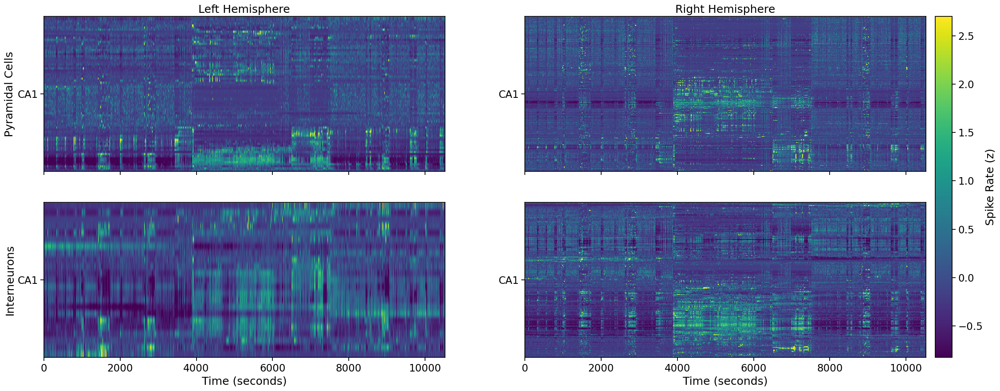

In [133]:
# -----------------------------
# 3) Plot: one heatmap per celltype and hemisphere
# -----------------------------
celltype_order = list(cell_type_groups.keys())  # e.g., ["Pyramidal", "Interneuron"]
n_rows = len(celltype_order)

fig, axs = plt.subplots(
    n_rows, 2,
    figsize=(27, 5 * n_rows),
    sharex=True,
    squeeze=False
)

first_im = None
visible_axes = []

for j, hemi in enumerate(['L', 'R']):
    for i, celltype_key in enumerate(celltype_order):
        ax = axs[i, j]
        M_concat = concat_by_celltype.get((celltype_key, hemi), None)

        if M_concat is None or M_concat.size == 0:
            ax.set_visible(False)
            continue

        im = ax.imshow(
            M_concat,
            aspect='auto',
            cmap='viridis',
            extent=[time_bins[0], time_bins[-1], 0, M_concat.shape[0]],
            vmin=vmin,
            vmax=vmax,
            origin='lower'
        )
        if first_im is None:
            first_im = im
        visible_axes.append(ax)

        # --- Draw region separators and centered labels ---
        sections = sections_by_celltype[(celltype_key, hemi)]
        ytick_positions = []
        ytick_labels = []

        for (region_name, start_row, end_row) in sections:
            # Separator line at the top of each region except the first
            if start_row > 0:
                ax.axhline(y=start_row, color='white', linewidth=1.5, alpha=0.9)
            # Center position for label
            center = 0.5 * (start_row + end_row)

            ytick_positions.append(center)
            ytick_labels.append(region_name)

        # Add a bottom boundary line for the last region
        if sections:
            ax.axhline(y=sections[-1][2], color='white', linewidth=1.5, alpha=0.9)

        ax.set_yticks(ytick_positions)
        ax.set_yticklabels(ytick_labels)
        #ax.set_ylabel(f"{celltype_key}\n")

        # Title per heatmap
        ax.set_title(f"{celltype_key}")

# Shared x label
axs[-1, 0].set_xlabel("Time (seconds)")
axs[-1, 1].set_xlabel("Time (seconds)")

# Single shared colorbar
if first_im is not None:
    cbar = fig.colorbar(first_im, ax=visible_axes, orientation='vertical', fraction=0.04, pad=0.01)
    cbar.set_label("Spike Rate (z)")


axs[0,0].set_ylabel('Pyramidal Cells')
axs[1,0].set_ylabel('Interneurons')

axs[0,0].set_title('Left Hemisphere')
axs[0,1].set_title('Right Hemisphere')
axs[1,0].set_title('')
axs[1,1].set_title('')


#plt.savefig(os.path.join(FIG_DIR, "firing_rates.png"), dpi=300)
plt.show()



## Extracting the position tracking data 

The CatGT extracted TTL rise times are not correct!! it missed many events. See figures below for proof

first 10 TTLs (s): [3913.34814  3926.312133 3926.328798 3926.345463 3926.357805 3926.362128
 3926.37447  3926.378793 3926.395458 3926.4078  ]
last 10 TTLs (s): [6495.050291 6495.066956 6495.083621 6495.095963 6495.100286 6495.116951
 6495.133616 6495.137642 6495.154307 6495.170972]
Number of TTLs: 240196


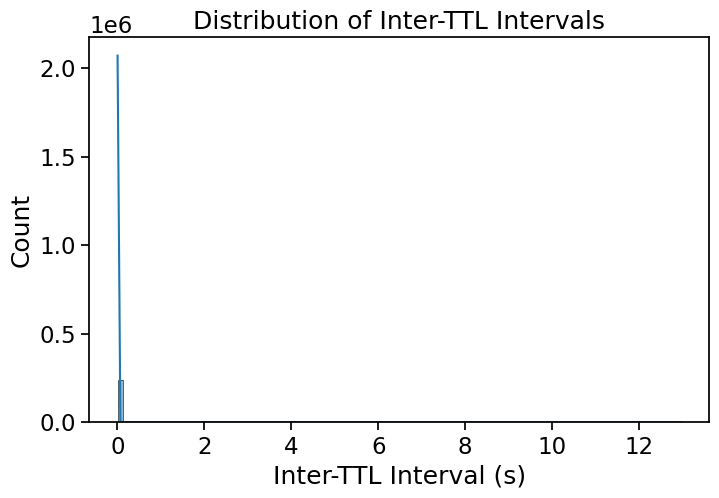

In [134]:
# Loadding in the TTLs
ttl_file = os.path.join(DATA_DIR, 'preprocessing_output', f'supercat_{SESSION_NAME}', f'{SESSION_NAME}_tcat.obx0.obx.xd_6_12_0.adj.txt')
ttls = np.loadtxt(ttl_file)
print("first 10 TTLs (s):", ttls[:10])
print(f"last 10 TTLs (s):", ttls[-10:])
print(f"Number of TTLs: {len(ttls)}")

# plotting the distribution of inter-TTL intervals
ittls = np.diff(ttls)
plt.figure(figsize=(8,5))
sns.histplot(ittls, bins=100, kde=True)
plt.xlabel("Inter-TTL Interval (s)")
plt.ylabel("Count")
plt.title("Distribution of Inter-TTL Intervals")
plt.show()

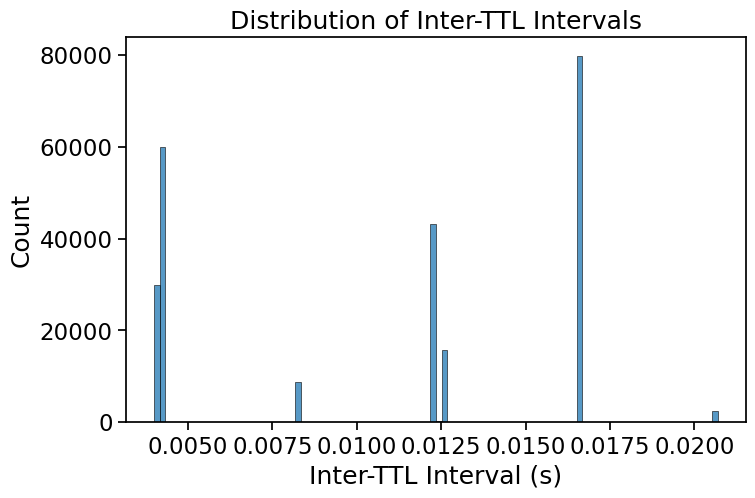

In [135]:
# removing problem TTL time
problem_ttl_indices = [0]
ttls = np.delete(ttls, problem_ttl_indices)
ittls = np.diff(ttls)

plt.figure(figsize=(8,5))
sns.histplot(ittls, bins=100)
plt.xlabel("Inter-TTL Interval (s)")
plt.ylabel("Count")
plt.title("Distribution of Inter-TTL Intervals")
plt.show()

### Now reading in the manually detected rising times
Notice the narrow distribution of inter-TTL times centered on the camera sampling rate

In [136]:
# Loading the manually extracted TTL times
manual_ttl_file = os.path.join(DATA_DIR, 'manual_ttl_extraction.csv')
manual_ttls_df = pd.read_csv(manual_ttl_file)
ttls = manual_ttls_df['ttl_times_sec'].values

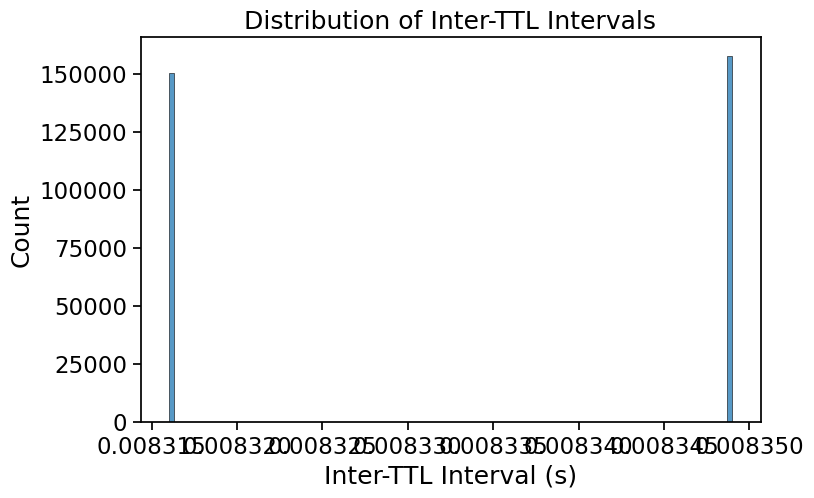

In [137]:
ittls = np.diff(ttls)
plt.figure(figsize=(8,5))
sns.histplot(ittls, bins=100)
plt.xlabel("Inter-TTL Interval (s)")
plt.ylabel("Count")
plt.title("Distribution of Inter-TTL Intervals")
plt.show()


Number of frames: 308232
first row of tracking data: [ 0.00000e+00  0.00000e+00  6.81780e-02 -1.61595e-01 -9.67768e-01
 -1.80732e-01 -1.07200e-03  2.23371e-01  5.83550e-02  4.13000e-04]
Trimming TTLs from 308285 to 308232
Tracking start time: 3926.353 s, end time: 6494.814 s, duration: 2568.461 s


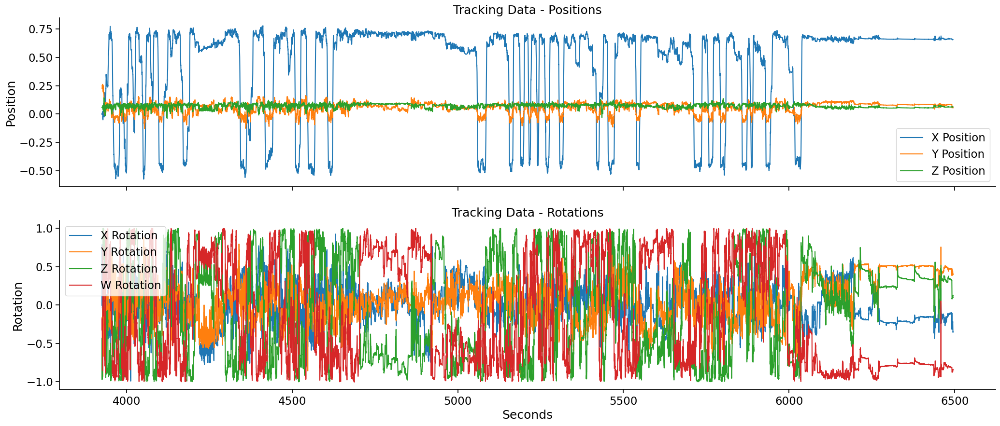

In [138]:
# Loadding in the tracking data
tracking_file = os.path.join(DATA_DIR, "Bilat_R02_20251106_linear_maze_000.csv")
tracking_data = np.genfromtxt(tracking_file, delimiter=",", skip_header=7)
frames = tracking_data[:,0]
print(f'Number of frames: {len(frames)}')
print(f'first row of tracking data: {tracking_data[0,:]}')


# Sometimes there are a few more frames after the last TTL or more TTLs than frames. We will trim the data to the shortest length.
if len(frames) < len(ttls):
    print(f'Trimming TTLs from {len(ttls)} to {len(frames)}')
    ttls = ttls[:len(frames)]
    tracking_data = tracking_data[:len(frames),:]
elif len(frames) > len(ttls):
    print(f'Trimming frames from {len(frames)} to {len(ttls)}')
    frames = frames[:len(ttls)]
    tracking_data = tracking_data[:len(ttls),:]

# printing the start and end times
print(f'Tracking start time: {ttls[0]:.3f} s, end time: {ttls[-1]:.3f} s, duration: {ttls[-1]-ttls[0]:.3f} s')


# fill missing values or nan with linear interpolation
for i in range(tracking_data.shape[1]):
    col = tracking_data[:,i]
    nans = np.isnan(col)
    if np.any(nans):
        not_nans = ~nans
        interp_func_col = interp1d(frames[not_nans], col[not_nans], bounds_error=False, fill_value="extrapolate")
        col[nans] = interp_func_col(frames[nans])
        tracking_data[:,i] = col

# extract x, y, z positions and rotations
x_rotations = tracking_data[:,2]
y_rotations = tracking_data[:,3]
z_rotations = tracking_data[:,4]
w_rotations = tracking_data[:,5]
x_positions = tracking_data[:,6]
y_positions = tracking_data[:,7]
z_positions = tracking_data[:,8]

# Plotting the tracking data
fig, axs = plt.subplots(2, 1, figsize=(25,10), sharex=True)

sns.lineplot(ax=axs[0], x=ttls, y=x_positions, label='X Position')
sns.lineplot(ax=axs[0], x=ttls, y=y_positions, label='Y Position')
sns.lineplot(ax=axs[0], x=ttls, y=z_positions, label='Z Position')
axs[0].set_ylabel('Position')
axs[0].set_title('Tracking Data - Positions')

sns.lineplot(ax=axs[1], x=ttls, y=x_rotations, label='X Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=y_rotations, label='Y Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=z_rotations, label='Z Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=w_rotations, label='W Rotation')
axs[1].set_xlabel('Seconds')
axs[1].set_ylabel('Rotation')
axs[1].set_title('Tracking Data - Rotations')
sns.despine()
#plt.savefig(os.path.join(FIG_DIR, "tracking_data.png"), dpi=300)
plt.show()


In [139]:
# choose which position to use
pos_raw = x_positions  # original position samples aligned to `frames` (units: cm)
assert frames.shape[0] == pos_raw.shape[0]

# compute the velocity
velocity = np.gradient(pos_raw) / np.gradient(ttls)  # velocity in m/s

# getting the running direction
running_direction = np.sign(velocity)

# getting the speed
speed = np.abs(velocity)  # speed in m/s

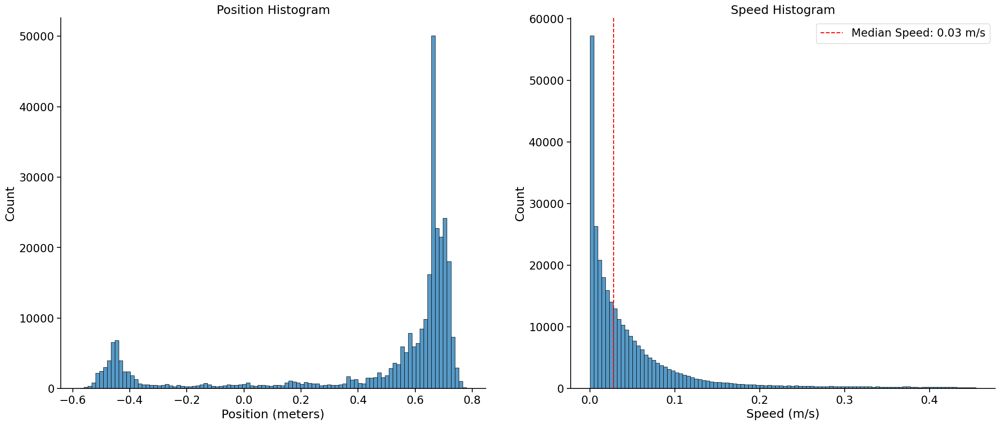

In [140]:
# Plotting some position statistics
fig, axs = plt.subplots(1, 2, figsize=(25,10))
sns.histplot(ax=axs[0], x=pos_raw, bins=100)
axs[0].set_xlabel('Position (meters)')
axs[0].set_ylabel('Count')
axs[0].set_title('Position Histogram')

sns.histplot(ax=axs[1], x=speed[speed < np.percentile(speed, 99)], bins=100)
axs[1].set_xlabel('Speed (m/s)')
axs[1].set_ylabel('Count')
axs[1].set_title('Speed Histogram')
axs[1].axvline(x = np.median(speed), color='red', linestyle='--', label=f'Median Speed: {np.median(speed):.2f} m/s')
axs[1].legend()
sns.despine()
plt.savefig(os.path.join(FIG_DIR, "position_statistics.png"), dpi=300)
plt.show()


## Plotting the place fields organized by region

Using Kullback-Leibler divergence to find best place fields

In [141]:
# -----------------------
# Config
# -----------------------
n_spatial_bins = 100
pos_min, pos_max = -0.5, 0.7
speed_threshold = 0.03  # m/s
threshold = 0  # percentile threshold for Wasserstein distance
regions_of_interest = ['CA1']
cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}
sort_by = 'peak'



# computing the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

pos_interp_func = interp1d(ttls, pos_raw, bounds_error=False, fill_value=np.nan)

# -----------------------
# Precompute per-probe masks and occupancy
# -----------------------
probe_data = {}  # probe -> dict with masks, idx, denom, tb_m, pos_m, spike_rates_m
for probe in PROBES:
    for d in [-1, 0, 1]:
        spike_rate_matrix, tb, units = spike_rate_matrices[probe]  # (n_units, n_timebins)
        ct_probe = np.asarray(cell_types[probe])                    # len == n_units

        # Interpolate position to this probe’s time grid
        pos_probe = pos_interp_func(tb)

        # TTL crop
        start_time, end_time = np.min(ttls), np.max(ttls)
        valid_time = (tb >= start_time) & (tb <= end_time)

        fr = spike_rate_matrix[:, valid_time]
        tb_crop = tb[valid_time]
        pos_crop = pos_probe[valid_time]

        # Direction mask (per timepoint)
        vel = np.gradient(pos_crop, tb_crop)
        direction = np.sign(vel)
        if d == 0:
            direction_mask = np.ones_like(direction, dtype=bool)
        else:
            direction_mask = direction == d

        pos_crop = pos_crop[direction_mask]
        fr = fr[:, direction_mask]
        tb_crop = tb_crop[direction_mask]

        # Drop NaN position samples
        ok = ~np.isnan(pos_crop)
        if ok.sum() == 0:
            print(f"Probe {probe}: no valid samples after TTL/position masking.")
            probe_data[probe, d] = None
            continue

        fr = fr[:, ok]
        pos_crop = pos_crop[ok]
        tb_crop = tb_crop[ok]

        # Speed (smoothed) and moving-mask
        # gradient(pos, time) already gives velocity (m/s)
        speed = np.abs(np.gradient(pos_crop, tb_crop))
        speed = gaussian_filter1d(speed, sigma=3)

        move = speed > speed_threshold
        if move.sum() == 0:
            print(f"Probe {probe}: no samples exceed speed threshold ({speed_threshold} m/s).")
            probe_data[probe, d] = None
            continue

        # Apply moving mask
        fr_m   = fr[:, move]
        pos_m  = pos_crop[move]
        tb_m   = tb_crop[move]

        # Bin positions for this probe
        idx = np.digitize(pos_m, bin_edges, right=True)
        idx = np.clip(idx, 0, n_spatial_bins - 1)

        # Occupancy (counts per spatial bin) for this probe
        denom = np.bincount(idx, minlength=n_spatial_bins).astype(float)
        if denom.sum() == 0:
            print(f"Probe {probe}: zero occupancy across all bins.")
            probe_data[probe, d] = None
            continue

        probe_data[probe, d] = dict(
            fr_m=fr_m, tb_m=tb_m, pos_m=pos_m, idx=idx, denom=denom, ct=ct_probe
        )

# -----------------------
# Build per-(region, celltype) lists of place fields across probes
# -----------------------
panel_pfs = {}  # (row_key, col_key) -> list of 1D PF arrays
panel_wds = {}  # (row_key, col_key) -> list of Wasserstein distances
row_keys = ['Pyramidal', 'Interneuron']
col_keys = list(regions_of_interest)

# Helper to compute one unit's PF using its probe's occupancy
def unit_place_field(fr_unit, idx, denom):
    # weighted average rate per bin: sum(fr at timepoints in bin) / occupancy
    num = np.bincount(idx, weights=fr_unit, minlength=n_spatial_bins).astype(float)
    pf = np.divide(num, denom, out=np.zeros_like(num), where=(denom > 0))

    
    return pf

for hemi in ['L', 'R']:
    for d in [-1, 0, 1]:
        for rkey in row_keys:
            for ckey in col_keys:
                panel_pfs[(rkey, ckey, d, hemi)] = []
                panel_wds[(rkey, ckey, d, hemi)] = []
                
# We need unit-level region labels; `regions[probe]` already holds region per unit (after your earlier mask)
for probe in PROBES:
    rgn_arr = regions[probe]  # (n_units_probe,)
    for d in [-1, 0, 1]:
        pdata = probe_data.get((probe, d), None)
        if pdata is None:
            continue

        fr_m   = pdata['fr_m']       # (n_units_probe, n_timepoints_after_masks)
        idx    = pdata['idx']        # (n_timepoints_after_masks,)
        denom  = pdata['denom']      # (n_spatial_bins,)
        ct_arr = pdata['ct']         # (n_units_probe,)
        rgn_arr = regions[probe]     # (n_units_probe,) region name per unit
        hemi = hemisphere_dict[probe]  # (n_units_probe,) hemisphere per unit
        assert hemi in ['L', 'R']

        for rkey in row_keys:
            allowed_ct = set(cell_type_groups[rkey])
            for ckey in col_keys:

                # Select units that are (this region, this cell-type, this direction)
                unit_sel = np.where((np.isin(ct_arr, list(allowed_ct))) & (rgn_arr == ckey))[0]
                if unit_sel.size == 0:
                    continue

                # Compute place field per selected unit and append
                for u in unit_sel:
                    pf = unit_place_field(fr_m[u, :], idx, denom)
                    panel_pfs[(rkey, ckey, d, hemi)].append(pf)

                    # convert place fields to pmf
                    p_min = pf.min()
                    p = pf - p_min  # shift to non-negative
                    p_sum = p.sum()
                    if p_sum > 0:
                        p = p / p_sum
                    else:
                        p = pf * 0.0

                    
                    
                    S = p.sum()
                    if S <= 0:
                        wdist = 0.0
                    else:
                        p = p / S
                        q = np.full_like(p, 1.0 / p.size)
                        # bin centers as support (in meters)
                        bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
                        wdist = float(wasserstein_distance(bin_centers, bin_centers,
                                                        u_weights=p, v_weights=q))
                    panel_wds[(rkey, ckey, d, hemi)].append(wdist)

   

# -----------------------
# Prepare matrices & global color scale
# -----------------------
panel_mats = {}  # (row_key, col_key) -> 2D array (n_units, n_bins) or None
all_vals = []
for hemi in ['L', 'R']:
    for d in [-1, 0, 1]:
        for rkey in row_keys:
            for ckey in col_keys:

                # extract place fields and wasserstein distances for this panel
                pf_list = panel_pfs[(rkey, ckey, d, hemi)]
                wds_list = panel_wds[(rkey, ckey, d, hemi)]

                # keeping only units with >threshold percentile wasserstein distance
                if len(wds_list) > 0:
                    wd_thresh = np.percentile(wds_list, threshold)
                    pf_list = [pf for pf, wd in zip(pf_list, wds_list) if wd >= wd_thresh]

                if len(pf_list) == 0:
                    panel_mats[(rkey, ckey, d, hemi)] = None
                    continue
                M = np.vstack(pf_list)  # (n_units_in_panel, n_spatial_bins)

                # Sort units by peak bin (descending so earlier peaks at top if you prefer)
                order = np.argsort(np.argmax(M, axis=1))[::-1]
                M = M[order, :]

                panel_mats[(rkey, ckey, d, hemi)] = M
                all_vals.append(M.ravel())

if len(all_vals) == 0:
    raise RuntimeError("No units found for the chosen regions/cell types after masking and binning.")

all_vals = np.concatenate(all_vals)
vmin = np.percentile(all_vals, 2.5)
vmax = np.percentile(all_vals, 97.5)
if vmin == vmax:
    vmax = vmin + 1e-12

    


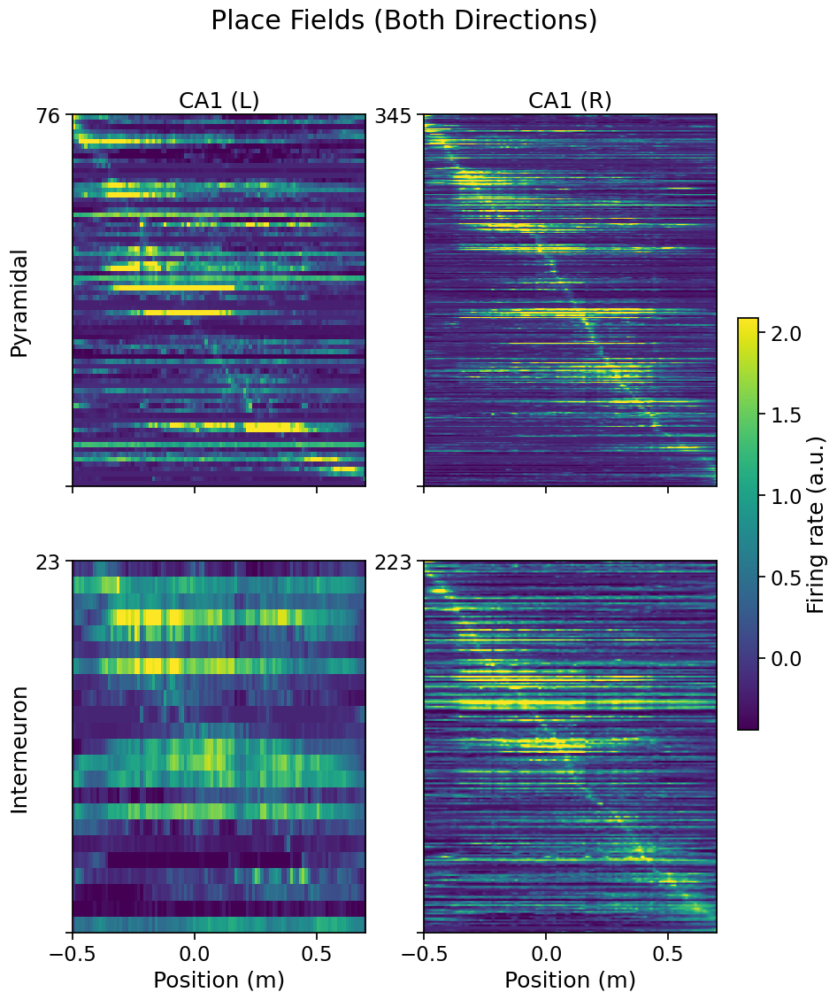

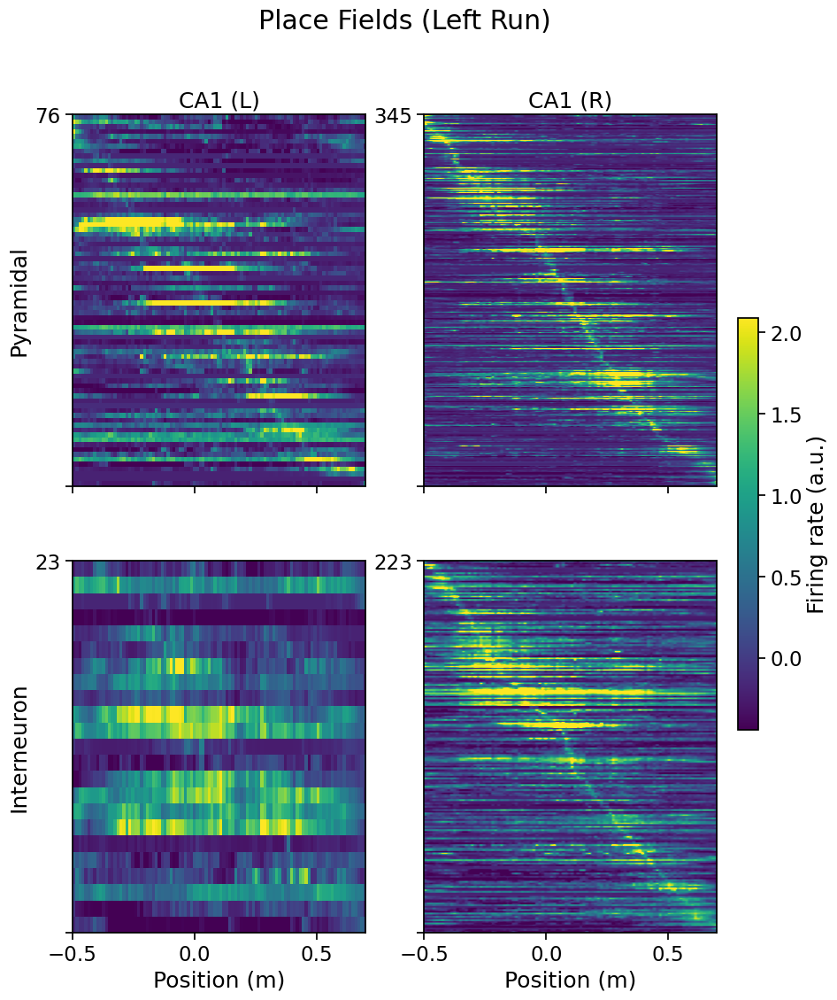

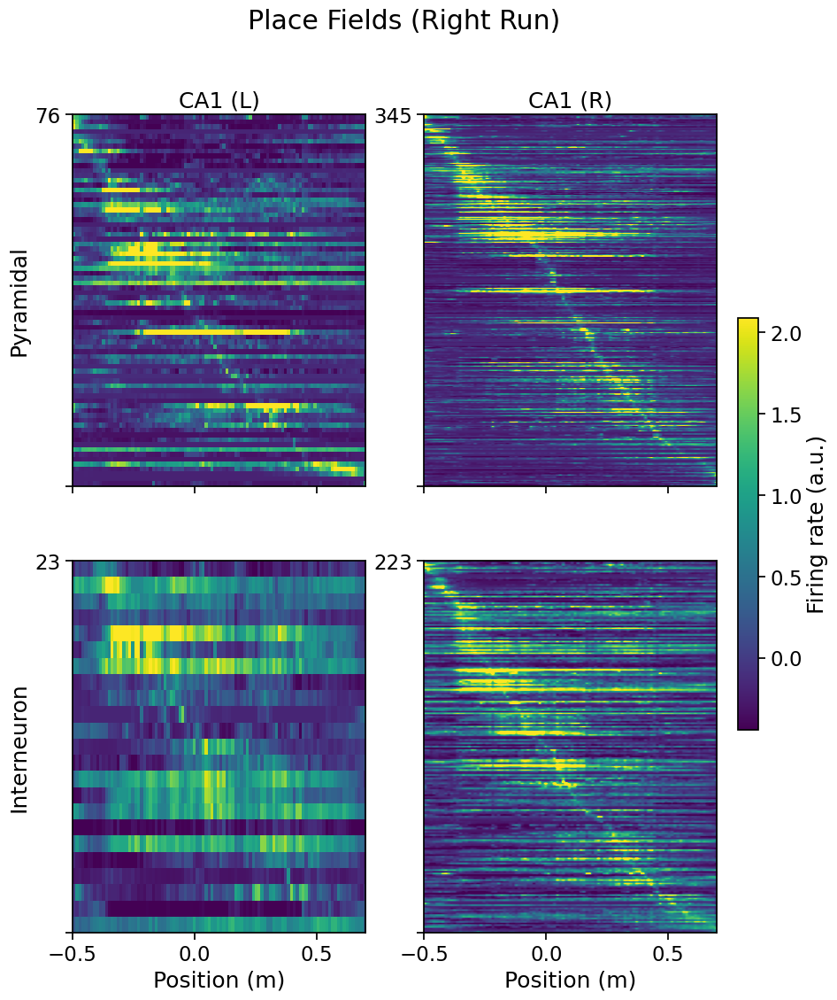

In [142]:

# -----------------------
# Plot
# -----------------------

for direction in [0, -1, 1]:

    n_rows = len(row_keys)                     # e.g. Pyramidal, Interneuron
    n_cols = len(col_keys) * 2                 # two hemispheres per region
    hemispheres = ['L', 'R']

    fig, axs = plt.subplots(
        n_rows, n_cols,
        figsize=(5 * n_cols, 6 * n_rows),
        sharex=True,
        squeeze=False
    )

    first_im = None
    visible_axes = []

    for i, rkey in enumerate(row_keys):        # rows = cell types
        for j_region, ckey in enumerate(col_keys):  # loop over regions
            for h_idx, hemi in enumerate(hemispheres):  # L then R
                j = j_region * 2 + h_idx               # true subplot column index
                ax = axs[i, j]

                M = panel_mats.get((rkey, ckey, direction, hemi))
                if M is None or M.size == 0:
                    ax.set_visible(False)
                    continue

                im = ax.imshow(
                    M,
                    aspect='auto',
                    cmap='viridis',
                    extent=[bin_edges[0], bin_edges[-1], 0, M.shape[0]],
                    vmin=vmin,
                    vmax=vmax,
                    origin='lower'
                )

                if first_im is None:
                    first_im = im
                visible_axes.append(ax)

                # Titles: show region + hemisphere on top row only
                if i == 0:
                    ax.set_title(f"{ckey} ({hemi})")

                # y-axis labels: leftmost column only
                if j == 0:
                    ax.set_ylabel(f"{rkey}")
                else:
                    ax.set_ylabel("")

                # bottom row x-axis label
                if i == n_rows - 1:
                    ax.set_xlabel("Position (m)")

                # simple ytick range label
                ax.set_yticks([0, M.shape[0]])
                ax.set_yticklabels(['', f'{M.shape[0]}'])

    # shared colorbar
    if first_im is not None and visible_axes:
        cbar = fig.colorbar(first_im, ax=visible_axes,
                            orientation='vertical', fraction=0.03, pad=0.03)
        cbar.set_label("Firing rate (a.u.)")

    dir_label = (
        "Both Directions" if direction == 0
        else "Right Run" if direction == 1
        else "Left Run"
    )



    plt.suptitle(f"Place Fields ({dir_label})")
    plt.savefig(os.path.join(FIG_DIR, f"place_fields_{dir_label}.png"), dpi=300)
    plt.show()

## Bayesian decoding of position from spiking activity

In [145]:
# ---- Baysian decoding configuration ----
use_regions = ['CA1']
use_unit_types = ['Pyramidal Cell', 'Narrow Interneuron', 'Wide Interneuron']
n_spatial_bins = 25
pos_min, pos_max = -0.5, 0.7
speed_threshold = 0.00  # m/s


# compute the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

# choose which position to use
pos_raw = x_positions  # original position samples aligned to `frames` (units: m)
assert frames.shape[0] == pos_raw.shape[0]

# Creating interpolation function for position
pos_interp_func = interp1d(ttls, pos_raw, kind = 'linear', bounds_error=False, fill_value=np.nan)

# getting the spike rates for the selected regions
selected_spike_rates_L = []
selected_spike_rates_R = []


# getting reference time from probe with shortest timebins
tb_ref = None
for probe in PROBES:
    _, tb_probe, _ = spike_rate_matrices[probe]
    if tb_ref is None:
        tb_ref = tb_probe
    elif len(tb_probe) < len(tb_ref):
        tb_ref = tb_probe


# Build canonical masks on the *reference* tb_ref
pos_ref = pos_interp_func(tb_ref)
valid_ttl  = (tb_ref >= np.min(ttls)) & (tb_ref <= np.max(ttls))
print(f'number of valid TTL timebins: {valid_ttl.sum()} / {len(tb_ref)}')
finite_pos = np.isfinite(pos_ref)

if speed_threshold > 0:
    vel_ref   = np.gradient(pos_ref, tb_ref)
    speed_ref = gaussian_filter1d(np.abs(vel_ref), sigma=1)
    move_mask = speed_ref > speed_threshold
else:
    move_mask = np.ones_like(tb_ref, dtype=bool)

canon_mask = valid_ttl & finite_pos & move_mask
time_bins  = tb_ref[canon_mask]

# Targets (clip AFTER masking)
pos_canon = pos_ref[canon_mask]



pos_idx   = np.digitize(pos_canon, bin_edges, right=True)
pos_idx   = np.clip(pos_idx, 0, n_spatial_bins - 1)

speed = speed_ref[canon_mask]

for probe in PROBES:

    spike_rate_matrix, probe_times, units = spike_rate_matrices[probe]  # (n_units, n_timebins)
    hemisphere = hemisphere_dict[probe]


    # cropping probe_times to match reference timebins
    #if len(probe_times) != len(tb_ref):
    print(f'Probe {probe} timebins length {len(probe_times)}: reference timebins length {len(tb_ref)}')
    # cropping the probe times to match the reference timebins
    start_time, end_time = np.min(tb_ref), np.max(tb_ref)
    valid_time_probe = (probe_times >= start_time) & (probe_times <= end_time)
    # check if all time values are now equal
    probe_times = probe_times[valid_time_probe]
    spike_rate_matrix = spike_rate_matrix[:, valid_time_probe]
        
    if np.allclose(probe_times, tb_ref, rtol=0, atol=1e-9):
        print(f'Probe {probe} timebins successfully matched to reference timebins after cropping.')
        print(f'sum of differences: {np.sum(probe_times - tb_ref)}\n')
    else:
        raise ValueError(f'Probe {probe} timebins do not match reference timebins after cropping. Lengths: {len(probe_times)} vs {len(tb_ref)}')


    # filtering out timebins outside the TTL range and speed threshold
    spike_rate_matrix = spike_rate_matrix[:, canon_mask]



    ct_probe = np.asarray(cell_types[probe])                    # len == n_units
    rgn_arr = regions[probe]                                   # len == n_units

    # select units from the selected regions
    unit_sel = np.where(
        (np.isin(ct_probe, use_unit_types)) &
        (np.isin(rgn_arr, use_regions))
    )[0]
    if unit_sel.size == 0:
        continue

    if hemisphere == 'L':
        selected_spike_rates_L.append(spike_rate_matrix[unit_sel, :])
    elif hemisphere == 'R':
        selected_spike_rates_R.append(spike_rate_matrix[unit_sel, :])
    else:
        raise ValueError(f'Unknown hemisphere {hemisphere} for probe {probe}')

# concatenating the selected spike rates across probes
if len(selected_spike_rates_L) == 0 and len(selected_spike_rates_R) == 0:
    raise RuntimeError("No units found for the chosen regions after filtering.")

spike_rates_concat_L = np.vstack(selected_spike_rates_L) if len(selected_spike_rates_L) > 0 else np.empty((0, 0))
spike_rates_concat_R = np.vstack(selected_spike_rates_R) if len(selected_spike_rates_R) > 0 else np.empty((0, 0))


# sort the units based on correlation
spike_rates_concat_L = sort_units(spike_rates_concat_L, mode='corr')
spike_rates_concat_R = sort_units(spike_rates_concat_R, mode='corr')

vmin = np.percentile(np.concatenate([spike_rates_concat_L.ravel(), spike_rates_concat_R.ravel()]), 2.5)
vmax = np.percentile(np.concatenate([spike_rates_concat_L.ravel(), spike_rates_concat_R.ravel()]), 97.5)




number of valid TTL timebins: 64212 / 263023
Probe 0 timebins length 263023: reference timebins length 263023
Probe 0 timebins successfully matched to reference timebins after cropping.
sum of differences: 0.0

Probe 1 timebins length 263023: reference timebins length 263023
Probe 1 timebins successfully matched to reference timebins after cropping.
sum of differences: 0.0

Probe 2 timebins length 263023: reference timebins length 263023
Probe 2 timebins successfully matched to reference timebins after cropping.
sum of differences: 0.0

Probe 3 timebins length 263023: reference timebins length 263023
Probe 3 timebins successfully matched to reference timebins after cropping.
sum of differences: 0.0



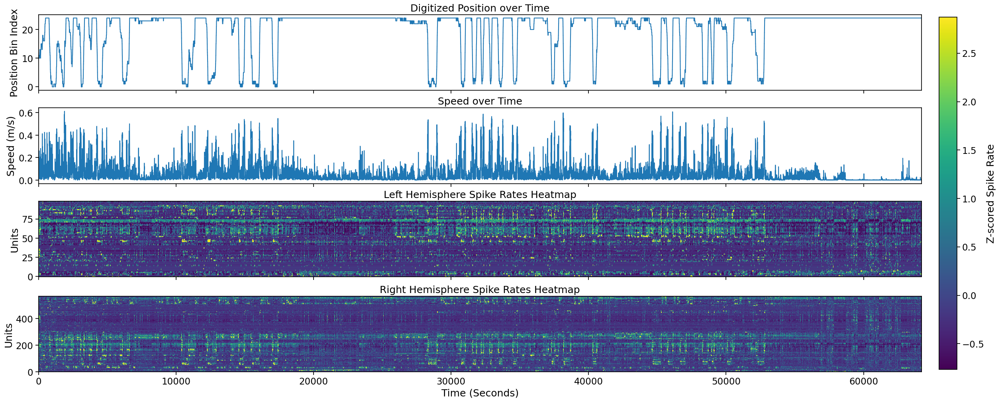

In [146]:
# plotting the digitized positions and the spike rates

dt = np.median(np.diff(time_bins))
n_units_L = spike_rates_concat_L.shape[0]
n_units_R = spike_rates_concat_R.shape[0]
xmin = time_bins[0] - 0.5*dt
xmax = time_bins[-1] + 0.5*dt

fig, axs = plt.subplots(4, 1, figsize=(25, 10), sharex=True, constrained_layout=True)

# Top: line
axs[1].plot(speed)
axs[1].set_ylabel('Speed (m/s)')
axs[1].set_title('Speed over Time')
axs[0].plot(pos_idx)
axs[0].set_ylabel('Position Bin Index')
axs[0].set_title('Digitized Position over Time')

# Bottom: heatmap with true x via extent
im = axs[2].imshow(
    spike_rates_concat_L, aspect='auto', origin='lower',
    #extent=[xmin, xmax, 0, n_units_L],
    vmin=vmin, vmax=vmax, cmap='viridis'
)
axs[2].set_title('Left Hemisphere Spike Rates Heatmap')

# Bottom: heatmap with true x via extent
im = axs[3].imshow(
    spike_rates_concat_R, aspect='auto', origin='lower',
    #extent=[xmin, xmax, 0, n_units_R],
    vmin=vmin, vmax=vmax, cmap='viridis'
)
axs[3].set_title('Right Hemisphere Spike Rates Heatmap')

# Force identical x-lims on both axes


# Colorbar attached to BOTH axes so layout stays symmetric
cbar = fig.colorbar(im, ax=axs, location='right', fraction=0.02, pad=0.02)
cbar.set_label('Z-scored Spike Rate')

axs[3].set_xlabel('Time (Seconds)')
axs[2].set_ylabel('Units')
axs[3].set_ylabel('Units')

#plt.savefig(os.path.join(FIG_DIR, "spike_rates_and_position.png"), dpi=300)
plt.show()

In [114]:
def hardcastle_test_mask(N, k, k_CV=10, n_blocks=10):
    """
    Recreate the test mask used in cv_split for data of length N.
    """
    block_size = N // n_blocks
    mask_test = np.zeros(N, dtype=bool)
    
    for block in range(n_blocks):
        i_start = int((block + k / k_CV) * block_size)
        i_stop = int(i_start + block_size // k_CV)
        mask_test[i_start:i_stop] = True

    return mask_test


In [115]:
# running the decoder 
dataset_L = DecoderDataset(spike_rates_concat_L, pos_idx)
dataset_R = DecoderDataset(spike_rates_concat_R, pos_idx)

decoder = GaussianBayesDecoder(n_bins=n_spatial_bins, var_floor=1e-4, uniform_prior=True)
k_CV = 10
n_blocks = 3

T_full = dataset_L.X.shape[1]  # total number of timepoints (same for L/R)

# preallocate stitched arrays
posteriors_L = np.full((n_spatial_bins, T_full), np.nan, dtype=float)
posteriors_R = np.full((n_spatial_bins, T_full), np.nan, dtype=float)

Y_true_full = np.full(T_full, np.nan, dtype=float)
Y_pred_full = np.full(T_full, np.nan, dtype=float)  # if you want global predicted track

for k in range(k_CV):
    # reconstruct test mask in original time
    mask_test = hardcastle_test_mask(T_full, k=k, k_CV=k_CV, n_blocks=n_blocks)

    # Left hemisphere
    (X_train_L, Y_train_L), (X_test_L, Y_test_L), train_switch_ind_L, test_switch_ind_L = dataset_L.split(
        k=k, k_CV=k_CV, n_blocks=n_blocks
    )
    decoder.fit(X_train_L, Y_train_L)
    log_probs_test_L = decoder.predict_log_probabilities(X_test_L)  # (n_bins, n_test_k)
    log_post_L = log_probs_test_L - logsumexp(log_probs_test_L, axis=0, keepdims=True)
    to_plot_L = np.exp(log_post_L)  # posterior probs
    Y_pred_test_L = decoder.predict(X_test_L)  # (n_test_k,)

    # Right hemisphere
    (X_train_R, Y_train_R), (X_test_R, Y_test_R), train_switch_ind_R, test_switch_ind_R = dataset_R.split(
        k=k, k_CV=k_CV, n_blocks=n_blocks
    )
    decoder.fit(X_train_R, Y_train_R)
    log_probs_test_R = decoder.predict_log_probabilities(X_test_R)
    log_post_R = log_probs_test_R - logsumexp(log_probs_test_R, axis=0, keepdims=True)
    to_plot_R = np.exp(log_post_R)
    Y_pred_test_R = decoder.predict(X_test_R)

    # sanity: number of test samples should match mask_test sum
    assert to_plot_L.shape[1] == mask_test.sum()
    assert to_plot_R.shape[1] == mask_test.sum()
    assert Y_test_L.shape[0] == mask_test.sum()

    # stitch into full-length arrays (same mask for L/R because X_L and X_R aligned)
    posteriors_L[:, mask_test] = to_plot_L
    posteriors_R[:, mask_test] = to_plot_R

    # true and predicted positions (use Left's Y for ground truth)
    Y_true_full[mask_test] = Y_test_L
    # you could also average L/R predictions or choose one; here I use Left:
    Y_pred_full[mask_test] = Y_pred_test_L


In [116]:
to_plot_L_wake = posteriors_L
to_plot_R_wake = posteriors_R
T = to_plot_L_wake.shape[1]

TIME_OFFSET = WINDOW_SIZE / 2.0
total_time = TIME_OFFSET + (T - 1) * STEP_SIZE
DEFAULT_DURATION_SEC = total_time / 50.0  # show 1/50 of session by default

def plot_segment_wake(start_sec=0.0, duration_sec=DEFAULT_DURATION_SEC):
    # clamp
    start_sec = max(0.0, min(start_sec, total_time))
    duration_sec = max(STEP_SIZE, duration_sec)

    # seconds → bin indices
    start_bin = int(round((start_sec - TIME_OFFSET) / STEP_SIZE))
    start_bin = max(0, min(start_bin, T - 1))

    end_sec = start_sec + duration_sec
    end_sec = min(end_sec, total_time)

    end_bin = int(round((end_sec - TIME_OFFSET) / STEP_SIZE)) + 1
    end_bin = max(start_bin + 1, min(end_bin, T))

    # x-range in seconds
    x_min = TIME_OFFSET + start_bin * STEP_SIZE
    x_max = TIME_OFFSET + (end_bin - 1) * STEP_SIZE
    y_min = 0
    y_max = to_plot_L_wake.shape[0]

    fig, axs = plt.subplots(2, 1, figsize=(20, 10), sharex=True)
    axL, axR = axs

    for side, to_plot, ax in zip(
        ['Left', 'Right'],
        [to_plot_L_wake, to_plot_R_wake],
        [axL, axR]
    ):
        # ignore any NaNs when computing vmin/vmax (shouldn’t be any if stitching worked)
        vmin = np.nanpercentile(to_plot, 2.5)
        vmax = np.nanpercentile(to_plot, 97.5)

        im = ax.imshow(
            to_plot[:, start_bin:end_bin],
            aspect='auto',
            origin='lower',
            cmap='viridis',
            vmin=vmin,
            vmax=vmax,
            extent=[x_min, x_max, y_min, y_max]
        )

        # overlay true position
        t_slice = np.linspace(x_min, x_max, end_bin - start_bin)
        y_true_slice = Y_true_full[start_bin:end_bin]

        ax.plot(
            t_slice,
            y_true_slice,
            color='k',
            alpha=0.4,
            linewidth=2,
            label='True position'
        )

        ax.set_ylabel('Position bins')
        ax.set_title(f'{side} Hemisphere Wake Decoding ')

    axR.set_xlabel('Time (s)')
    plt.tight_layout()
    plt.show()


# interactive sliders
interact(
    plot_segment_wake,
    start_sec=FloatSlider(
        min=0.0,
        max=total_time,
        step=1.0,
        value=0.0,
        description='Start (s)'
    ),
    duration_sec=FloatSlider(
        min=STEP_SIZE,
        max=total_time,
        step=1.0,
        value=DEFAULT_DURATION_SEC,
        description='Duration (s)'
    )
)

interactive(children=(FloatSlider(value=0.0, description='Start (s)', max=1247.44, step=1.0), FloatSlider(valu…

<function __main__.plot_segment_wake(start_sec=0.0, duration_sec=24.948800000000002)>

## Training the decoder on the wake period and testing on durring sleep

In [117]:

# getting the spike rates for the selected regions
selected_spike_rates_wake_R = []
selected_spike_rates_wake_L = []
selected_spike_rates_sleep_R = []
selected_spike_rates_sleep_L = []

for probe in PROBES:

    #load in the spike rates
    spike_rate_matrix, tb, units = spike_rate_matrices[probe]  # (n_units, n_timebins)


    pos = pos_interp_func(tb)
    pos_idx = np.digitize(pos, bin_edges, right=True)

    # filtering out timebins outside the TTL range
    wake_time = (tb >= np.min(ttls)) & (tb <= np.max(ttls))
    sleep_time = ~wake_time
    transition_point = np.searchsorted(tb, np.min(ttls))

    spike_rate_matrix_wake = spike_rate_matrix[:, wake_time]
    spike_rate_matrix_sleep = spike_rate_matrix[:, sleep_time]
    time_bins_wake = tb[wake_time]
    time_bins_sleep = tb[sleep_time]
    pos_idx = pos_idx[wake_time]

    speed = np.abs(np.gradient(pos[wake_time]) / np.gradient(tb[wake_time]))
    speed = gaussian_filter1d(speed, sigma=1)
    move = speed > speed_threshold
    spike_rate_matrix_wake = spike_rate_matrix_wake[:, move]
    time_bins_wake = time_bins_wake[move]
    pos_idx = pos_idx[move]
    speed = speed[move]


    ct_probe = np.asarray(cell_types[probe])                    # len == n_units
    rgn_arr = regions[probe]                                   # len == n_units

    # select units from the selected regions
    unit_sel = np.where(
        (np.isin(ct_probe, use_unit_types)) &
        (np.isin(rgn_arr, use_regions))
    )[0]
    if unit_sel.size == 0:
        continue
    
    if hemisphere_dict[probe] == 'L':
        selected_spike_rates_wake_L.append(spike_rate_matrix_wake[unit_sel, :])
        selected_spike_rates_sleep_L.append(spike_rate_matrix_sleep[unit_sel, :])
    elif hemisphere_dict[probe] == 'R':
        selected_spike_rates_wake_R.append(spike_rate_matrix_wake[unit_sel, :])
        selected_spike_rates_sleep_R.append(spike_rate_matrix_sleep[unit_sel, :])
    else:
        raise ValueError(f'Unknown hemisphere {hemisphere_dict[probe]} for probe {probe}')



# concatenating the selected spike rates across probes
spike_rates_wake_L = np.vstack(selected_spike_rates_wake_L) if len(selected_spike_rates_wake_L) > 0 else np.empty((0, 0))
spike_rates_wake_R = np.vstack(selected_spike_rates_wake_R) if len(selected_spike_rates_wake_R) > 0 else np.empty((0, 0))
spike_rates_sleep_L = np.vstack(selected_spike_rates_sleep_L) if len(selected_spike_rates_sleep_L) > 0 else np.empty((0, 0))
spike_rates_sleep_R = np.vstack(selected_spike_rates_sleep_R) if len(selected_spike_rates_sleep_R) > 0 else np.empty((0, 0))



In [118]:
decoder = GaussianBayesDecoder(n_bins=n_spatial_bins, var_floor=1e-4, uniform_prior=True)

to_plot_R = None
to_plot_L = None
for side in ['Left', 'Right']:
    if side == 'Left':
        spike_rates_wake = spike_rates_wake_L
        spike_rates_sleep = spike_rates_sleep_L
    else:
        spike_rates_wake = spike_rates_wake_R
        spike_rates_sleep = spike_rates_sleep_R

    print(f'\nDecoding for {side} Hemisphere:')
    print(f'Wake spike rates shape: {spike_rates_wake.shape}')
    print(f'Sleep spike rates shape: {spike_rates_sleep.shape}')

    # split the dataset into training and testing sets
    X_train = spike_rates_wake
    Y_train = pos_idx
    X_test = spike_rates_sleep
    Y_test = np.zeros(X_test.shape[1], dtype=int)  # dummy, as we don't have true positions during sleep

    print(f"Training set: X_train={X_train.shape}, Y_train={Y_train.shape}")
    print(f"Testing set: X_test={X_test.shape}, Y_test={Y_test.shape}")

    # fit the decoder
    decoder.fit(X_train, Y_train)

    # predict on the test set
    log_probs_test = decoder.predict_log_probabilities(X_test)  # shape: (n_bins, n_timepoints)
    log_post = log_probs_test - logsumexp(log_probs_test, axis=0, keepdims=True)  # normalize to get log posterior
    to_plot = np.exp(log_post).astype(np.float32)  # shape: (n_bins, n_timepoints)
    Y_pred_test = decoder.predict(X_test)  # shape: (n_timepoints,)
    if side == 'Left':
        to_plot_L = to_plot
    else:
        to_plot_R = to_plot






Decoding for Left Hemisphere:
Wake spike rates shape: (99, 62377)
Sleep spike rates shape: (99, 397623)
Training set: X_train=(99, 62377), Y_train=(62377,)
Testing set: X_test=(99, 397623), Y_test=(397623,)

Decoding for Right Hemisphere:
Wake spike rates shape: (568, 62377)
Sleep spike rates shape: (568, 397623)
Training set: X_train=(568, 62377), Y_train=(62377,)
Testing set: X_test=(568, 397623), Y_test=(397623,)


### Getting the sleep state

In [119]:


# loading the sleep states
state_scoring_file = os.path.join(DATA_DIR, f'{BASE_NAME}_imec2.SleepState.states.mat')
mat = loadmat(state_scoring_file, squeeze_me=True, struct_as_record=False)

SleepState = mat['SleepState']       # MATLAB struct → Python object
states = SleepState.idx.states       # access idx.states hierarchy
states = (states + 1) // 2 
state_names = SleepState.idx.statenames  # access state names
idx = [0, 2, 4]
state_names = [SleepState.idx.statenames[i] for i in idx]

# resample the states (aligned to LFPs) to the decoder timebins
state_times = SleepState.idx.timestamps   # time vector for states in seconds

state_interp_func = interp1d(state_times, states, kind='nearest', bounds_error=False, fill_value='extrapolate')
decoder_time_states = state_interp_func(time_bins_sleep).astype(int)  # align to decoder time bins during sleep
print(f'Decoder time states shape: {decoder_time_states.shape}')

print(state_names)



Decoder time states shape: (397623,)
['WAKE', 'NREM', 'REM']


In [ ]:
from matplotlib.gridspec import GridSpec
T = to_plot_L.shape[1]

# total time (using window centers)
TIME_OFFSET = WINDOW_SIZE / 2.0
total_time = TIME_OFFSET + (T - 1) * STEP_SIZE

# default duration in seconds
DEFAULT_DURATION_SEC = total_time / 100

# make sure states are ints
decoder_time_states = np.asarray(decoder_time_states).astype(int)

# assume codes are 1..N
n_states = len(state_names)
# simple discrete colormap (use any qualitative cmap you like)
base_colors = plt.cm.tab10.colors  # has at least 10 distinct colors
cmap_states = ListedColormap(base_colors[:n_states])

valid_codes = np.unique(decoder_time_states)
valid_codes = valid_codes[valid_codes > 0]     # ensure positive integer states
valid_labels = [state_names[c - 1] for c in valid_codes]



def plot_segment(start_sec=0.0, duration_sec=DEFAULT_DURATION_SEC):
    # clamp
    start_sec = max(0.0, min(start_sec, total_time))
    duration_sec = max(STEP_SIZE, duration_sec)

    # seconds → bin indices
    start_bin = int(round((start_sec - TIME_OFFSET) / STEP_SIZE))
    start_bin = max(0, min(start_bin, T - 1))

    end_sec = start_sec + duration_sec
    end_sec = min(end_sec, total_time)

    end_bin = int(round((end_sec - TIME_OFFSET) / STEP_SIZE)) + 1
    end_bin = max(start_bin + 1, min(end_bin, T))

    # x-range (seconds)
    x_min = TIME_OFFSET + start_bin * STEP_SIZE
    x_max = TIME_OFFSET + (end_bin - 1) * STEP_SIZE
    y_min = 0
    y_max = to_plot_L.shape[0]

    fig = plt.figure(figsize=(20, 10))
    # 3 rows, 2 columns: left = data axes, right = colorbar
    gs = GridSpec(
        3, 2,
        figure=fig,
        width_ratios=[20, 1],          # wide data column, narrow cbar column
        height_ratios=[3, 3, 0.5]      # same ratios you had before
    )

    axL = fig.add_subplot(gs[0, 0])
    axR = fig.add_subplot(gs[1, 0], sharex=axL)
    axState = fig.add_subplot(gs[2, 0], sharex=axL)

    # ====== HEATMAPS =======
    for side, to_plot, ax in zip(
        ['Left', 'Right'],
        [to_plot_L, to_plot_R],
        [axL, axR]
    ):
        vmin = np.percentile(to_plot, 2.5)
        vmax = np.percentile(to_plot, 97.5)

        ax.imshow(
            to_plot[:, start_bin:end_bin],
            aspect='auto',
            origin='lower',
            cmap='viridis',
            vmin=vmin,
            vmax=vmax,
            extent=[x_min, x_max, y_min, y_max]
        )
        ax.set_ylabel('Position bins')
        ax.set_title(f'{side} Hemisphere Decoding')

    axL.tick_params(labelbottom=False)
    axR.set_xlabel("Time (s)")

    # ====== STATE BAR ======
    state_slice = decoder_time_states[start_bin:end_bin]
    state_img = state_slice[np.newaxis, :]

    im_state = axState.imshow(
        state_img,
        aspect='auto',
        origin='lower',
        cmap=cmap_states,
        extent=[x_min, x_max, 0, 1],
        vmin=0.5,
        vmax=n_states + 0.5
    )

    axState.set_yticks([])
    axState.set_ylabel('')
    axState.set_title("")

    # ====== COLORBAR IN ITS OWN COLUMN ======
    cax = fig.add_subplot(gs[2:, 1])  # spans all 3 rows on the right

    cbar = fig.colorbar(im_state, cax=cax, orientation='vertical')
    cbar.set_ticks(valid_codes)
    cbar.set_ticklabels(valid_labels)
    cbar.ax.tick_params(labelsize=8)

    plt.tight_layout()  # safe now
    plt.show()



# interactive widgets (seconds)
interact(
    plot_segment,
    start_sec=FloatSlider(
        min=0.0,
        max=total_time,
        step=1.0,
        value=0.0,
        description='Start (s)'
    ),
    duration_sec=FloatSlider(
        min=STEP_SIZE,
        max=total_time,
        step=1.0,
        value=DEFAULT_DURATION_SEC,
        description='Duration (s)'
    )
)



interactive(children=(FloatSlider(value=0.0, description='Start (s)', max=7952.460000000001, step=1.0), FloatS…

<function __main__.plot_segment(start_sec=0.0, duration_sec=79.5246)>

# Using the Poor man's Gaussian process latent variable model

In [121]:
# ---- Baysian decoding configuration ----
use_regions = ['CA1']
use_unit_types = ['Pyramidal Cell']
n_spatial_bins = 25
pos_min, pos_max = -0.5, 0.7
speed_threshold = 0.00  # m/s


# compute the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

# choose which position to use
pos_raw = x_positions  # original position samples aligned to `frames` (units: m)
assert frames.shape[0] == pos_raw.shape[0]

# Creating interpolation function for position
pos_interp_func = interp1d(ttls, pos_raw, kind = 'linear', bounds_error=False, fill_value=np.nan)

# getting the spike rates for the selected regions
selected_spike_rates_L = []
selected_spike_rates_R = []


# getting reference time from probe with shortest timebins
tb_ref = None
for probe in PROBES:
    _, tb_probe, _ = spike_rate_matrices[probe]
    if tb_ref is None:
        tb_ref = tb_probe
    elif len(tb_probe) < len(tb_ref):
        tb_ref = tb_probe


# Build canonical masks on the *reference* tb_ref
pos_ref = pos_interp_func(tb_ref)
valid_ttl  = (tb_ref >= np.min(ttls)) & (tb_ref <= np.max(ttls))
print(f'number of valid TTL timebins: {valid_ttl.sum()} / {len(tb_ref)}')
finite_pos = np.isfinite(pos_ref)

if speed_threshold > 0:
    vel_ref   = np.gradient(pos_ref, tb_ref)
    speed_ref = gaussian_filter1d(np.abs(vel_ref), sigma=1)
    move_mask = speed_ref > speed_threshold
else:
    move_mask = np.ones_like(tb_ref, dtype=bool)

canon_mask = valid_ttl & finite_pos & move_mask
time_bins  = tb_ref[canon_mask]

# Targets (clip AFTER masking)
pos_canon = pos_ref[canon_mask]



pos_idx   = np.digitize(pos_canon, bin_edges, right=True)
pos_idx   = np.clip(pos_idx, 0, n_spatial_bins - 1)

speed = speed_ref[canon_mask]

for probe in PROBES:

    spike_rate_matrix, probe_times, units = spike_rate_matrices[probe]  # (n_units, n_timebins)
    hemisphere = hemisphere_dict[probe]


    # cropping probe_times to match reference timebins
    #if len(probe_times) != len(tb_ref):
    print(f'Probe {probe} timebins length {len(probe_times)}: reference timebins length {len(tb_ref)}')
    # cropping the probe times to match the reference timebins
    start_time, end_time = np.min(tb_ref), np.max(tb_ref)
    valid_time_probe = (probe_times >= start_time) & (probe_times <= end_time)
    # check if all time values are now equal
    probe_times = probe_times[valid_time_probe]
    spike_rate_matrix = spike_rate_matrix[:, valid_time_probe]
        
    if np.allclose(probe_times, tb_ref, rtol=0, atol=1e-9):
        print(f'Probe {probe} timebins successfully matched to reference timebins after cropping.')
        print(f'sum of differences: {np.sum(probe_times - tb_ref)}\n')
    else:
        raise ValueError(f'Probe {probe} timebins do not match reference timebins after cropping. Lengths: {len(probe_times)} vs {len(tb_ref)}')


    # filtering out timebins outside the TTL range and speed threshold
    spike_rate_matrix = spike_rate_matrix[:, canon_mask]



    ct_probe = np.asarray(cell_types[probe])                    # len == n_units
    rgn_arr = regions[probe]                                   # len == n_units

    # select units from the selected regions
    unit_sel = np.where(
        (np.isin(ct_probe, use_unit_types)) &
        (np.isin(rgn_arr, use_regions))
    )[0]
    if unit_sel.size == 0:
        continue

    if hemisphere == 'L':
        selected_spike_rates_L.append(spike_rate_matrix[unit_sel, :])
    elif hemisphere == 'R':
        selected_spike_rates_R.append(spike_rate_matrix[unit_sel, :])
    else:
        raise ValueError(f'Unknown hemisphere {hemisphere} for probe {probe}')

# concatenating the selected spike rates across probes
if len(selected_spike_rates_L) == 0 and len(selected_spike_rates_R) == 0:
    raise RuntimeError("No units found for the chosen regions after filtering.")

spike_rates_concat_L = np.vstack(selected_spike_rates_L) if len(selected_spike_rates_L) > 0 else np.empty((0, 0))
spike_rates_concat_R = np.vstack(selected_spike_rates_R) if len(selected_spike_rates_R) > 0 else np.empty((0, 0))


# sort the units based on correlation
spike_rates_concat_L = sort_units(spike_rates_concat_L, mode='corr')
spike_rates_concat_R = sort_units(spike_rates_concat_R, mode='corr')

vmin = np.percentile(np.concatenate([spike_rates_concat_L.ravel(), spike_rates_concat_R.ravel()]), 2.5)
vmax = np.percentile(np.concatenate([spike_rates_concat_L.ravel(), spike_rates_concat_R.ravel()]), 97.5)




number of valid TTL timebins: 128423 / 526046
Probe 0 timebins length 526046: reference timebins length 526046
Probe 0 timebins successfully matched to reference timebins after cropping.
sum of differences: 0.0

Probe 1 timebins length 526046: reference timebins length 526046
Probe 1 timebins successfully matched to reference timebins after cropping.
sum of differences: 0.0

Probe 2 timebins length 526046: reference timebins length 526046
Probe 2 timebins successfully matched to reference timebins after cropping.
sum of differences: 0.0

Probe 3 timebins length 526046: reference timebins length 526046
Probe 3 timebins successfully matched to reference timebins after cropping.
sum of differences: 0.0



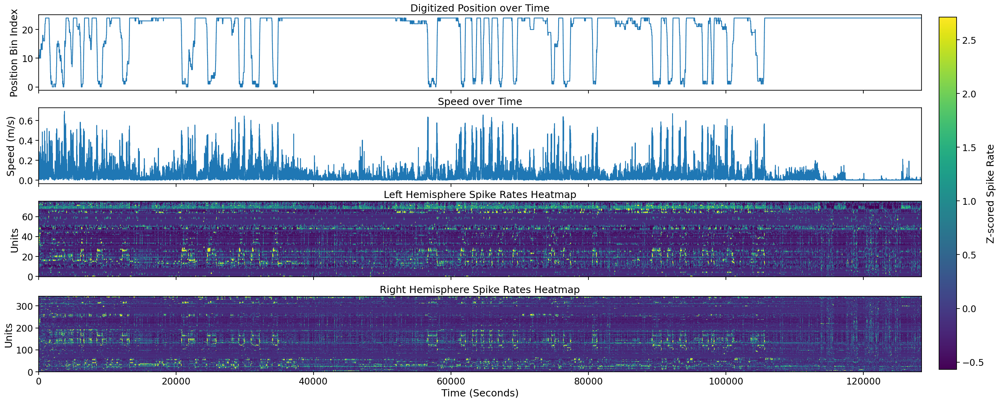

In [122]:
# plotting the digitized positions and the spike rates

dt = np.median(np.diff(time_bins))
n_units_L = spike_rates_concat_L.shape[0]
n_units_R = spike_rates_concat_R.shape[0]
xmin = time_bins[0] - 0.5*dt
xmax = time_bins[-1] + 0.5*dt

fig, axs = plt.subplots(4, 1, figsize=(25, 10), sharex=True, constrained_layout=True)

# Top: line
axs[1].plot(speed)
axs[1].set_ylabel('Speed (m/s)')
axs[1].set_title('Speed over Time')
axs[0].plot(pos_idx)
axs[0].set_ylabel('Position Bin Index')
axs[0].set_title('Digitized Position over Time')

# Bottom: heatmap with true x via extent
im = axs[2].imshow(
    spike_rates_concat_L, aspect='auto', origin='lower',
    #extent=[xmin, xmax, 0, n_units_L],
    vmin=vmin, vmax=vmax, cmap='viridis'
)
axs[2].set_title('Left Hemisphere Spike Rates Heatmap')

# Bottom: heatmap with true x via extent
im = axs[3].imshow(
    spike_rates_concat_R, aspect='auto', origin='lower',
    #extent=[xmin, xmax, 0, n_units_R],
    vmin=vmin, vmax=vmax, cmap='viridis'
)
axs[3].set_title('Right Hemisphere Spike Rates Heatmap')

# Force identical x-lims on both axes


# Colorbar attached to BOTH axes so layout stays symmetric
cbar = fig.colorbar(im, ax=axs, location='right', fraction=0.02, pad=0.02)
cbar.set_label('Z-scored Spike Rate')

axs[3].set_xlabel('Time (Seconds)')
axs[2].set_ylabel('Units')
axs[3].set_ylabel('Units')

#plt.savefig(os.path.join(FIG_DIR, "spike_rates_and_position.png"), dpi=300)
plt.show()

In [124]:
from tqdm import tqdm

Niters = 1000

new_pos_idx_L = pos_idx.copy()
new_pos_idx_R = pos_idx.copy()
diffs_L = []
diffs_R = []

k_CV = 10
n_blocks = 3
n_bins = n_spatial_bins

# total number of timepoints (assumed fixed)
T_full = spike_rates_concat_L.shape[1]

# ground truth (original labels) – only need this once
Y_true_full = np.full(T_full, np.nan, dtype=float)

for iter in tqdm(range(Niters), desc="Decoder Fitting Iterations"):

    # build datasets from current labels
    dataset_L = DecoderDataset(spike_rates_concat_L, new_pos_idx_L)
    dataset_R = DecoderDataset(spike_rates_concat_R, new_pos_idx_R)

    # per-iteration full-length predictions
    Y_pred_full_L_iter = np.full(T_full, -1, dtype=int)
    Y_pred_full_R_iter = np.full(T_full, -1, dtype=int)

    # (optional) per-iteration posteriors if you actually use them
    posteriors_L = np.full((n_bins, T_full), np.nan, dtype=float)
    posteriors_R = np.full((n_bins, T_full), np.nan, dtype=float)

    decoder_L = GaussianBayesDecoder(n_bins=n_bins, var_floor=1e-4, uniform_prior=False)
    decoder_R = GaussianBayesDecoder(n_bins=n_bins, var_floor=1e-4, uniform_prior=False)

    for k in range(k_CV):
        # reconstruct test mask in original time
        mask_test = hardcastle_test_mask(T_full, k=k, k_CV=k_CV, n_blocks=n_blocks)

        # Left hemisphere
        (X_train_L, Y_train_L), (X_test_L, Y_test_L), train_switch_ind_L, test_switch_ind_L = \
            dataset_L.split(k=k, k_CV=k_CV, n_blocks=n_blocks)

        decoder_L.fit(X_train_L, Y_train_L)
        log_probs_test_L = decoder_L.predict_log_probabilities(X_test_L)  # (n_bins, n_test_k)
        log_post_L = log_probs_test_L - logsumexp(log_probs_test_L, axis=0, keepdims=True)
        to_plot_L = np.exp(log_post_L)  # posterior probs
        Y_pred_test_L = decoder_L.predict(X_test_L)  # (n_test_k,)

        # Right hemisphere
        (X_train_R, Y_train_R), (X_test_R, Y_test_R), train_switch_ind_R, test_switch_ind_R = \
            dataset_R.split(k=k, k_CV=k_CV, n_blocks=n_blocks)

        decoder_R.fit(X_train_R, Y_train_R)
        log_probs_test_R = decoder_R.predict_log_probabilities(X_test_R)
        log_post_R = log_probs_test_R - logsumexp(log_probs_test_R, axis=0, keepdims=True)
        to_plot_R = np.exp(log_post_R)
        Y_pred_test_R = decoder_R.predict(X_test_R)

        # sanity: test size matches mask_test
        assert to_plot_L.shape[1] == mask_test.sum()
        assert to_plot_R.shape[1] == mask_test.sum()
        assert Y_test_L.shape[0] == mask_test.sum()

        # stitch posteriors if you need them
        posteriors_L[:, mask_test] = to_plot_L
        posteriors_R[:, mask_test] = to_plot_R

        # ground truth from original labels (only need to set once)
        if iter == 0:
            Y_true_full[mask_test] = Y_test_L

        # stitch predictions for this iteration
        Y_pred_full_L_iter[mask_test] = Y_pred_test_L
        Y_pred_full_R_iter[mask_test] = Y_pred_test_R

    # fill any uncovered timepoints with the previous iteration's labels
    uncovered_L = (Y_pred_full_L_iter < 0)
    uncovered_R = (Y_pred_full_R_iter < 0)

    Y_pred_full_L_iter[uncovered_L] = new_pos_idx_L[uncovered_L]
    Y_pred_full_R_iter[uncovered_R] = new_pos_idx_R[uncovered_R]

    # mean change in index
    diff_L = np.mean(np.abs(Y_pred_full_L_iter - new_pos_idx_L))
    diff_R = np.mean(np.abs(Y_pred_full_R_iter - new_pos_idx_R))

    print(
        f"Iteration {iter + 1}/{Niters}: "
        f"Mean position index difference - Left: {diff_L:.6f}, Right: {diff_R:.6f}"
    )
    diffs_L.append(diff_L)
    diffs_R.append(diff_R)

    # update labels for next iteration
    new_pos_idx_L = Y_pred_full_L_iter
    new_pos_idx_R = Y_pred_full_R_iter

    # optional early stopping
    if diff_L < 1e-5 and diff_R < 1e-5:
        print(f"Converged at iteration {iter + 1}")
        break

latent_posteriors_L = posteriors_L
latent_posteriors_R = posteriors_R


Decoder Fitting Iterations:   0%|          | 1/1000 [00:22<6:20:42, 22.86s/it]

Iteration 1/1000: Mean position index difference - Left: 8.653902, Right: 4.713813


Decoder Fitting Iterations:   0%|          | 2/1000 [00:46<6:23:47, 23.07s/it]

Iteration 2/1000: Mean position index difference - Left: 4.144787, Right: 3.109466


Decoder Fitting Iterations:   0%|          | 3/1000 [01:10<6:30:09, 23.48s/it]

Iteration 3/1000: Mean position index difference - Left: 2.405628, Right: 1.886399


Decoder Fitting Iterations:   0%|          | 4/1000 [01:33<6:32:05, 23.62s/it]

Iteration 4/1000: Mean position index difference - Left: 1.562010, Right: 1.314500


Decoder Fitting Iterations:   0%|          | 5/1000 [01:56<6:27:25, 23.36s/it]

Iteration 5/1000: Mean position index difference - Left: 1.067527, Right: 0.982924


Decoder Fitting Iterations:   1%|          | 6/1000 [02:19<6:25:15, 23.26s/it]

Iteration 6/1000: Mean position index difference - Left: 0.745910, Right: 0.852347


Decoder Fitting Iterations:   1%|          | 7/1000 [02:42<6:22:53, 23.14s/it]

Iteration 7/1000: Mean position index difference - Left: 0.617234, Right: 0.723430


Decoder Fitting Iterations:   1%|          | 8/1000 [03:06<6:27:53, 23.46s/it]

Iteration 8/1000: Mean position index difference - Left: 0.520039, Right: 0.606807


Decoder Fitting Iterations:   1%|          | 9/1000 [03:30<6:28:54, 23.55s/it]

Iteration 9/1000: Mean position index difference - Left: 0.544879, Right: 0.522469


Decoder Fitting Iterations:   1%|          | 10/1000 [03:53<6:25:55, 23.39s/it]

Iteration 10/1000: Mean position index difference - Left: 0.634645, Right: 0.484563


Decoder Fitting Iterations:   1%|          | 11/1000 [04:16<6:24:03, 23.30s/it]

Iteration 11/1000: Mean position index difference - Left: 0.475483, Right: 0.426333


Decoder Fitting Iterations:   1%|          | 12/1000 [04:40<6:23:32, 23.29s/it]

Iteration 12/1000: Mean position index difference - Left: 0.311097, Right: 0.394688


Decoder Fitting Iterations:   1%|▏         | 13/1000 [05:03<6:21:35, 23.20s/it]

Iteration 13/1000: Mean position index difference - Left: 0.267919, Right: 0.349750


Decoder Fitting Iterations:   1%|▏         | 14/1000 [05:25<6:17:35, 22.98s/it]

Iteration 14/1000: Mean position index difference - Left: 0.223768, Right: 0.299393


Decoder Fitting Iterations:   2%|▏         | 15/1000 [05:47<6:13:46, 22.77s/it]

Iteration 15/1000: Mean position index difference - Left: 0.202542, Right: 0.274312


Decoder Fitting Iterations:   2%|▏         | 16/1000 [06:09<6:10:18, 22.58s/it]

Iteration 16/1000: Mean position index difference - Left: 0.169923, Right: 0.261916


Decoder Fitting Iterations:   2%|▏         | 17/1000 [06:31<6:07:22, 22.42s/it]

Iteration 17/1000: Mean position index difference - Left: 0.157005, Right: 0.267802


Decoder Fitting Iterations:   2%|▏         | 18/1000 [06:54<6:05:59, 22.36s/it]

Iteration 18/1000: Mean position index difference - Left: 0.135825, Right: 0.256216


Decoder Fitting Iterations:   2%|▏         | 19/1000 [07:16<6:03:33, 22.24s/it]

Iteration 19/1000: Mean position index difference - Left: 0.149078, Right: 0.220436


Decoder Fitting Iterations:   2%|▏         | 20/1000 [07:38<6:02:09, 22.17s/it]

Iteration 20/1000: Mean position index difference - Left: 0.151928, Right: 0.188284


Decoder Fitting Iterations:   2%|▏         | 21/1000 [08:00<6:01:09, 22.13s/it]

Iteration 21/1000: Mean position index difference - Left: 0.140123, Right: 0.179493


Decoder Fitting Iterations:   2%|▏         | 22/1000 [08:22<6:00:04, 22.09s/it]

Iteration 22/1000: Mean position index difference - Left: 0.101781, Right: 0.178839


Decoder Fitting Iterations:   2%|▏         | 23/1000 [08:44<6:00:01, 22.11s/it]

Iteration 23/1000: Mean position index difference - Left: 0.095964, Right: 0.166341


Decoder Fitting Iterations:   2%|▏         | 24/1000 [09:06<5:59:21, 22.09s/it]

Iteration 24/1000: Mean position index difference - Left: 0.066624, Right: 0.164643


Decoder Fitting Iterations:   2%|▎         | 25/1000 [09:28<5:58:24, 22.06s/it]

Iteration 25/1000: Mean position index difference - Left: 0.058494, Right: 0.148237


Decoder Fitting Iterations:   3%|▎         | 26/1000 [09:50<5:57:23, 22.02s/it]

Iteration 26/1000: Mean position index difference - Left: 0.055574, Right: 0.133224


Decoder Fitting Iterations:   3%|▎         | 27/1000 [10:12<5:57:01, 22.02s/it]

Iteration 27/1000: Mean position index difference - Left: 0.061749, Right: 0.128879


Decoder Fitting Iterations:   3%|▎         | 28/1000 [10:34<5:56:13, 21.99s/it]

Iteration 28/1000: Mean position index difference - Left: 0.063657, Right: 0.135365


Decoder Fitting Iterations:   3%|▎         | 29/1000 [10:56<5:55:11, 21.95s/it]

Iteration 29/1000: Mean position index difference - Left: 0.071148, Right: 0.143354


Decoder Fitting Iterations:   3%|▎         | 30/1000 [11:18<5:55:56, 22.02s/it]

Iteration 30/1000: Mean position index difference - Left: 0.072993, Right: 0.156950


Decoder Fitting Iterations:   3%|▎         | 31/1000 [11:40<5:55:27, 22.01s/it]

Iteration 31/1000: Mean position index difference - Left: 0.070860, Right: 0.158733


Decoder Fitting Iterations:   3%|▎         | 32/1000 [12:02<5:54:37, 21.98s/it]

Iteration 32/1000: Mean position index difference - Left: 0.074901, Right: 0.143417


Decoder Fitting Iterations:   3%|▎         | 33/1000 [12:23<5:52:49, 21.89s/it]

Iteration 33/1000: Mean position index difference - Left: 0.075360, Right: 0.108594


Decoder Fitting Iterations:   3%|▎         | 34/1000 [12:45<5:53:07, 21.93s/it]

Iteration 34/1000: Mean position index difference - Left: 0.073608, Right: 0.108586


Decoder Fitting Iterations:   4%|▎         | 35/1000 [13:07<5:51:58, 21.88s/it]

Iteration 35/1000: Mean position index difference - Left: 0.062940, Right: 0.097031


Decoder Fitting Iterations:   4%|▎         | 36/1000 [13:29<5:51:29, 21.88s/it]

Iteration 36/1000: Mean position index difference - Left: 0.065588, Right: 0.090521


Decoder Fitting Iterations:   4%|▎         | 37/1000 [13:51<5:50:40, 21.85s/it]

Iteration 37/1000: Mean position index difference - Left: 0.054048, Right: 0.080539


Decoder Fitting Iterations:   4%|▍         | 38/1000 [14:12<5:48:50, 21.76s/it]

Iteration 38/1000: Mean position index difference - Left: 0.036434, Right: 0.077790


Decoder Fitting Iterations:   4%|▍         | 39/1000 [14:34<5:48:15, 21.74s/it]

Iteration 39/1000: Mean position index difference - Left: 0.027550, Right: 0.076894


Decoder Fitting Iterations:   4%|▍         | 40/1000 [14:56<5:49:00, 21.81s/it]

Iteration 40/1000: Mean position index difference - Left: 0.023789, Right: 0.082407


Decoder Fitting Iterations:   4%|▍         | 41/1000 [15:18<5:48:46, 21.82s/it]

Iteration 41/1000: Mean position index difference - Left: 0.023290, Right: 0.083311


Decoder Fitting Iterations:   4%|▍         | 42/1000 [15:40<5:47:56, 21.79s/it]

Iteration 42/1000: Mean position index difference - Left: 0.023664, Right: 0.084471


Decoder Fitting Iterations:   4%|▍         | 43/1000 [16:01<5:47:31, 21.79s/it]

Iteration 43/1000: Mean position index difference - Left: 0.024287, Right: 0.082291


Decoder Fitting Iterations:   4%|▍         | 44/1000 [16:23<5:47:39, 21.82s/it]

Iteration 44/1000: Mean position index difference - Left: 0.027908, Right: 0.075539


Decoder Fitting Iterations:   4%|▍         | 45/1000 [16:46<5:50:02, 21.99s/it]

Iteration 45/1000: Mean position index difference - Left: 0.028803, Right: 0.073499


Decoder Fitting Iterations:   5%|▍         | 46/1000 [17:08<5:51:21, 22.10s/it]

Iteration 46/1000: Mean position index difference - Left: 0.027293, Right: 0.072433


Decoder Fitting Iterations:   5%|▍         | 47/1000 [17:30<5:49:54, 22.03s/it]

Iteration 47/1000: Mean position index difference - Left: 0.025611, Right: 0.076723


Decoder Fitting Iterations:   5%|▍         | 48/1000 [17:52<5:49:25, 22.02s/it]

Iteration 48/1000: Mean position index difference - Left: 0.028445, Right: 0.075150


Decoder Fitting Iterations:   5%|▍         | 49/1000 [18:14<5:47:42, 21.94s/it]

Iteration 49/1000: Mean position index difference - Left: 0.020783, Right: 0.066733


Decoder Fitting Iterations:   5%|▌         | 50/1000 [18:36<5:48:20, 22.00s/it]

Iteration 50/1000: Mean position index difference - Left: 0.023625, Right: 0.061134


Decoder Fitting Iterations:   5%|▌         | 51/1000 [18:58<5:47:44, 21.99s/it]

Iteration 51/1000: Mean position index difference - Left: 0.025214, Right: 0.059140


Decoder Fitting Iterations:   5%|▌         | 52/1000 [19:20<5:47:10, 21.97s/it]

Iteration 52/1000: Mean position index difference - Left: 0.022963, Right: 0.055411


Decoder Fitting Iterations:   5%|▌         | 53/1000 [19:42<5:47:19, 22.01s/it]

Iteration 53/1000: Mean position index difference - Left: 0.023789, Right: 0.049259


Decoder Fitting Iterations:   5%|▌         | 54/1000 [20:04<5:46:23, 21.97s/it]

Iteration 54/1000: Mean position index difference - Left: 0.025307, Right: 0.050194


Decoder Fitting Iterations:   6%|▌         | 55/1000 [20:26<5:46:32, 22.00s/it]

Iteration 55/1000: Mean position index difference - Left: 0.028694, Right: 0.048216


Decoder Fitting Iterations:   6%|▌         | 56/1000 [20:48<5:46:51, 22.05s/it]

Iteration 56/1000: Mean position index difference - Left: 0.031770, Right: 0.046557


Decoder Fitting Iterations:   6%|▌         | 57/1000 [21:10<5:45:18, 21.97s/it]

Iteration 57/1000: Mean position index difference - Left: 0.031474, Right: 0.047865


Decoder Fitting Iterations:   6%|▌         | 58/1000 [21:31<5:43:50, 21.90s/it]

Iteration 58/1000: Mean position index difference - Left: 0.034199, Right: 0.039931


Decoder Fitting Iterations:   6%|▌         | 59/1000 [21:53<5:43:20, 21.89s/it]

Iteration 59/1000: Mean position index difference - Left: 0.035251, Right: 0.043489


Decoder Fitting Iterations:   6%|▌         | 60/1000 [22:15<5:42:49, 21.88s/it]

Iteration 60/1000: Mean position index difference - Left: 0.030859, Right: 0.037283


Decoder Fitting Iterations:   6%|▌         | 61/1000 [22:37<5:42:38, 21.89s/it]

Iteration 61/1000: Mean position index difference - Left: 0.017660, Right: 0.035305


Decoder Fitting Iterations:   6%|▌         | 62/1000 [22:59<5:42:04, 21.88s/it]

Iteration 62/1000: Mean position index difference - Left: 0.015488, Right: 0.029909


Decoder Fitting Iterations:   6%|▋         | 63/1000 [23:21<5:41:35, 21.87s/it]

Iteration 63/1000: Mean position index difference - Left: 0.014110, Right: 0.031708


Decoder Fitting Iterations:   6%|▋         | 64/1000 [23:42<5:40:41, 21.84s/it]

Iteration 64/1000: Mean position index difference - Left: 0.015776, Right: 0.031287


Decoder Fitting Iterations:   6%|▋         | 65/1000 [24:04<5:40:46, 21.87s/it]

Iteration 65/1000: Mean position index difference - Left: 0.017154, Right: 0.032518


Decoder Fitting Iterations:   7%|▋         | 66/1000 [24:26<5:39:54, 21.84s/it]

Iteration 66/1000: Mean position index difference - Left: 0.017544, Right: 0.029816


Decoder Fitting Iterations:   7%|▋         | 67/1000 [24:48<5:39:28, 21.83s/it]

Iteration 67/1000: Mean position index difference - Left: 0.024513, Right: 0.028313


Decoder Fitting Iterations:   7%|▋         | 68/1000 [25:10<5:38:40, 21.80s/it]

Iteration 68/1000: Mean position index difference - Left: 0.032035, Right: 0.027347


Decoder Fitting Iterations:   7%|▋         | 69/1000 [25:31<5:37:46, 21.77s/it]

Iteration 69/1000: Mean position index difference - Left: 0.033218, Right: 0.028554


Decoder Fitting Iterations:   7%|▋         | 70/1000 [25:53<5:38:14, 21.82s/it]

Iteration 70/1000: Mean position index difference - Left: 0.036177, Right: 0.026693


Decoder Fitting Iterations:   7%|▋         | 71/1000 [26:15<5:38:27, 21.86s/it]

Iteration 71/1000: Mean position index difference - Left: 0.036645, Right: 0.028391


Decoder Fitting Iterations:   7%|▋         | 72/1000 [26:37<5:37:25, 21.82s/it]

Iteration 72/1000: Mean position index difference - Left: 0.040351, Right: 0.026304


Decoder Fitting Iterations:   7%|▋         | 73/1000 [26:59<5:36:22, 21.77s/it]

Iteration 73/1000: Mean position index difference - Left: 0.015605, Right: 0.027503


Decoder Fitting Iterations:   7%|▋         | 74/1000 [27:21<5:36:34, 21.81s/it]

Iteration 74/1000: Mean position index difference - Left: 0.011781, Right: 0.027666


Decoder Fitting Iterations:   8%|▊         | 75/1000 [27:42<5:35:33, 21.77s/it]

Iteration 75/1000: Mean position index difference - Left: 0.013744, Right: 0.023999


Decoder Fitting Iterations:   8%|▊         | 76/1000 [28:04<5:33:55, 21.68s/it]

Iteration 76/1000: Mean position index difference - Left: 0.016274, Right: 0.024388


Decoder Fitting Iterations:   8%|▊         | 77/1000 [28:26<5:33:56, 21.71s/it]

Iteration 77/1000: Mean position index difference - Left: 0.015426, Right: 0.022916


Decoder Fitting Iterations:   8%|▊         | 78/1000 [28:47<5:33:18, 21.69s/it]

Iteration 78/1000: Mean position index difference - Left: 0.015636, Right: 0.022776


Decoder Fitting Iterations:   8%|▊         | 79/1000 [29:09<5:33:10, 21.70s/it]

Iteration 79/1000: Mean position index difference - Left: 0.013635, Right: 0.021951


Decoder Fitting Iterations:   8%|▊         | 80/1000 [29:31<5:32:58, 21.72s/it]

Iteration 80/1000: Mean position index difference - Left: 0.013074, Right: 0.022971


Decoder Fitting Iterations:   8%|▊         | 81/1000 [29:53<5:33:17, 21.76s/it]

Iteration 81/1000: Mean position index difference - Left: 0.010855, Right: 0.023602


Decoder Fitting Iterations:   8%|▊         | 82/1000 [30:14<5:33:41, 21.81s/it]

Iteration 82/1000: Mean position index difference - Left: 0.009336, Right: 0.024972


Decoder Fitting Iterations:   8%|▊         | 83/1000 [30:36<5:33:02, 21.79s/it]

Iteration 83/1000: Mean position index difference - Left: 0.009866, Right: 0.025657


Decoder Fitting Iterations:   8%|▊         | 84/1000 [30:58<5:32:09, 21.76s/it]

Iteration 84/1000: Mean position index difference - Left: 0.009928, Right: 0.026662


Decoder Fitting Iterations:   8%|▊         | 85/1000 [31:19<5:31:10, 21.72s/it]

Iteration 85/1000: Mean position index difference - Left: 0.008511, Right: 0.027339


Decoder Fitting Iterations:   9%|▊         | 86/1000 [31:41<5:31:01, 21.73s/it]

Iteration 86/1000: Mean position index difference - Left: 0.007304, Right: 0.026257


Decoder Fitting Iterations:   9%|▊         | 87/1000 [32:03<5:32:21, 21.84s/it]

Iteration 87/1000: Mean position index difference - Left: 0.005373, Right: 0.023750


Decoder Fitting Iterations:   9%|▉         | 88/1000 [32:25<5:31:49, 21.83s/it]

Iteration 88/1000: Mean position index difference - Left: 0.005941, Right: 0.024170


Decoder Fitting Iterations:   9%|▉         | 89/1000 [32:47<5:32:04, 21.87s/it]

Iteration 89/1000: Mean position index difference - Left: 0.004656, Right: 0.021819


Decoder Fitting Iterations:   9%|▉         | 90/1000 [33:09<5:31:55, 21.89s/it]

Iteration 90/1000: Mean position index difference - Left: 0.004353, Right: 0.021118


Decoder Fitting Iterations:   9%|▉         | 91/1000 [33:31<5:31:31, 21.88s/it]

Iteration 91/1000: Mean position index difference - Left: 0.003745, Right: 0.020137


Decoder Fitting Iterations:   9%|▉         | 92/1000 [33:53<5:30:59, 21.87s/it]

Iteration 92/1000: Mean position index difference - Left: 0.003963, Right: 0.021468


Decoder Fitting Iterations:   9%|▉         | 93/1000 [34:15<5:30:33, 21.87s/it]

Iteration 93/1000: Mean position index difference - Left: 0.004555, Right: 0.020191


Decoder Fitting Iterations:   9%|▉         | 94/1000 [34:36<5:30:10, 21.87s/it]

Iteration 94/1000: Mean position index difference - Left: 0.004088, Right: 0.018525


Decoder Fitting Iterations:  10%|▉         | 95/1000 [34:59<5:30:41, 21.92s/it]

Iteration 95/1000: Mean position index difference - Left: 0.005279, Right: 0.018174


Decoder Fitting Iterations:  10%|▉         | 96/1000 [35:21<5:31:23, 21.99s/it]

Iteration 96/1000: Mean position index difference - Left: 0.004843, Right: 0.017217


Decoder Fitting Iterations:  10%|▉         | 97/1000 [35:42<5:28:47, 21.85s/it]

Iteration 97/1000: Mean position index difference - Left: 0.004431, Right: 0.018283


Decoder Fitting Iterations:  10%|▉         | 98/1000 [36:04<5:27:50, 21.81s/it]

Iteration 98/1000: Mean position index difference - Left: 0.004571, Right: 0.016936


Decoder Fitting Iterations:  10%|▉         | 99/1000 [36:25<5:26:05, 21.71s/it]

Iteration 99/1000: Mean position index difference - Left: 0.003971, Right: 0.019109


Decoder Fitting Iterations:  10%|█         | 100/1000 [36:47<5:26:21, 21.76s/it]

Iteration 100/1000: Mean position index difference - Left: 0.003613, Right: 0.017427


Decoder Fitting Iterations:  10%|█         | 101/1000 [37:09<5:25:51, 21.75s/it]

Iteration 101/1000: Mean position index difference - Left: 0.002531, Right: 0.018945


Decoder Fitting Iterations:  10%|█         | 102/1000 [37:31<5:25:40, 21.76s/it]

Iteration 102/1000: Mean position index difference - Left: 0.002048, Right: 0.017987


Decoder Fitting Iterations:  10%|█         | 103/1000 [37:53<5:26:05, 21.81s/it]

Iteration 103/1000: Mean position index difference - Left: 0.001565, Right: 0.017816


Decoder Fitting Iterations:  10%|█         | 104/1000 [38:15<5:26:14, 21.85s/it]

Iteration 104/1000: Mean position index difference - Left: 0.001962, Right: 0.017676


Decoder Fitting Iterations:  10%|█         | 105/1000 [38:37<5:26:45, 21.91s/it]

Iteration 105/1000: Mean position index difference - Left: 0.001853, Right: 0.018377


Decoder Fitting Iterations:  11%|█         | 106/1000 [38:59<5:26:15, 21.90s/it]

Iteration 106/1000: Mean position index difference - Left: 0.001542, Right: 0.018182


Decoder Fitting Iterations:  11%|█         | 107/1000 [39:20<5:25:09, 21.85s/it]

Iteration 107/1000: Mean position index difference - Left: 0.000989, Right: 0.019996


Decoder Fitting Iterations:  11%|█         | 108/1000 [39:42<5:24:53, 21.85s/it]

Iteration 108/1000: Mean position index difference - Left: 0.001067, Right: 0.019701


Decoder Fitting Iterations:  11%|█         | 109/1000 [40:04<5:24:08, 21.83s/it]

Iteration 109/1000: Mean position index difference - Left: 0.000701, Right: 0.018486


Decoder Fitting Iterations:  11%|█         | 110/1000 [40:26<5:24:04, 21.85s/it]

Iteration 110/1000: Mean position index difference - Left: 0.000942, Right: 0.019397


Decoder Fitting Iterations:  11%|█         | 111/1000 [40:48<5:25:00, 21.94s/it]

Iteration 111/1000: Mean position index difference - Left: 0.001300, Right: 0.019880


Decoder Fitting Iterations:  11%|█         | 112/1000 [41:10<5:24:09, 21.90s/it]

Iteration 112/1000: Mean position index difference - Left: 0.001246, Right: 0.017583


Decoder Fitting Iterations:  11%|█▏        | 113/1000 [41:32<5:23:26, 21.88s/it]

Iteration 113/1000: Mean position index difference - Left: 0.001324, Right: 0.018019


Decoder Fitting Iterations:  11%|█▏        | 114/1000 [41:54<5:23:18, 21.89s/it]

Iteration 114/1000: Mean position index difference - Left: 0.000794, Right: 0.017917


Decoder Fitting Iterations:  12%|█▏        | 115/1000 [42:16<5:23:26, 21.93s/it]

Iteration 115/1000: Mean position index difference - Left: 0.001394, Right: 0.017793


Decoder Fitting Iterations:  12%|█▏        | 116/1000 [42:38<5:23:38, 21.97s/it]

Iteration 116/1000: Mean position index difference - Left: 0.001659, Right: 0.016960


Decoder Fitting Iterations:  12%|█▏        | 117/1000 [43:00<5:23:05, 21.95s/it]

Iteration 117/1000: Mean position index difference - Left: 0.001923, Right: 0.016352


Decoder Fitting Iterations:  12%|█▏        | 118/1000 [43:22<5:23:18, 21.99s/it]

Iteration 118/1000: Mean position index difference - Left: 0.001698, Right: 0.016656


Decoder Fitting Iterations:  12%|█▏        | 119/1000 [43:44<5:22:23, 21.96s/it]

Iteration 119/1000: Mean position index difference - Left: 0.002211, Right: 0.017209


Decoder Fitting Iterations:  12%|█▏        | 120/1000 [44:06<5:22:40, 22.00s/it]

Iteration 120/1000: Mean position index difference - Left: 0.001705, Right: 0.016500


Decoder Fitting Iterations:  12%|█▏        | 121/1000 [44:27<5:21:41, 21.96s/it]

Iteration 121/1000: Mean position index difference - Left: 0.002531, Right: 0.016656


Decoder Fitting Iterations:  12%|█▏        | 122/1000 [44:50<5:21:46, 21.99s/it]

Iteration 122/1000: Mean position index difference - Left: 0.003255, Right: 0.015511


Decoder Fitting Iterations:  12%|█▏        | 123/1000 [45:12<5:21:56, 22.03s/it]

Iteration 123/1000: Mean position index difference - Left: 0.003893, Right: 0.014787


Decoder Fitting Iterations:  12%|█▏        | 124/1000 [45:34<5:22:26, 22.09s/it]

Iteration 124/1000: Mean position index difference - Left: 0.004804, Right: 0.015176


Decoder Fitting Iterations:  12%|█▎        | 125/1000 [45:56<5:21:31, 22.05s/it]

Iteration 125/1000: Mean position index difference - Left: 0.006292, Right: 0.014927


Decoder Fitting Iterations:  13%|█▎        | 126/1000 [46:18<5:20:44, 22.02s/it]

Iteration 126/1000: Mean position index difference - Left: 0.005124, Right: 0.015254


Decoder Fitting Iterations:  13%|█▎        | 127/1000 [46:40<5:20:11, 22.01s/it]

Iteration 127/1000: Mean position index difference - Left: 0.005560, Right: 0.015192


Decoder Fitting Iterations:  13%|█▎        | 128/1000 [47:02<5:19:42, 22.00s/it]

Iteration 128/1000: Mean position index difference - Left: 0.005077, Right: 0.015309


Decoder Fitting Iterations:  13%|█▎        | 129/1000 [47:24<5:18:40, 21.95s/it]

Iteration 129/1000: Mean position index difference - Left: 0.005863, Right: 0.015200


Decoder Fitting Iterations:  13%|█▎        | 130/1000 [47:46<5:18:47, 21.99s/it]

Iteration 130/1000: Mean position index difference - Left: 0.010356, Right: 0.015200


Decoder Fitting Iterations:  13%|█▎        | 131/1000 [48:07<5:17:40, 21.93s/it]

Iteration 131/1000: Mean position index difference - Left: 0.009017, Right: 0.015200


Decoder Fitting Iterations:  13%|█▎        | 132/1000 [48:30<5:18:08, 21.99s/it]

Iteration 132/1000: Mean position index difference - Left: 0.008768, Right: 0.015200


Decoder Fitting Iterations:  13%|█▎        | 133/1000 [48:52<5:17:33, 21.98s/it]

Iteration 133/1000: Mean position index difference - Left: 0.008301, Right: 0.015200


Decoder Fitting Iterations:  13%|█▎        | 134/1000 [49:13<5:16:29, 21.93s/it]

Iteration 134/1000: Mean position index difference - Left: 0.006486, Right: 0.015200


Decoder Fitting Iterations:  14%|█▎        | 135/1000 [49:35<5:16:00, 21.92s/it]

Iteration 135/1000: Mean position index difference - Left: 0.007577, Right: 0.015200


Decoder Fitting Iterations:  14%|█▎        | 136/1000 [49:57<5:15:55, 21.94s/it]

Iteration 136/1000: Mean position index difference - Left: 0.006549, Right: 0.015200


Decoder Fitting Iterations:  14%|█▎        | 137/1000 [50:19<5:15:29, 21.94s/it]

Iteration 137/1000: Mean position index difference - Left: 0.006370, Right: 0.015200


Decoder Fitting Iterations:  14%|█▍        | 138/1000 [50:41<5:16:06, 22.00s/it]

Iteration 138/1000: Mean position index difference - Left: 0.005770, Right: 0.015200


Decoder Fitting Iterations:  14%|█▍        | 139/1000 [51:03<5:15:00, 21.95s/it]

Iteration 139/1000: Mean position index difference - Left: 0.009033, Right: 0.015200


Decoder Fitting Iterations:  14%|█▍        | 140/1000 [51:25<5:15:04, 21.98s/it]

Iteration 140/1000: Mean position index difference - Left: 0.015566, Right: 0.015200


Decoder Fitting Iterations:  14%|█▍        | 141/1000 [51:47<5:15:07, 22.01s/it]

Iteration 141/1000: Mean position index difference - Left: 0.007872, Right: 0.015200


Decoder Fitting Iterations:  14%|█▍        | 142/1000 [52:09<5:13:55, 21.95s/it]

Iteration 142/1000: Mean position index difference - Left: 0.007179, Right: 0.015200


Decoder Fitting Iterations:  14%|█▍        | 143/1000 [52:31<5:12:52, 21.90s/it]

Iteration 143/1000: Mean position index difference - Left: 0.005918, Right: 0.015200


Decoder Fitting Iterations:  14%|█▍        | 144/1000 [52:53<5:13:45, 21.99s/it]

Iteration 144/1000: Mean position index difference - Left: 0.006627, Right: 0.015200


Decoder Fitting Iterations:  14%|█▍        | 145/1000 [53:15<5:13:04, 21.97s/it]

Iteration 145/1000: Mean position index difference - Left: 0.006580, Right: 0.015200


Decoder Fitting Iterations:  15%|█▍        | 146/1000 [53:37<5:12:58, 21.99s/it]

Iteration 146/1000: Mean position index difference - Left: 0.005645, Right: 0.015200


Decoder Fitting Iterations:  15%|█▍        | 147/1000 [53:59<5:12:28, 21.98s/it]

Iteration 147/1000: Mean position index difference - Left: 0.006074, Right: 0.015200


Decoder Fitting Iterations:  15%|█▍        | 148/1000 [54:21<5:11:36, 21.94s/it]

Iteration 148/1000: Mean position index difference - Left: 0.005435, Right: 0.015200


Decoder Fitting Iterations:  15%|█▍        | 149/1000 [54:43<5:10:48, 21.91s/it]

Iteration 149/1000: Mean position index difference - Left: 0.006050, Right: 0.015200


Decoder Fitting Iterations:  15%|█▌        | 150/1000 [55:05<5:11:43, 22.00s/it]

Iteration 150/1000: Mean position index difference - Left: 0.005817, Right: 0.015200


Decoder Fitting Iterations:  15%|█▌        | 151/1000 [55:27<5:10:09, 21.92s/it]

Iteration 151/1000: Mean position index difference - Left: 0.006588, Right: 0.015200


Decoder Fitting Iterations:  15%|█▌        | 152/1000 [55:49<5:09:47, 21.92s/it]

Iteration 152/1000: Mean position index difference - Left: 0.007569, Right: 0.015200


Decoder Fitting Iterations:  15%|█▌        | 153/1000 [56:10<5:09:15, 21.91s/it]

Iteration 153/1000: Mean position index difference - Left: 0.008558, Right: 0.015200


Decoder Fitting Iterations:  15%|█▌        | 154/1000 [56:32<5:09:22, 21.94s/it]

Iteration 154/1000: Mean position index difference - Left: 0.006097, Right: 0.015200


Decoder Fitting Iterations:  16%|█▌        | 155/1000 [56:54<5:08:47, 21.93s/it]

Iteration 155/1000: Mean position index difference - Left: 0.006074, Right: 0.015200


Decoder Fitting Iterations:  16%|█▌        | 156/1000 [57:16<5:07:43, 21.88s/it]

Iteration 156/1000: Mean position index difference - Left: 0.004532, Right: 0.015200


Decoder Fitting Iterations:  16%|█▌        | 157/1000 [57:38<5:07:28, 21.88s/it]

Iteration 157/1000: Mean position index difference - Left: 0.005443, Right: 0.015200


Decoder Fitting Iterations:  16%|█▌        | 158/1000 [58:00<5:06:55, 21.87s/it]

Iteration 158/1000: Mean position index difference - Left: 0.004906, Right: 0.015200


Decoder Fitting Iterations:  16%|█▌        | 159/1000 [58:22<5:06:28, 21.86s/it]

Iteration 159/1000: Mean position index difference - Left: 0.006019, Right: 0.015200


Decoder Fitting Iterations:  16%|█▌        | 160/1000 [58:44<5:05:52, 21.85s/it]

Iteration 160/1000: Mean position index difference - Left: 0.005217, Right: 0.015200


Decoder Fitting Iterations:  16%|█▌        | 161/1000 [59:05<5:05:03, 21.82s/it]

Iteration 161/1000: Mean position index difference - Left: 0.005762, Right: 0.015200


Decoder Fitting Iterations:  16%|█▌        | 162/1000 [59:27<5:04:28, 21.80s/it]

Iteration 162/1000: Mean position index difference - Left: 0.005373, Right: 0.015200


Decoder Fitting Iterations:  16%|█▋        | 163/1000 [59:49<5:04:20, 21.82s/it]

Iteration 163/1000: Mean position index difference - Left: 0.006253, Right: 0.015200


Decoder Fitting Iterations:  16%|█▋        | 164/1000 [1:00:11<5:03:50, 21.81s/it]

Iteration 164/1000: Mean position index difference - Left: 0.005653, Right: 0.015200


Decoder Fitting Iterations:  16%|█▋        | 165/1000 [1:00:32<5:02:43, 21.75s/it]

Iteration 165/1000: Mean position index difference - Left: 0.005357, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 166/1000 [1:00:54<5:02:37, 21.77s/it]

Iteration 166/1000: Mean position index difference - Left: 0.003932, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 167/1000 [1:01:16<5:02:19, 21.78s/it]

Iteration 167/1000: Mean position index difference - Left: 0.004493, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 168/1000 [1:01:38<5:02:10, 21.79s/it]

Iteration 168/1000: Mean position index difference - Left: 0.004882, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 169/1000 [1:01:59<5:01:50, 21.79s/it]

Iteration 169/1000: Mean position index difference - Left: 0.003543, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 170/1000 [1:02:21<5:01:30, 21.80s/it]

Iteration 170/1000: Mean position index difference - Left: 0.003091, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 171/1000 [1:02:43<5:00:37, 21.76s/it]

Iteration 171/1000: Mean position index difference - Left: 0.003652, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 172/1000 [1:03:05<5:00:15, 21.76s/it]

Iteration 172/1000: Mean position index difference - Left: 0.003784, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 173/1000 [1:03:26<4:59:43, 21.75s/it]

Iteration 173/1000: Mean position index difference - Left: 0.004625, Right: 0.015200


Decoder Fitting Iterations:  17%|█▋        | 174/1000 [1:03:48<4:59:04, 21.72s/it]

Iteration 174/1000: Mean position index difference - Left: 0.004127, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 175/1000 [1:04:10<4:58:13, 21.69s/it]

Iteration 175/1000: Mean position index difference - Left: 0.003193, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 176/1000 [1:04:31<4:56:06, 21.56s/it]

Iteration 176/1000: Mean position index difference - Left: 0.002383, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 177/1000 [1:04:52<4:54:30, 21.47s/it]

Iteration 177/1000: Mean position index difference - Left: 0.003060, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 178/1000 [1:05:14<4:53:55, 21.45s/it]

Iteration 178/1000: Mean position index difference - Left: 0.002858, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 179/1000 [1:05:35<4:53:34, 21.45s/it]

Iteration 179/1000: Mean position index difference - Left: 0.002422, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 180/1000 [1:05:57<4:53:01, 21.44s/it]

Iteration 180/1000: Mean position index difference - Left: 0.002827, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 181/1000 [1:06:18<4:51:51, 21.38s/it]

Iteration 181/1000: Mean position index difference - Left: 0.003317, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 182/1000 [1:06:39<4:50:49, 21.33s/it]

Iteration 182/1000: Mean position index difference - Left: 0.003418, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 183/1000 [1:07:00<4:50:26, 21.33s/it]

Iteration 183/1000: Mean position index difference - Left: 0.002282, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 184/1000 [1:07:22<4:49:50, 21.31s/it]

Iteration 184/1000: Mean position index difference - Left: 0.002577, Right: 0.015200


Decoder Fitting Iterations:  18%|█▊        | 185/1000 [1:07:43<4:49:44, 21.33s/it]

Iteration 185/1000: Mean position index difference - Left: 0.003232, Right: 0.015200


Decoder Fitting Iterations:  19%|█▊        | 186/1000 [1:08:04<4:49:49, 21.36s/it]

Iteration 186/1000: Mean position index difference - Left: 0.003668, Right: 0.015200


Decoder Fitting Iterations:  19%|█▊        | 187/1000 [1:08:26<4:49:27, 21.36s/it]

Iteration 187/1000: Mean position index difference - Left: 0.002998, Right: 0.015200


Decoder Fitting Iterations:  19%|█▉        | 188/1000 [1:08:47<4:49:10, 21.37s/it]

Iteration 188/1000: Mean position index difference - Left: 0.003068, Right: 0.015200


Decoder Fitting Iterations:  19%|█▉        | 189/1000 [1:09:09<4:49:48, 21.44s/it]

Iteration 189/1000: Mean position index difference - Left: 0.002904, Right: 0.015200


Decoder Fitting Iterations:  19%|█▉        | 190/1000 [1:09:30<4:48:52, 21.40s/it]

Iteration 190/1000: Mean position index difference - Left: 0.002640, Right: 0.015200


Decoder Fitting Iterations:  19%|█▉        | 191/1000 [1:09:51<4:48:06, 21.37s/it]

Iteration 191/1000: Mean position index difference - Left: 0.003730, Right: 0.015200


Decoder Fitting Iterations:  19%|█▉        | 192/1000 [1:10:13<4:47:10, 21.33s/it]

Iteration 192/1000: Mean position index difference - Left: 0.002772, Right: 0.015200


Decoder Fitting Iterations:  19%|█▉        | 193/1000 [1:10:34<4:47:11, 21.35s/it]

Iteration 193/1000: Mean position index difference - Left: 0.003021, Right: 0.015200


Decoder Fitting Iterations:  19%|█▉        | 194/1000 [1:10:55<4:46:37, 21.34s/it]

Iteration 194/1000: Mean position index difference - Left: 0.002749, Right: 0.015200


Decoder Fitting Iterations:  20%|█▉        | 195/1000 [1:11:17<4:46:08, 21.33s/it]

Iteration 195/1000: Mean position index difference - Left: 0.002671, Right: 0.015200


Decoder Fitting Iterations:  20%|█▉        | 196/1000 [1:11:38<4:44:28, 21.23s/it]

Iteration 196/1000: Mean position index difference - Left: 0.002282, Right: 0.015200


Decoder Fitting Iterations:  20%|█▉        | 197/1000 [1:11:59<4:44:40, 21.27s/it]

Iteration 197/1000: Mean position index difference - Left: 0.002391, Right: 0.015200


Decoder Fitting Iterations:  20%|█▉        | 198/1000 [1:12:20<4:44:33, 21.29s/it]

Iteration 198/1000: Mean position index difference - Left: 0.002305, Right: 0.015200


Decoder Fitting Iterations:  20%|█▉        | 199/1000 [1:12:42<4:44:43, 21.33s/it]

Iteration 199/1000: Mean position index difference - Left: 0.002375, Right: 0.015200


Decoder Fitting Iterations:  20%|██        | 200/1000 [1:13:03<4:44:30, 21.34s/it]

Iteration 200/1000: Mean position index difference - Left: 0.002258, Right: 0.015200


Decoder Fitting Iterations:  20%|██        | 201/1000 [1:13:24<4:43:48, 21.31s/it]

Iteration 201/1000: Mean position index difference - Left: 0.002912, Right: 0.015200


Decoder Fitting Iterations:  20%|██        | 202/1000 [1:13:46<4:43:26, 21.31s/it]

Iteration 202/1000: Mean position index difference - Left: 0.003745, Right: 0.015200


Decoder Fitting Iterations:  20%|██        | 203/1000 [1:14:07<4:42:23, 21.26s/it]

Iteration 203/1000: Mean position index difference - Left: 0.004446, Right: 0.015200


Decoder Fitting Iterations:  20%|██        | 204/1000 [1:14:28<4:42:17, 21.28s/it]

Iteration 204/1000: Mean position index difference - Left: 0.004563, Right: 0.015200


Decoder Fitting Iterations:  20%|██        | 205/1000 [1:14:49<4:41:51, 21.27s/it]

Iteration 205/1000: Mean position index difference - Left: 0.003956, Right: 0.015200


Decoder Fitting Iterations:  21%|██        | 206/1000 [1:15:10<4:41:00, 21.23s/it]

Iteration 206/1000: Mean position index difference - Left: 0.004828, Right: 0.015200


Decoder Fitting Iterations:  21%|██        | 207/1000 [1:15:32<4:40:34, 21.23s/it]

Iteration 207/1000: Mean position index difference - Left: 0.005303, Right: 0.015200


Decoder Fitting Iterations:  21%|██        | 208/1000 [1:15:53<4:39:50, 21.20s/it]

Iteration 208/1000: Mean position index difference - Left: 0.005754, Right: 0.015200


Decoder Fitting Iterations:  21%|██        | 209/1000 [1:16:15<4:41:38, 21.36s/it]

Iteration 209/1000: Mean position index difference - Left: 0.007397, Right: 0.015200


Decoder Fitting Iterations:  21%|██        | 210/1000 [1:16:36<4:42:17, 21.44s/it]

Iteration 210/1000: Mean position index difference - Left: 0.008472, Right: 0.015200


Decoder Fitting Iterations:  21%|██        | 211/1000 [1:16:58<4:41:44, 21.43s/it]

Iteration 211/1000: Mean position index difference - Left: 0.007950, Right: 0.015200


Decoder Fitting Iterations:  21%|██        | 212/1000 [1:17:19<4:40:56, 21.39s/it]

Iteration 212/1000: Mean position index difference - Left: 0.010395, Right: 0.015200


Decoder Fitting Iterations:  21%|██▏       | 213/1000 [1:17:40<4:40:53, 21.41s/it]

Iteration 213/1000: Mean position index difference - Left: 0.009920, Right: 0.015200


Decoder Fitting Iterations:  21%|██▏       | 214/1000 [1:18:02<4:41:46, 21.51s/it]

Iteration 214/1000: Mean position index difference - Left: 0.012381, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 215/1000 [1:18:24<4:42:19, 21.58s/it]

Iteration 215/1000: Mean position index difference - Left: 0.016812, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 216/1000 [1:18:46<4:42:23, 21.61s/it]

Iteration 216/1000: Mean position index difference - Left: 0.018579, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 217/1000 [1:19:07<4:42:14, 21.63s/it]

Iteration 217/1000: Mean position index difference - Left: 0.021227, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 218/1000 [1:19:29<4:42:06, 21.65s/it]

Iteration 218/1000: Mean position index difference - Left: 0.022769, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 219/1000 [1:19:51<4:42:26, 21.70s/it]

Iteration 219/1000: Mean position index difference - Left: 0.026280, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 220/1000 [1:20:13<4:42:56, 21.76s/it]

Iteration 220/1000: Mean position index difference - Left: 0.016119, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 221/1000 [1:20:35<4:43:13, 21.81s/it]

Iteration 221/1000: Mean position index difference - Left: 0.015994, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 222/1000 [1:20:56<4:42:56, 21.82s/it]

Iteration 222/1000: Mean position index difference - Left: 0.014250, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 223/1000 [1:21:18<4:42:33, 21.82s/it]

Iteration 223/1000: Mean position index difference - Left: 0.013113, Right: 0.015200


Decoder Fitting Iterations:  22%|██▏       | 224/1000 [1:21:40<4:43:17, 21.90s/it]

Iteration 224/1000: Mean position index difference - Left: 0.013393, Right: 0.015200


Decoder Fitting Iterations:  22%|██▎       | 225/1000 [1:22:03<4:44:01, 21.99s/it]

Iteration 225/1000: Mean position index difference - Left: 0.013899, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 226/1000 [1:22:24<4:42:19, 21.89s/it]

Iteration 226/1000: Mean position index difference - Left: 0.014818, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 227/1000 [1:22:46<4:40:59, 21.81s/it]

Iteration 227/1000: Mean position index difference - Left: 0.016742, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 228/1000 [1:23:08<4:41:06, 21.85s/it]

Iteration 228/1000: Mean position index difference - Left: 0.021087, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 229/1000 [1:23:29<4:39:51, 21.78s/it]

Iteration 229/1000: Mean position index difference - Left: 0.025143, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 230/1000 [1:23:51<4:39:51, 21.81s/it]

Iteration 230/1000: Mean position index difference - Left: 0.026888, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 231/1000 [1:24:13<4:39:36, 21.82s/it]

Iteration 231/1000: Mean position index difference - Left: 0.024232, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 232/1000 [1:24:35<4:39:52, 21.86s/it]

Iteration 232/1000: Mean position index difference - Left: 0.023158, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 233/1000 [1:24:57<4:38:54, 21.82s/it]

Iteration 233/1000: Mean position index difference - Left: 0.014740, Right: 0.015200


Decoder Fitting Iterations:  23%|██▎       | 234/1000 [1:25:19<4:38:39, 21.83s/it]

Iteration 234/1000: Mean position index difference - Left: 0.012326, Right: 0.015200


Decoder Fitting Iterations:  24%|██▎       | 235/1000 [1:25:40<4:38:09, 21.82s/it]

Iteration 235/1000: Mean position index difference - Left: 0.010645, Right: 0.015200


Decoder Fitting Iterations:  24%|██▎       | 236/1000 [1:26:02<4:38:10, 21.85s/it]

Iteration 236/1000: Mean position index difference - Left: 0.009329, Right: 0.015200


Decoder Fitting Iterations:  24%|██▎       | 237/1000 [1:26:24<4:37:48, 21.85s/it]

Iteration 237/1000: Mean position index difference - Left: 0.008425, Right: 0.015200


Decoder Fitting Iterations:  24%|██▍       | 238/1000 [1:26:46<4:37:59, 21.89s/it]

Iteration 238/1000: Mean position index difference - Left: 0.010310, Right: 0.015200


Decoder Fitting Iterations:  24%|██▍       | 239/1000 [1:27:08<4:37:56, 21.91s/it]

Iteration 239/1000: Mean position index difference - Left: 0.007826, Right: 0.015200


Decoder Fitting Iterations:  24%|██▍       | 240/1000 [1:27:30<4:36:34, 21.83s/it]

Iteration 240/1000: Mean position index difference - Left: 0.005116, Right: 0.015200


Decoder Fitting Iterations:  24%|██▍       | 241/1000 [1:27:51<4:35:47, 21.80s/it]

Iteration 241/1000: Mean position index difference - Left: 0.003979, Right: 0.015200


Decoder Fitting Iterations:  24%|██▍       | 242/1000 [1:28:13<4:35:15, 21.79s/it]

Iteration 242/1000: Mean position index difference - Left: 0.002274, Right: 0.015200


Decoder Fitting Iterations:  24%|██▍       | 243/1000 [1:28:35<4:34:24, 21.75s/it]

Iteration 243/1000: Mean position index difference - Left: 0.002632, Right: 0.015200


Decoder Fitting Iterations:  24%|██▍       | 244/1000 [1:28:57<4:33:51, 21.74s/it]

Iteration 244/1000: Mean position index difference - Left: 0.002383, Right: 0.015200


Decoder Fitting Iterations:  24%|██▍       | 245/1000 [1:29:19<4:34:29, 21.81s/it]

Iteration 245/1000: Mean position index difference - Left: 0.002383, Right: 0.015200


Decoder Fitting Iterations:  25%|██▍       | 246/1000 [1:29:40<4:33:33, 21.77s/it]

Iteration 246/1000: Mean position index difference - Left: 0.002134, Right: 0.015200


Decoder Fitting Iterations:  25%|██▍       | 247/1000 [1:30:02<4:32:56, 21.75s/it]

Iteration 247/1000: Mean position index difference - Left: 0.001542, Right: 0.015200


Decoder Fitting Iterations:  25%|██▍       | 248/1000 [1:30:24<4:33:00, 21.78s/it]

Iteration 248/1000: Mean position index difference - Left: 0.001550, Right: 0.015200


Decoder Fitting Iterations:  25%|██▍       | 249/1000 [1:30:46<4:32:26, 21.77s/it]

Iteration 249/1000: Mean position index difference - Left: 0.000981, Right: 0.015200


Decoder Fitting Iterations:  25%|██▌       | 250/1000 [1:31:07<4:32:17, 21.78s/it]

Iteration 250/1000: Mean position index difference - Left: 0.000818, Right: 0.015200


Decoder Fitting Iterations:  25%|██▌       | 251/1000 [1:31:29<4:31:14, 21.73s/it]

Iteration 251/1000: Mean position index difference - Left: 0.000888, Right: 0.015200


Decoder Fitting Iterations:  25%|██▌       | 252/1000 [1:31:51<4:30:49, 21.72s/it]

Iteration 252/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  25%|██▌       | 253/1000 [1:32:12<4:30:46, 21.75s/it]

Iteration 253/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  25%|██▌       | 254/1000 [1:32:35<4:31:36, 21.84s/it]

Iteration 254/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▌       | 255/1000 [1:32:57<4:31:40, 21.88s/it]

Iteration 255/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▌       | 256/1000 [1:33:18<4:30:44, 21.83s/it]

Iteration 256/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▌       | 257/1000 [1:33:40<4:30:07, 21.81s/it]

Iteration 257/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▌       | 258/1000 [1:34:02<4:28:37, 21.72s/it]

Iteration 258/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▌       | 259/1000 [1:34:23<4:28:38, 21.75s/it]

Iteration 259/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▌       | 260/1000 [1:34:45<4:28:01, 21.73s/it]

Iteration 260/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▌       | 261/1000 [1:35:07<4:28:29, 21.80s/it]

Iteration 261/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▌       | 262/1000 [1:35:29<4:28:11, 21.80s/it]

Iteration 262/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▋       | 263/1000 [1:35:51<4:27:26, 21.77s/it]

Iteration 263/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▋       | 264/1000 [1:36:12<4:27:27, 21.80s/it]

Iteration 264/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  26%|██▋       | 265/1000 [1:36:34<4:27:32, 21.84s/it]

Iteration 265/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 266/1000 [1:36:56<4:27:36, 21.88s/it]

Iteration 266/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 267/1000 [1:37:18<4:26:03, 21.78s/it]

Iteration 267/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 268/1000 [1:37:39<4:25:00, 21.72s/it]

Iteration 268/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 269/1000 [1:38:01<4:24:31, 21.71s/it]

Iteration 269/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 270/1000 [1:38:23<4:24:58, 21.78s/it]

Iteration 270/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 271/1000 [1:38:45<4:24:30, 21.77s/it]

Iteration 271/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 272/1000 [1:39:06<4:23:54, 21.75s/it]

Iteration 272/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 273/1000 [1:39:28<4:23:04, 21.71s/it]

Iteration 273/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  27%|██▋       | 274/1000 [1:39:50<4:24:02, 21.82s/it]

Iteration 274/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 275/1000 [1:40:12<4:23:19, 21.79s/it]

Iteration 275/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 276/1000 [1:40:34<4:23:03, 21.80s/it]

Iteration 276/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 277/1000 [1:40:55<4:21:44, 21.72s/it]

Iteration 277/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 278/1000 [1:41:17<4:22:11, 21.79s/it]

Iteration 278/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 279/1000 [1:41:39<4:21:54, 21.80s/it]

Iteration 279/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 280/1000 [1:42:01<4:21:54, 21.83s/it]

Iteration 280/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 281/1000 [1:42:23<4:21:55, 21.86s/it]

Iteration 281/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 282/1000 [1:42:45<4:21:19, 21.84s/it]

Iteration 282/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 283/1000 [1:43:06<4:20:52, 21.83s/it]

Iteration 283/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 284/1000 [1:43:28<4:19:55, 21.78s/it]

Iteration 284/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  28%|██▊       | 285/1000 [1:43:50<4:19:22, 21.77s/it]

Iteration 285/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▊       | 286/1000 [1:44:12<4:18:39, 21.74s/it]

Iteration 286/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▊       | 287/1000 [1:44:33<4:18:17, 21.74s/it]

Iteration 287/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▉       | 288/1000 [1:44:55<4:17:41, 21.71s/it]

Iteration 288/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▉       | 289/1000 [1:45:17<4:17:09, 21.70s/it]

Iteration 289/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▉       | 290/1000 [1:45:38<4:16:24, 21.67s/it]

Iteration 290/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▉       | 291/1000 [1:46:00<4:16:21, 21.70s/it]

Iteration 291/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▉       | 292/1000 [1:46:22<4:16:08, 21.71s/it]

Iteration 292/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▉       | 293/1000 [1:46:43<4:15:42, 21.70s/it]

Iteration 293/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  29%|██▉       | 294/1000 [1:47:05<4:15:04, 21.68s/it]

Iteration 294/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|██▉       | 295/1000 [1:47:27<4:15:05, 21.71s/it]

Iteration 295/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|██▉       | 296/1000 [1:47:49<4:15:38, 21.79s/it]

Iteration 296/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|██▉       | 297/1000 [1:48:11<4:15:58, 21.85s/it]

Iteration 297/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|██▉       | 298/1000 [1:48:33<4:17:07, 21.98s/it]

Iteration 298/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|██▉       | 299/1000 [1:48:55<4:15:35, 21.88s/it]

Iteration 299/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|███       | 300/1000 [1:49:16<4:14:39, 21.83s/it]

Iteration 300/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|███       | 301/1000 [1:49:38<4:14:00, 21.80s/it]

Iteration 301/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|███       | 302/1000 [1:50:00<4:13:04, 21.75s/it]

Iteration 302/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|███       | 303/1000 [1:50:22<4:13:46, 21.85s/it]

Iteration 303/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|███       | 304/1000 [1:50:43<4:12:48, 21.79s/it]

Iteration 304/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  30%|███       | 305/1000 [1:51:05<4:11:54, 21.75s/it]

Iteration 305/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███       | 306/1000 [1:51:27<4:10:35, 21.67s/it]

Iteration 306/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███       | 307/1000 [1:51:49<4:11:17, 21.76s/it]

Iteration 307/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███       | 308/1000 [1:52:10<4:10:16, 21.70s/it]

Iteration 308/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███       | 309/1000 [1:52:32<4:09:57, 21.70s/it]

Iteration 309/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███       | 310/1000 [1:52:54<4:09:33, 21.70s/it]

Iteration 310/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███       | 311/1000 [1:53:15<4:09:16, 21.71s/it]

Iteration 311/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███       | 312/1000 [1:53:37<4:09:42, 21.78s/it]

Iteration 312/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███▏      | 313/1000 [1:53:59<4:09:45, 21.81s/it]

Iteration 313/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  31%|███▏      | 314/1000 [1:54:21<4:10:16, 21.89s/it]

Iteration 314/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 315/1000 [1:54:43<4:09:56, 21.89s/it]

Iteration 315/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 316/1000 [1:55:05<4:09:10, 21.86s/it]

Iteration 316/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 317/1000 [1:55:27<4:08:17, 21.81s/it]

Iteration 317/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 318/1000 [1:55:48<4:08:22, 21.85s/it]

Iteration 318/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 319/1000 [1:56:10<4:07:58, 21.85s/it]

Iteration 319/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 320/1000 [1:56:32<4:06:42, 21.77s/it]

Iteration 320/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 321/1000 [1:56:53<4:05:08, 21.66s/it]

Iteration 321/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 322/1000 [1:57:15<4:04:36, 21.65s/it]

Iteration 322/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 323/1000 [1:57:37<4:04:32, 21.67s/it]

Iteration 323/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▏      | 324/1000 [1:57:58<4:04:07, 21.67s/it]

Iteration 324/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  32%|███▎      | 325/1000 [1:58:20<4:05:00, 21.78s/it]

Iteration 325/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 326/1000 [1:58:42<4:04:23, 21.76s/it]

Iteration 326/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 327/1000 [1:59:04<4:04:08, 21.77s/it]

Iteration 327/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 328/1000 [1:59:26<4:03:50, 21.77s/it]

Iteration 328/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 329/1000 [1:59:48<4:04:56, 21.90s/it]

Iteration 329/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 330/1000 [2:00:10<4:03:53, 21.84s/it]

Iteration 330/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 331/1000 [2:00:31<4:03:20, 21.82s/it]

Iteration 331/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 332/1000 [2:00:53<4:02:30, 21.78s/it]

Iteration 332/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 333/1000 [2:01:15<4:01:40, 21.74s/it]

Iteration 333/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  33%|███▎      | 334/1000 [2:01:37<4:01:58, 21.80s/it]

Iteration 334/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▎      | 335/1000 [2:01:58<4:01:21, 21.78s/it]

Iteration 335/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▎      | 336/1000 [2:02:20<4:00:57, 21.77s/it]

Iteration 336/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▎      | 337/1000 [2:02:42<4:00:14, 21.74s/it]

Iteration 337/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▍      | 338/1000 [2:03:03<3:59:34, 21.71s/it]

Iteration 338/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▍      | 339/1000 [2:03:25<3:59:17, 21.72s/it]

Iteration 339/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▍      | 340/1000 [2:03:47<3:58:50, 21.71s/it]

Iteration 340/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▍      | 341/1000 [2:04:08<3:58:20, 21.70s/it]

Iteration 341/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▍      | 342/1000 [2:04:30<3:58:03, 21.71s/it]

Iteration 342/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▍      | 343/1000 [2:04:52<3:56:56, 21.64s/it]

Iteration 343/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▍      | 344/1000 [2:05:13<3:57:03, 21.68s/it]

Iteration 344/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  34%|███▍      | 345/1000 [2:05:35<3:56:30, 21.66s/it]

Iteration 345/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▍      | 346/1000 [2:05:57<3:56:25, 21.69s/it]

Iteration 346/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▍      | 347/1000 [2:06:19<3:55:59, 21.68s/it]

Iteration 347/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▍      | 348/1000 [2:06:40<3:55:40, 21.69s/it]

Iteration 348/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▍      | 349/1000 [2:07:02<3:55:15, 21.68s/it]

Iteration 349/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▌      | 350/1000 [2:07:24<3:54:52, 21.68s/it]

Iteration 350/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▌      | 351/1000 [2:07:45<3:54:30, 21.68s/it]

Iteration 351/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▌      | 352/1000 [2:08:07<3:53:46, 21.65s/it]

Iteration 352/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▌      | 353/1000 [2:08:29<3:53:42, 21.67s/it]

Iteration 353/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  35%|███▌      | 354/1000 [2:08:51<3:55:08, 21.84s/it]

Iteration 354/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▌      | 355/1000 [2:09:12<3:54:12, 21.79s/it]

Iteration 355/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▌      | 356/1000 [2:09:34<3:54:15, 21.83s/it]

Iteration 356/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▌      | 357/1000 [2:09:56<3:53:28, 21.79s/it]

Iteration 357/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▌      | 358/1000 [2:10:18<3:53:38, 21.84s/it]

Iteration 358/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▌      | 359/1000 [2:10:40<3:52:40, 21.78s/it]

Iteration 359/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▌      | 360/1000 [2:11:02<3:52:37, 21.81s/it]

Iteration 360/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▌      | 361/1000 [2:11:23<3:52:08, 21.80s/it]

Iteration 361/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▌      | 362/1000 [2:11:45<3:51:21, 21.76s/it]

Iteration 362/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▋      | 363/1000 [2:12:07<3:52:08, 21.87s/it]

Iteration 363/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▋      | 364/1000 [2:12:29<3:51:37, 21.85s/it]

Iteration 364/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  36%|███▋      | 365/1000 [2:12:50<3:50:20, 21.76s/it]

Iteration 365/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 366/1000 [2:13:12<3:50:27, 21.81s/it]

Iteration 366/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 367/1000 [2:13:34<3:49:18, 21.74s/it]

Iteration 367/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 368/1000 [2:13:55<3:47:59, 21.65s/it]

Iteration 368/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 369/1000 [2:14:17<3:48:04, 21.69s/it]

Iteration 369/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 370/1000 [2:14:39<3:47:50, 21.70s/it]

Iteration 370/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 371/1000 [2:15:01<3:47:53, 21.74s/it]

Iteration 371/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 372/1000 [2:15:22<3:47:31, 21.74s/it]

Iteration 372/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 373/1000 [2:15:44<3:46:39, 21.69s/it]

Iteration 373/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  37%|███▋      | 374/1000 [2:16:06<3:46:32, 21.71s/it]

Iteration 374/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 375/1000 [2:16:28<3:46:29, 21.74s/it]

Iteration 375/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 376/1000 [2:16:49<3:46:35, 21.79s/it]

Iteration 376/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 377/1000 [2:17:11<3:45:45, 21.74s/it]

Iteration 377/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 378/1000 [2:17:33<3:45:31, 21.75s/it]

Iteration 378/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 379/1000 [2:17:54<3:44:06, 21.65s/it]

Iteration 379/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 380/1000 [2:18:16<3:42:47, 21.56s/it]

Iteration 380/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 381/1000 [2:18:37<3:41:24, 21.46s/it]

Iteration 381/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 382/1000 [2:18:58<3:40:32, 21.41s/it]

Iteration 382/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 383/1000 [2:19:20<3:40:17, 21.42s/it]

Iteration 383/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 384/1000 [2:19:41<3:39:48, 21.41s/it]

Iteration 384/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  38%|███▊      | 385/1000 [2:20:03<3:39:43, 21.44s/it]

Iteration 385/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▊      | 386/1000 [2:20:24<3:39:42, 21.47s/it]

Iteration 386/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▊      | 387/1000 [2:20:46<3:40:25, 21.57s/it]

Iteration 387/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▉      | 388/1000 [2:21:07<3:40:04, 21.58s/it]

Iteration 388/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▉      | 389/1000 [2:21:29<3:39:53, 21.59s/it]

Iteration 389/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▉      | 390/1000 [2:21:51<3:39:40, 21.61s/it]

Iteration 390/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▉      | 391/1000 [2:22:13<3:40:04, 21.68s/it]

Iteration 391/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▉      | 392/1000 [2:22:34<3:38:50, 21.60s/it]

Iteration 392/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▉      | 393/1000 [2:22:55<3:37:30, 21.50s/it]

Iteration 393/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  39%|███▉      | 394/1000 [2:23:17<3:37:22, 21.52s/it]

Iteration 394/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|███▉      | 395/1000 [2:23:38<3:36:42, 21.49s/it]

Iteration 395/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|███▉      | 396/1000 [2:24:00<3:36:21, 21.49s/it]

Iteration 396/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|███▉      | 397/1000 [2:24:21<3:36:33, 21.55s/it]

Iteration 397/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|███▉      | 398/1000 [2:24:43<3:36:07, 21.54s/it]

Iteration 398/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|███▉      | 399/1000 [2:25:05<3:36:05, 21.57s/it]

Iteration 399/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|████      | 400/1000 [2:25:26<3:35:23, 21.54s/it]

Iteration 400/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|████      | 401/1000 [2:25:47<3:34:32, 21.49s/it]

Iteration 401/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|████      | 402/1000 [2:26:09<3:33:29, 21.42s/it]

Iteration 402/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|████      | 403/1000 [2:26:30<3:33:37, 21.47s/it]

Iteration 403/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|████      | 404/1000 [2:26:52<3:32:49, 21.43s/it]

Iteration 404/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  40%|████      | 405/1000 [2:27:13<3:32:36, 21.44s/it]

Iteration 405/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████      | 406/1000 [2:27:35<3:33:20, 21.55s/it]

Iteration 406/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████      | 407/1000 [2:27:57<3:33:47, 21.63s/it]

Iteration 407/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████      | 408/1000 [2:28:18<3:32:44, 21.56s/it]

Iteration 408/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████      | 409/1000 [2:28:40<3:32:42, 21.59s/it]

Iteration 409/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████      | 410/1000 [2:29:01<3:32:20, 21.59s/it]

Iteration 410/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████      | 411/1000 [2:29:23<3:31:43, 21.57s/it]

Iteration 411/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████      | 412/1000 [2:29:44<3:30:52, 21.52s/it]

Iteration 412/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████▏     | 413/1000 [2:30:06<3:30:09, 21.48s/it]

Iteration 413/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  41%|████▏     | 414/1000 [2:30:27<3:28:49, 21.38s/it]

Iteration 414/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 415/1000 [2:30:48<3:29:09, 21.45s/it]

Iteration 415/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 416/1000 [2:31:10<3:28:39, 21.44s/it]

Iteration 416/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 417/1000 [2:31:31<3:28:10, 21.42s/it]

Iteration 417/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 418/1000 [2:31:53<3:28:49, 21.53s/it]

Iteration 418/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 419/1000 [2:32:15<3:28:30, 21.53s/it]

Iteration 419/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 420/1000 [2:32:36<3:28:11, 21.54s/it]

Iteration 420/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 421/1000 [2:32:58<3:28:14, 21.58s/it]

Iteration 421/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 422/1000 [2:33:19<3:27:15, 21.52s/it]

Iteration 422/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 423/1000 [2:33:41<3:27:41, 21.60s/it]

Iteration 423/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▏     | 424/1000 [2:34:03<3:27:30, 21.61s/it]

Iteration 424/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  42%|████▎     | 425/1000 [2:34:24<3:27:13, 21.62s/it]

Iteration 425/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 426/1000 [2:34:46<3:26:32, 21.59s/it]

Iteration 426/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 427/1000 [2:35:07<3:25:32, 21.52s/it]

Iteration 427/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 428/1000 [2:35:29<3:24:52, 21.49s/it]

Iteration 428/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 429/1000 [2:35:50<3:24:28, 21.49s/it]

Iteration 429/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 430/1000 [2:36:11<3:23:17, 21.40s/it]

Iteration 430/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 431/1000 [2:36:33<3:22:53, 21.40s/it]

Iteration 431/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 432/1000 [2:36:54<3:23:08, 21.46s/it]

Iteration 432/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 433/1000 [2:37:16<3:22:25, 21.42s/it]

Iteration 433/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  43%|████▎     | 434/1000 [2:37:37<3:22:11, 21.43s/it]

Iteration 434/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▎     | 435/1000 [2:37:58<3:21:59, 21.45s/it]

Iteration 435/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▎     | 436/1000 [2:38:20<3:21:44, 21.46s/it]

Iteration 436/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▎     | 437/1000 [2:38:41<3:21:12, 21.44s/it]

Iteration 437/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▍     | 438/1000 [2:39:03<3:20:44, 21.43s/it]

Iteration 438/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▍     | 439/1000 [2:39:24<3:20:11, 21.41s/it]

Iteration 439/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▍     | 440/1000 [2:39:46<3:20:08, 21.44s/it]

Iteration 440/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▍     | 441/1000 [2:40:07<3:20:07, 21.48s/it]

Iteration 441/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▍     | 442/1000 [2:40:29<3:19:20, 21.43s/it]

Iteration 442/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▍     | 443/1000 [2:40:50<3:18:55, 21.43s/it]

Iteration 443/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▍     | 444/1000 [2:41:11<3:18:43, 21.45s/it]

Iteration 444/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  44%|████▍     | 445/1000 [2:41:33<3:18:55, 21.51s/it]

Iteration 445/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▍     | 446/1000 [2:41:54<3:17:09, 21.35s/it]

Iteration 446/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▍     | 447/1000 [2:42:16<3:16:58, 21.37s/it]

Iteration 447/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▍     | 448/1000 [2:42:37<3:17:02, 21.42s/it]

Iteration 448/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▍     | 449/1000 [2:42:58<3:16:28, 21.40s/it]

Iteration 449/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▌     | 450/1000 [2:43:20<3:16:32, 21.44s/it]

Iteration 450/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▌     | 451/1000 [2:43:42<3:16:51, 21.51s/it]

Iteration 451/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▌     | 452/1000 [2:44:03<3:15:37, 21.42s/it]

Iteration 452/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▌     | 453/1000 [2:44:24<3:15:03, 21.40s/it]

Iteration 453/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  45%|████▌     | 454/1000 [2:44:46<3:14:47, 21.41s/it]

Iteration 454/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▌     | 455/1000 [2:45:07<3:14:36, 21.42s/it]

Iteration 455/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▌     | 456/1000 [2:45:29<3:14:40, 21.47s/it]

Iteration 456/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▌     | 457/1000 [2:45:50<3:15:04, 21.56s/it]

Iteration 457/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▌     | 458/1000 [2:46:12<3:15:17, 21.62s/it]

Iteration 458/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▌     | 459/1000 [2:46:34<3:14:47, 21.60s/it]

Iteration 459/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▌     | 460/1000 [2:46:55<3:14:52, 21.65s/it]

Iteration 460/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▌     | 461/1000 [2:47:17<3:14:08, 21.61s/it]

Iteration 461/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▌     | 462/1000 [2:47:39<3:13:32, 21.58s/it]

Iteration 462/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▋     | 463/1000 [2:48:00<3:13:48, 21.65s/it]

Iteration 463/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▋     | 464/1000 [2:48:22<3:13:01, 21.61s/it]

Iteration 464/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  46%|████▋     | 465/1000 [2:48:43<3:12:36, 21.60s/it]

Iteration 465/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 466/1000 [2:49:05<3:12:04, 21.58s/it]

Iteration 466/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 467/1000 [2:49:27<3:11:52, 21.60s/it]

Iteration 467/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 468/1000 [2:49:48<3:11:20, 21.58s/it]

Iteration 468/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 469/1000 [2:50:10<3:10:58, 21.58s/it]

Iteration 469/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 470/1000 [2:50:31<3:10:40, 21.59s/it]

Iteration 470/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 471/1000 [2:50:53<3:10:49, 21.64s/it]

Iteration 471/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 472/1000 [2:51:15<3:10:33, 21.65s/it]

Iteration 472/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 473/1000 [2:51:36<3:09:52, 21.62s/it]

Iteration 473/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  47%|████▋     | 474/1000 [2:51:58<3:10:32, 21.73s/it]

Iteration 474/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 475/1000 [2:52:20<3:09:42, 21.68s/it]

Iteration 475/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 476/1000 [2:52:41<3:07:54, 21.52s/it]

Iteration 476/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 477/1000 [2:53:03<3:08:25, 21.62s/it]

Iteration 477/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 478/1000 [2:53:24<3:07:01, 21.50s/it]

Iteration 478/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 479/1000 [2:53:45<3:06:15, 21.45s/it]

Iteration 479/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 480/1000 [2:54:07<3:06:28, 21.52s/it]

Iteration 480/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 481/1000 [2:54:28<3:05:48, 21.48s/it]

Iteration 481/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 482/1000 [2:54:50<3:05:27, 21.48s/it]

Iteration 482/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 483/1000 [2:55:11<3:05:13, 21.50s/it]

Iteration 483/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 484/1000 [2:55:33<3:05:13, 21.54s/it]

Iteration 484/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  48%|████▊     | 485/1000 [2:55:55<3:05:05, 21.56s/it]

Iteration 485/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▊     | 486/1000 [2:56:16<3:04:44, 21.57s/it]

Iteration 486/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▊     | 487/1000 [2:56:38<3:04:59, 21.64s/it]

Iteration 487/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▉     | 488/1000 [2:57:00<3:04:44, 21.65s/it]

Iteration 488/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▉     | 489/1000 [2:57:21<3:03:57, 21.60s/it]

Iteration 489/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▉     | 490/1000 [2:57:43<3:03:03, 21.54s/it]

Iteration 490/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▉     | 491/1000 [2:58:04<3:03:24, 21.62s/it]

Iteration 491/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▉     | 492/1000 [2:58:26<3:02:44, 21.58s/it]

Iteration 492/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▉     | 493/1000 [2:58:47<3:01:33, 21.49s/it]

Iteration 493/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  49%|████▉     | 494/1000 [2:59:09<3:01:50, 21.56s/it]

Iteration 494/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|████▉     | 495/1000 [2:59:30<3:00:49, 21.48s/it]

Iteration 495/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|████▉     | 496/1000 [2:59:52<3:00:34, 21.50s/it]

Iteration 496/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|████▉     | 497/1000 [3:00:13<2:59:59, 21.47s/it]

Iteration 497/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|████▉     | 498/1000 [3:00:35<2:59:47, 21.49s/it]

Iteration 498/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|████▉     | 499/1000 [3:00:56<2:59:07, 21.45s/it]

Iteration 499/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|█████     | 500/1000 [3:01:18<2:58:35, 21.43s/it]

Iteration 500/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|█████     | 501/1000 [3:01:39<2:58:08, 21.42s/it]

Iteration 501/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|█████     | 502/1000 [3:02:00<2:58:10, 21.47s/it]

Iteration 502/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|█████     | 503/1000 [3:02:22<2:57:26, 21.42s/it]

Iteration 503/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|█████     | 504/1000 [3:02:43<2:57:04, 21.42s/it]

Iteration 504/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  50%|█████     | 505/1000 [3:03:05<2:56:57, 21.45s/it]

Iteration 505/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████     | 506/1000 [3:03:26<2:56:49, 21.48s/it]

Iteration 506/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████     | 507/1000 [3:03:48<2:56:46, 21.51s/it]

Iteration 507/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████     | 508/1000 [3:04:09<2:55:56, 21.46s/it]

Iteration 508/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████     | 509/1000 [3:04:31<2:55:41, 21.47s/it]

Iteration 509/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████     | 510/1000 [3:04:52<2:55:10, 21.45s/it]

Iteration 510/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████     | 511/1000 [3:05:13<2:54:05, 21.36s/it]

Iteration 511/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████     | 512/1000 [3:05:35<2:53:33, 21.34s/it]

Iteration 512/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████▏    | 513/1000 [3:05:56<2:53:48, 21.41s/it]

Iteration 513/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  51%|█████▏    | 514/1000 [3:06:18<2:53:57, 21.48s/it]

Iteration 514/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 515/1000 [3:06:39<2:53:33, 21.47s/it]

Iteration 515/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 516/1000 [3:07:00<2:52:42, 21.41s/it]

Iteration 516/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 517/1000 [3:07:22<2:51:54, 21.35s/it]

Iteration 517/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 518/1000 [3:07:43<2:52:27, 21.47s/it]

Iteration 518/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 519/1000 [3:08:05<2:51:42, 21.42s/it]

Iteration 519/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 520/1000 [3:08:27<2:52:19, 21.54s/it]

Iteration 520/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 521/1000 [3:08:48<2:52:09, 21.56s/it]

Iteration 521/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 522/1000 [3:09:10<2:51:57, 21.59s/it]

Iteration 522/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 523/1000 [3:09:31<2:50:47, 21.48s/it]

Iteration 523/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▏    | 524/1000 [3:09:53<2:50:34, 21.50s/it]

Iteration 524/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  52%|█████▎    | 525/1000 [3:10:14<2:50:13, 21.50s/it]

Iteration 525/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 526/1000 [3:10:36<2:50:26, 21.58s/it]

Iteration 526/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 527/1000 [3:10:58<2:50:24, 21.62s/it]

Iteration 527/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 528/1000 [3:11:19<2:50:29, 21.67s/it]

Iteration 528/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 529/1000 [3:11:41<2:50:59, 21.78s/it]

Iteration 529/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 530/1000 [3:12:03<2:50:00, 21.70s/it]

Iteration 530/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 531/1000 [3:12:25<2:49:37, 21.70s/it]

Iteration 531/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 532/1000 [3:12:46<2:48:43, 21.63s/it]

Iteration 532/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 533/1000 [3:13:08<2:48:01, 21.59s/it]

Iteration 533/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  53%|█████▎    | 534/1000 [3:13:29<2:47:15, 21.54s/it]

Iteration 534/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▎    | 535/1000 [3:13:50<2:46:04, 21.43s/it]

Iteration 535/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▎    | 536/1000 [3:14:12<2:46:59, 21.59s/it]

Iteration 536/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▎    | 537/1000 [3:14:33<2:45:58, 21.51s/it]

Iteration 537/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▍    | 538/1000 [3:14:55<2:45:26, 21.49s/it]

Iteration 538/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▍    | 539/1000 [3:15:17<2:46:15, 21.64s/it]

Iteration 539/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▍    | 540/1000 [3:15:38<2:45:47, 21.63s/it]

Iteration 540/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▍    | 541/1000 [3:16:00<2:45:13, 21.60s/it]

Iteration 541/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▍    | 542/1000 [3:16:22<2:44:41, 21.58s/it]

Iteration 542/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▍    | 543/1000 [3:16:43<2:43:50, 21.51s/it]

Iteration 543/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  54%|█████▍    | 544/1000 [3:17:04<2:43:02, 21.45s/it]

Iteration 544/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▍    | 545/1000 [3:17:26<2:42:44, 21.46s/it]

Iteration 545/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▍    | 546/1000 [3:17:48<2:43:11, 21.57s/it]

Iteration 546/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▍    | 547/1000 [3:18:09<2:43:14, 21.62s/it]

Iteration 547/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▍    | 548/1000 [3:18:31<2:43:30, 21.70s/it]

Iteration 548/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▍    | 549/1000 [3:18:53<2:44:21, 21.86s/it]

Iteration 549/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▌    | 550/1000 [3:19:15<2:44:12, 21.90s/it]

Iteration 550/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▌    | 551/1000 [3:19:37<2:44:04, 21.93s/it]

Iteration 551/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▌    | 552/1000 [3:19:59<2:43:37, 21.91s/it]

Iteration 552/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▌    | 553/1000 [3:20:21<2:43:29, 21.94s/it]

Iteration 553/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  55%|█████▌    | 554/1000 [3:20:43<2:42:44, 21.89s/it]

Iteration 554/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▌    | 555/1000 [3:21:05<2:42:37, 21.93s/it]

Iteration 555/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▌    | 556/1000 [3:21:27<2:41:48, 21.87s/it]

Iteration 556/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▌    | 557/1000 [3:21:49<2:41:22, 21.86s/it]

Iteration 557/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▌    | 558/1000 [3:22:10<2:41:03, 21.86s/it]

Iteration 558/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▌    | 559/1000 [3:22:33<2:41:06, 21.92s/it]

Iteration 559/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▌    | 560/1000 [3:22:54<2:40:51, 21.94s/it]

Iteration 560/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▌    | 561/1000 [3:23:17<2:40:46, 21.97s/it]

Iteration 561/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▌    | 562/1000 [3:23:39<2:40:40, 22.01s/it]

Iteration 562/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▋    | 563/1000 [3:24:00<2:39:50, 21.95s/it]

Iteration 563/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▋    | 564/1000 [3:24:22<2:39:32, 21.96s/it]

Iteration 564/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  56%|█████▋    | 565/1000 [3:24:44<2:38:52, 21.91s/it]

Iteration 565/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 566/1000 [3:25:06<2:39:08, 22.00s/it]

Iteration 566/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 567/1000 [3:25:28<2:38:32, 21.97s/it]

Iteration 567/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 568/1000 [3:25:50<2:38:05, 21.96s/it]

Iteration 568/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 569/1000 [3:26:12<2:37:37, 21.94s/it]

Iteration 569/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 570/1000 [3:26:34<2:36:45, 21.87s/it]

Iteration 570/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 571/1000 [3:26:56<2:37:08, 21.98s/it]

Iteration 571/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 572/1000 [3:27:18<2:36:25, 21.93s/it]

Iteration 572/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 573/1000 [3:27:40<2:36:01, 21.92s/it]

Iteration 573/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▋    | 574/1000 [3:28:02<2:35:13, 21.86s/it]

Iteration 574/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  57%|█████▊    | 575/1000 [3:28:23<2:34:52, 21.87s/it]

Iteration 575/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 576/1000 [3:28:45<2:34:42, 21.89s/it]

Iteration 576/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 577/1000 [3:29:07<2:34:01, 21.85s/it]

Iteration 577/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 578/1000 [3:29:29<2:33:30, 21.83s/it]

Iteration 578/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 579/1000 [3:29:51<2:33:02, 21.81s/it]

Iteration 579/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 580/1000 [3:30:12<2:32:11, 21.74s/it]

Iteration 580/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 581/1000 [3:30:34<2:31:47, 21.74s/it]

Iteration 581/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 582/1000 [3:30:56<2:31:12, 21.70s/it]

Iteration 582/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 583/1000 [3:31:17<2:30:52, 21.71s/it]

Iteration 583/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 584/1000 [3:31:39<2:31:02, 21.78s/it]

Iteration 584/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  58%|█████▊    | 585/1000 [3:32:01<2:30:43, 21.79s/it]

Iteration 585/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▊    | 586/1000 [3:32:23<2:30:40, 21.84s/it]

Iteration 586/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▊    | 587/1000 [3:32:45<2:30:22, 21.85s/it]

Iteration 587/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▉    | 588/1000 [3:33:07<2:30:04, 21.85s/it]

Iteration 588/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▉    | 589/1000 [3:33:29<2:30:07, 21.92s/it]

Iteration 589/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▉    | 590/1000 [3:33:51<2:29:34, 21.89s/it]

Iteration 590/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▉    | 591/1000 [3:34:12<2:28:43, 21.82s/it]

Iteration 591/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▉    | 592/1000 [3:34:34<2:28:34, 21.85s/it]

Iteration 592/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▉    | 593/1000 [3:34:57<2:29:16, 22.01s/it]

Iteration 593/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  59%|█████▉    | 594/1000 [3:35:19<2:28:44, 21.98s/it]

Iteration 594/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|█████▉    | 595/1000 [3:35:41<2:28:36, 22.02s/it]

Iteration 595/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|█████▉    | 596/1000 [3:36:02<2:27:40, 21.93s/it]

Iteration 596/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|█████▉    | 597/1000 [3:36:24<2:26:46, 21.85s/it]

Iteration 597/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|█████▉    | 598/1000 [3:36:46<2:26:36, 21.88s/it]

Iteration 598/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|█████▉    | 599/1000 [3:37:08<2:26:09, 21.87s/it]

Iteration 599/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|██████    | 600/1000 [3:37:30<2:25:38, 21.85s/it]

Iteration 600/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|██████    | 601/1000 [3:37:51<2:25:09, 21.83s/it]

Iteration 601/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|██████    | 602/1000 [3:38:13<2:24:17, 21.75s/it]

Iteration 602/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|██████    | 603/1000 [3:38:35<2:24:20, 21.81s/it]

Iteration 603/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|██████    | 604/1000 [3:38:57<2:24:05, 21.83s/it]

Iteration 604/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  60%|██████    | 605/1000 [3:39:19<2:23:42, 21.83s/it]

Iteration 605/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████    | 606/1000 [3:39:40<2:22:58, 21.77s/it]

Iteration 606/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████    | 607/1000 [3:40:02<2:22:42, 21.79s/it]

Iteration 607/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████    | 608/1000 [3:40:24<2:22:25, 21.80s/it]

Iteration 608/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████    | 609/1000 [3:40:46<2:21:37, 21.73s/it]

Iteration 609/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████    | 610/1000 [3:41:07<2:21:08, 21.71s/it]

Iteration 610/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████    | 611/1000 [3:41:29<2:20:46, 21.71s/it]

Iteration 611/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████    | 612/1000 [3:41:51<2:21:06, 21.82s/it]

Iteration 612/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████▏   | 613/1000 [3:42:13<2:21:13, 21.90s/it]

Iteration 613/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  61%|██████▏   | 614/1000 [3:42:35<2:20:38, 21.86s/it]

Iteration 614/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 615/1000 [3:42:57<2:20:26, 21.89s/it]

Iteration 615/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 616/1000 [3:43:19<2:19:54, 21.86s/it]

Iteration 616/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 617/1000 [3:43:41<2:19:42, 21.89s/it]

Iteration 617/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 618/1000 [3:44:02<2:19:04, 21.85s/it]

Iteration 618/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 619/1000 [3:44:24<2:18:40, 21.84s/it]

Iteration 619/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 620/1000 [3:44:46<2:18:16, 21.83s/it]

Iteration 620/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 621/1000 [3:45:08<2:17:52, 21.83s/it]

Iteration 621/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 622/1000 [3:45:29<2:17:10, 21.78s/it]

Iteration 622/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 623/1000 [3:45:51<2:16:43, 21.76s/it]

Iteration 623/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▏   | 624/1000 [3:46:13<2:16:27, 21.78s/it]

Iteration 624/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  62%|██████▎   | 625/1000 [3:46:34<2:15:31, 21.68s/it]

Iteration 625/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 626/1000 [3:46:56<2:15:13, 21.69s/it]

Iteration 626/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 627/1000 [3:47:18<2:15:18, 21.76s/it]

Iteration 627/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 628/1000 [3:47:40<2:14:58, 21.77s/it]

Iteration 628/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 629/1000 [3:48:01<2:14:13, 21.71s/it]

Iteration 629/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 630/1000 [3:48:24<2:14:43, 21.85s/it]

Iteration 630/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 631/1000 [3:48:45<2:14:27, 21.86s/it]

Iteration 631/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 632/1000 [3:49:07<2:14:14, 21.89s/it]

Iteration 632/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 633/1000 [3:49:29<2:13:33, 21.83s/it]

Iteration 633/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  63%|██████▎   | 634/1000 [3:49:51<2:13:13, 21.84s/it]

Iteration 634/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▎   | 635/1000 [3:50:13<2:13:13, 21.90s/it]

Iteration 635/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▎   | 636/1000 [3:50:35<2:12:33, 21.85s/it]

Iteration 636/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▎   | 637/1000 [3:50:57<2:12:12, 21.85s/it]

Iteration 637/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▍   | 638/1000 [3:51:19<2:12:09, 21.91s/it]

Iteration 638/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▍   | 639/1000 [3:51:41<2:12:04, 21.95s/it]

Iteration 639/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▍   | 640/1000 [3:52:02<2:11:11, 21.87s/it]

Iteration 640/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▍   | 641/1000 [3:52:24<2:10:46, 21.86s/it]

Iteration 641/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▍   | 642/1000 [3:52:46<2:10:08, 21.81s/it]

Iteration 642/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▍   | 643/1000 [3:53:08<2:09:39, 21.79s/it]

Iteration 643/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▍   | 644/1000 [3:53:29<2:09:27, 21.82s/it]

Iteration 644/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  64%|██████▍   | 645/1000 [3:53:51<2:08:59, 21.80s/it]

Iteration 645/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▍   | 646/1000 [3:54:13<2:08:27, 21.77s/it]

Iteration 646/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▍   | 647/1000 [3:54:35<2:08:01, 21.76s/it]

Iteration 647/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▍   | 648/1000 [3:54:57<2:07:48, 21.78s/it]

Iteration 648/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▍   | 649/1000 [3:55:18<2:07:44, 21.84s/it]

Iteration 649/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▌   | 650/1000 [3:55:40<2:07:06, 21.79s/it]

Iteration 650/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▌   | 651/1000 [3:56:02<2:06:42, 21.78s/it]

Iteration 651/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▌   | 652/1000 [3:56:24<2:06:07, 21.75s/it]

Iteration 652/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▌   | 653/1000 [3:56:45<2:05:50, 21.76s/it]

Iteration 653/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  65%|██████▌   | 654/1000 [3:57:07<2:05:27, 21.76s/it]

Iteration 654/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▌   | 655/1000 [3:57:29<2:05:15, 21.78s/it]

Iteration 655/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▌   | 656/1000 [3:57:51<2:04:43, 21.75s/it]

Iteration 656/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▌   | 657/1000 [3:58:12<2:04:23, 21.76s/it]

Iteration 657/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▌   | 658/1000 [3:58:35<2:04:38, 21.87s/it]

Iteration 658/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▌   | 659/1000 [3:58:56<2:03:56, 21.81s/it]

Iteration 659/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▌   | 660/1000 [3:59:18<2:03:38, 21.82s/it]

Iteration 660/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▌   | 661/1000 [3:59:40<2:03:00, 21.77s/it]

Iteration 661/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▌   | 662/1000 [4:00:02<2:02:44, 21.79s/it]

Iteration 662/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▋   | 663/1000 [4:00:23<2:02:31, 21.81s/it]

Iteration 663/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▋   | 664/1000 [4:00:45<2:01:41, 21.73s/it]

Iteration 664/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  66%|██████▋   | 665/1000 [4:01:07<2:01:43, 21.80s/it]

Iteration 665/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 666/1000 [4:01:29<2:01:30, 21.83s/it]

Iteration 666/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 667/1000 [4:01:51<2:01:18, 21.86s/it]

Iteration 667/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 668/1000 [4:02:12<2:00:40, 21.81s/it]

Iteration 668/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 669/1000 [4:02:34<2:00:11, 21.79s/it]

Iteration 669/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 670/1000 [4:02:56<1:59:37, 21.75s/it]

Iteration 670/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 671/1000 [4:03:18<1:59:22, 21.77s/it]

Iteration 671/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 672/1000 [4:03:39<1:58:51, 21.74s/it]

Iteration 672/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 673/1000 [4:04:01<1:58:32, 21.75s/it]

Iteration 673/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  67%|██████▋   | 674/1000 [4:04:23<1:57:53, 21.70s/it]

Iteration 674/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 675/1000 [4:04:44<1:57:27, 21.69s/it]

Iteration 675/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 676/1000 [4:05:06<1:57:07, 21.69s/it]

Iteration 676/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 677/1000 [4:05:28<1:57:00, 21.74s/it]

Iteration 677/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 678/1000 [4:05:50<1:56:35, 21.73s/it]

Iteration 678/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 679/1000 [4:06:11<1:55:55, 21.67s/it]

Iteration 679/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 680/1000 [4:06:33<1:55:27, 21.65s/it]

Iteration 680/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 681/1000 [4:06:54<1:55:10, 21.66s/it]

Iteration 681/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 682/1000 [4:07:16<1:55:02, 21.71s/it]

Iteration 682/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 683/1000 [4:07:38<1:54:41, 21.71s/it]

Iteration 683/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 684/1000 [4:08:00<1:54:23, 21.72s/it]

Iteration 684/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  68%|██████▊   | 685/1000 [4:08:21<1:53:58, 21.71s/it]

Iteration 685/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▊   | 686/1000 [4:08:43<1:53:44, 21.73s/it]

Iteration 686/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▊   | 687/1000 [4:09:05<1:53:41, 21.80s/it]

Iteration 687/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▉   | 688/1000 [4:09:27<1:53:24, 21.81s/it]

Iteration 688/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▉   | 689/1000 [4:09:49<1:52:52, 21.78s/it]

Iteration 689/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▉   | 690/1000 [4:10:10<1:52:24, 21.76s/it]

Iteration 690/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▉   | 691/1000 [4:10:32<1:51:58, 21.74s/it]

Iteration 691/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▉   | 692/1000 [4:10:54<1:51:33, 21.73s/it]

Iteration 692/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▉   | 693/1000 [4:11:16<1:51:38, 21.82s/it]

Iteration 693/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  69%|██████▉   | 694/1000 [4:11:38<1:51:15, 21.81s/it]

Iteration 694/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|██████▉   | 695/1000 [4:12:00<1:51:13, 21.88s/it]

Iteration 695/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|██████▉   | 696/1000 [4:12:22<1:50:55, 21.89s/it]

Iteration 696/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|██████▉   | 697/1000 [4:12:43<1:50:13, 21.83s/it]

Iteration 697/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|██████▉   | 698/1000 [4:13:05<1:50:01, 21.86s/it]

Iteration 698/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|██████▉   | 699/1000 [4:13:27<1:49:41, 21.86s/it]

Iteration 699/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|███████   | 700/1000 [4:13:49<1:49:09, 21.83s/it]

Iteration 700/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|███████   | 701/1000 [4:14:11<1:48:43, 21.82s/it]

Iteration 701/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|███████   | 702/1000 [4:14:32<1:48:03, 21.76s/it]

Iteration 702/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|███████   | 703/1000 [4:14:54<1:48:13, 21.86s/it]

Iteration 703/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|███████   | 704/1000 [4:15:16<1:48:05, 21.91s/it]

Iteration 704/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  70%|███████   | 705/1000 [4:15:38<1:47:48, 21.93s/it]

Iteration 705/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████   | 706/1000 [4:16:00<1:47:10, 21.87s/it]

Iteration 706/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████   | 707/1000 [4:16:22<1:46:58, 21.91s/it]

Iteration 707/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████   | 708/1000 [4:16:44<1:46:36, 21.91s/it]

Iteration 708/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████   | 709/1000 [4:17:06<1:46:31, 21.96s/it]

Iteration 709/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████   | 710/1000 [4:17:28<1:46:03, 21.94s/it]

Iteration 710/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████   | 711/1000 [4:17:49<1:44:56, 21.79s/it]

Iteration 711/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████   | 712/1000 [4:18:11<1:44:00, 21.67s/it]

Iteration 712/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████▏  | 713/1000 [4:18:32<1:43:26, 21.63s/it]

Iteration 713/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  71%|███████▏  | 714/1000 [4:18:54<1:42:42, 21.55s/it]

Iteration 714/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 715/1000 [4:19:15<1:42:01, 21.48s/it]

Iteration 715/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 716/1000 [4:19:37<1:41:47, 21.51s/it]

Iteration 716/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 717/1000 [4:19:58<1:41:09, 21.45s/it]

Iteration 717/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 718/1000 [4:20:19<1:40:44, 21.44s/it]

Iteration 718/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 719/1000 [4:20:41<1:40:21, 21.43s/it]

Iteration 719/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 720/1000 [4:21:02<1:39:57, 21.42s/it]

Iteration 720/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 721/1000 [4:21:23<1:39:28, 21.39s/it]

Iteration 721/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 722/1000 [4:21:45<1:39:13, 21.42s/it]

Iteration 722/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 723/1000 [4:22:06<1:38:48, 21.40s/it]

Iteration 723/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▏  | 724/1000 [4:22:28<1:38:22, 21.39s/it]

Iteration 724/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  72%|███████▎  | 725/1000 [4:22:49<1:38:16, 21.44s/it]

Iteration 725/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 726/1000 [4:23:10<1:37:47, 21.41s/it]

Iteration 726/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 727/1000 [4:23:32<1:37:39, 21.46s/it]

Iteration 727/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 728/1000 [4:23:53<1:37:09, 21.43s/it]

Iteration 728/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 729/1000 [4:24:15<1:36:46, 21.43s/it]

Iteration 729/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 730/1000 [4:24:36<1:36:22, 21.42s/it]

Iteration 730/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 731/1000 [4:24:58<1:35:51, 21.38s/it]

Iteration 731/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 732/1000 [4:25:19<1:35:25, 21.36s/it]

Iteration 732/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 733/1000 [4:25:40<1:35:10, 21.39s/it]

Iteration 733/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  73%|███████▎  | 734/1000 [4:26:02<1:34:54, 21.41s/it]

Iteration 734/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▎  | 735/1000 [4:26:23<1:34:22, 21.37s/it]

Iteration 735/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▎  | 736/1000 [4:26:44<1:34:01, 21.37s/it]

Iteration 736/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▎  | 737/1000 [4:27:06<1:33:28, 21.32s/it]

Iteration 737/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▍  | 738/1000 [4:27:27<1:33:10, 21.34s/it]

Iteration 738/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▍  | 739/1000 [4:27:48<1:32:51, 21.35s/it]

Iteration 739/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▍  | 740/1000 [4:28:10<1:32:26, 21.33s/it]

Iteration 740/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▍  | 741/1000 [4:28:31<1:32:14, 21.37s/it]

Iteration 741/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▍  | 742/1000 [4:28:53<1:31:56, 21.38s/it]

Iteration 742/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▍  | 743/1000 [4:29:14<1:31:42, 21.41s/it]

Iteration 743/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▍  | 744/1000 [4:29:35<1:31:17, 21.40s/it]

Iteration 744/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  74%|███████▍  | 745/1000 [4:29:57<1:30:44, 21.35s/it]

Iteration 745/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▍  | 746/1000 [4:30:18<1:30:26, 21.37s/it]

Iteration 746/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▍  | 747/1000 [4:30:39<1:30:13, 21.40s/it]

Iteration 747/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▍  | 748/1000 [4:31:01<1:29:54, 21.41s/it]

Iteration 748/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▍  | 749/1000 [4:31:22<1:29:41, 21.44s/it]

Iteration 749/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▌  | 750/1000 [4:31:44<1:29:09, 21.40s/it]

Iteration 750/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▌  | 751/1000 [4:32:05<1:29:02, 21.46s/it]

Iteration 751/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▌  | 752/1000 [4:32:27<1:28:49, 21.49s/it]

Iteration 752/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▌  | 753/1000 [4:32:48<1:28:32, 21.51s/it]

Iteration 753/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  75%|███████▌  | 754/1000 [4:33:10<1:27:58, 21.46s/it]

Iteration 754/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▌  | 755/1000 [4:33:31<1:27:17, 21.38s/it]

Iteration 755/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▌  | 756/1000 [4:33:52<1:26:58, 21.39s/it]

Iteration 756/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▌  | 757/1000 [4:34:14<1:26:23, 21.33s/it]

Iteration 757/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▌  | 758/1000 [4:34:35<1:26:20, 21.41s/it]

Iteration 758/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▌  | 759/1000 [4:34:57<1:25:55, 21.39s/it]

Iteration 759/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▌  | 760/1000 [4:35:18<1:25:25, 21.36s/it]

Iteration 760/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▌  | 761/1000 [4:35:39<1:25:01, 21.35s/it]

Iteration 761/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▌  | 762/1000 [4:36:01<1:24:59, 21.43s/it]

Iteration 762/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▋  | 763/1000 [4:36:22<1:24:27, 21.38s/it]

Iteration 763/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▋  | 764/1000 [4:36:43<1:23:58, 21.35s/it]

Iteration 764/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  76%|███████▋  | 765/1000 [4:37:05<1:24:03, 21.46s/it]

Iteration 765/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 766/1000 [4:37:27<1:24:02, 21.55s/it]

Iteration 766/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 767/1000 [4:37:48<1:23:53, 21.60s/it]

Iteration 767/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 768/1000 [4:38:10<1:23:33, 21.61s/it]

Iteration 768/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 769/1000 [4:38:32<1:23:08, 21.60s/it]

Iteration 769/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 770/1000 [4:38:53<1:22:21, 21.49s/it]

Iteration 770/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 771/1000 [4:39:14<1:21:53, 21.46s/it]

Iteration 771/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 772/1000 [4:39:36<1:21:20, 21.41s/it]

Iteration 772/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 773/1000 [4:39:57<1:21:13, 21.47s/it]

Iteration 773/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  77%|███████▋  | 774/1000 [4:40:19<1:20:58, 21.50s/it]

Iteration 774/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 775/1000 [4:40:40<1:20:24, 21.44s/it]

Iteration 775/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 776/1000 [4:41:02<1:20:32, 21.57s/it]

Iteration 776/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 777/1000 [4:41:23<1:20:03, 21.54s/it]

Iteration 777/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 778/1000 [4:41:45<1:19:58, 21.61s/it]

Iteration 778/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 779/1000 [4:42:07<1:19:49, 21.67s/it]

Iteration 779/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 780/1000 [4:42:29<1:19:26, 21.66s/it]

Iteration 780/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 781/1000 [4:42:50<1:18:43, 21.57s/it]

Iteration 781/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 782/1000 [4:43:12<1:18:30, 21.61s/it]

Iteration 782/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 783/1000 [4:43:33<1:18:09, 21.61s/it]

Iteration 783/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 784/1000 [4:43:55<1:17:34, 21.55s/it]

Iteration 784/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  78%|███████▊  | 785/1000 [4:44:16<1:17:24, 21.60s/it]

Iteration 785/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▊  | 786/1000 [4:44:38<1:17:11, 21.64s/it]

Iteration 786/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▊  | 787/1000 [4:45:00<1:16:31, 21.56s/it]

Iteration 787/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▉  | 788/1000 [4:45:21<1:16:26, 21.64s/it]

Iteration 788/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▉  | 789/1000 [4:45:43<1:15:57, 21.60s/it]

Iteration 789/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▉  | 790/1000 [4:46:04<1:15:28, 21.56s/it]

Iteration 790/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▉  | 791/1000 [4:46:26<1:14:43, 21.45s/it]

Iteration 791/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▉  | 792/1000 [4:46:47<1:14:24, 21.46s/it]

Iteration 792/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▉  | 793/1000 [4:47:09<1:14:07, 21.48s/it]

Iteration 793/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  79%|███████▉  | 794/1000 [4:47:30<1:13:49, 21.50s/it]

Iteration 794/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|███████▉  | 795/1000 [4:47:52<1:13:41, 21.57s/it]

Iteration 795/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|███████▉  | 796/1000 [4:48:14<1:13:44, 21.69s/it]

Iteration 796/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|███████▉  | 797/1000 [4:48:35<1:13:05, 21.60s/it]

Iteration 797/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|███████▉  | 798/1000 [4:48:57<1:12:53, 21.65s/it]

Iteration 798/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|███████▉  | 799/1000 [4:49:18<1:12:14, 21.57s/it]

Iteration 799/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|████████  | 800/1000 [4:49:40<1:11:38, 21.49s/it]

Iteration 800/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|████████  | 801/1000 [4:50:01<1:11:16, 21.49s/it]

Iteration 801/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|████████  | 802/1000 [4:50:22<1:10:41, 21.42s/it]

Iteration 802/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|████████  | 803/1000 [4:50:44<1:10:36, 21.50s/it]

Iteration 803/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|████████  | 804/1000 [4:51:06<1:10:31, 21.59s/it]

Iteration 804/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  80%|████████  | 805/1000 [4:51:27<1:09:51, 21.49s/it]

Iteration 805/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████  | 806/1000 [4:51:49<1:09:40, 21.55s/it]

Iteration 806/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████  | 807/1000 [4:52:10<1:09:21, 21.56s/it]

Iteration 807/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████  | 808/1000 [4:52:32<1:08:41, 21.47s/it]

Iteration 808/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████  | 809/1000 [4:52:54<1:08:40, 21.57s/it]

Iteration 809/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████  | 810/1000 [4:53:15<1:08:04, 21.49s/it]

Iteration 810/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████  | 811/1000 [4:53:36<1:07:44, 21.51s/it]

Iteration 811/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████  | 812/1000 [4:53:58<1:07:12, 21.45s/it]

Iteration 812/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████▏ | 813/1000 [4:54:19<1:06:46, 21.43s/it]

Iteration 813/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  81%|████████▏ | 814/1000 [4:54:41<1:06:30, 21.45s/it]

Iteration 814/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 815/1000 [4:55:02<1:06:12, 21.47s/it]

Iteration 815/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 816/1000 [4:55:23<1:05:35, 21.39s/it]

Iteration 816/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 817/1000 [4:55:45<1:05:12, 21.38s/it]

Iteration 817/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 818/1000 [4:56:06<1:04:50, 21.38s/it]

Iteration 818/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 819/1000 [4:56:27<1:04:26, 21.36s/it]

Iteration 819/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 820/1000 [4:56:49<1:04:01, 21.34s/it]

Iteration 820/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 821/1000 [4:57:10<1:03:40, 21.35s/it]

Iteration 821/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 822/1000 [4:57:31<1:03:18, 21.34s/it]

Iteration 822/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 823/1000 [4:57:53<1:03:05, 21.39s/it]

Iteration 823/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▏ | 824/1000 [4:58:14<1:02:42, 21.38s/it]

Iteration 824/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  82%|████████▎ | 825/1000 [4:58:36<1:02:23, 21.39s/it]

Iteration 825/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 826/1000 [4:58:57<1:02:07, 21.42s/it]

Iteration 826/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 827/1000 [4:59:18<1:01:46, 21.42s/it]

Iteration 827/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 828/1000 [4:59:40<1:01:32, 21.47s/it]

Iteration 828/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 829/1000 [5:00:01<1:01:07, 21.45s/it]

Iteration 829/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 830/1000 [5:00:23<1:00:39, 21.41s/it]

Iteration 830/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 831/1000 [5:00:44<1:00:11, 21.37s/it]

Iteration 831/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 832/1000 [5:01:06<59:55, 21.40s/it]  

Iteration 832/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 833/1000 [5:01:27<59:42, 21.45s/it]

Iteration 833/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  83%|████████▎ | 834/1000 [5:01:49<59:40, 21.57s/it]

Iteration 834/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▎ | 835/1000 [5:02:10<59:01, 21.47s/it]

Iteration 835/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▎ | 836/1000 [5:02:31<58:25, 21.38s/it]

Iteration 836/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▎ | 837/1000 [5:02:53<58:09, 21.41s/it]

Iteration 837/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▍ | 838/1000 [5:03:14<57:49, 21.41s/it]

Iteration 838/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▍ | 839/1000 [5:03:35<57:15, 21.34s/it]

Iteration 839/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▍ | 840/1000 [5:03:57<57:05, 21.41s/it]

Iteration 840/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▍ | 841/1000 [5:04:19<56:49, 21.44s/it]

Iteration 841/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▍ | 842/1000 [5:04:40<56:19, 21.39s/it]

Iteration 842/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▍ | 843/1000 [5:05:01<56:08, 21.46s/it]

Iteration 843/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▍ | 844/1000 [5:05:23<55:59, 21.54s/it]

Iteration 844/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  84%|████████▍ | 845/1000 [5:05:45<55:33, 21.50s/it]

Iteration 845/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▍ | 846/1000 [5:06:06<55:06, 21.47s/it]

Iteration 846/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▍ | 847/1000 [5:06:28<54:52, 21.52s/it]

Iteration 847/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▍ | 848/1000 [5:06:49<54:26, 21.49s/it]

Iteration 848/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▍ | 849/1000 [5:07:11<54:06, 21.50s/it]

Iteration 849/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▌ | 850/1000 [5:07:32<53:35, 21.44s/it]

Iteration 850/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▌ | 851/1000 [5:07:53<53:19, 21.47s/it]

Iteration 851/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▌ | 852/1000 [5:08:15<53:02, 21.50s/it]

Iteration 852/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▌ | 853/1000 [5:08:36<52:34, 21.46s/it]

Iteration 853/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  85%|████████▌ | 854/1000 [5:08:58<52:07, 21.42s/it]

Iteration 854/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▌ | 855/1000 [5:09:19<51:50, 21.45s/it]

Iteration 855/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▌ | 856/1000 [5:09:41<51:28, 21.45s/it]

Iteration 856/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▌ | 857/1000 [5:10:02<51:10, 21.47s/it]

Iteration 857/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▌ | 858/1000 [5:10:24<51:01, 21.56s/it]

Iteration 858/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▌ | 859/1000 [5:10:45<50:37, 21.54s/it]

Iteration 859/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▌ | 860/1000 [5:11:07<50:02, 21.45s/it]

Iteration 860/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▌ | 861/1000 [5:11:28<49:42, 21.46s/it]

Iteration 861/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▌ | 862/1000 [5:11:49<49:18, 21.44s/it]

Iteration 862/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▋ | 863/1000 [5:12:11<49:06, 21.50s/it]

Iteration 863/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▋ | 864/1000 [5:12:32<48:36, 21.44s/it]

Iteration 864/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  86%|████████▋ | 865/1000 [5:12:54<48:24, 21.52s/it]

Iteration 865/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 866/1000 [5:13:16<48:19, 21.64s/it]

Iteration 866/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 867/1000 [5:13:38<47:55, 21.62s/it]

Iteration 867/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 868/1000 [5:13:59<47:30, 21.59s/it]

Iteration 868/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 869/1000 [5:14:21<47:03, 21.55s/it]

Iteration 869/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 870/1000 [5:14:42<46:52, 21.63s/it]

Iteration 870/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 871/1000 [5:15:04<46:26, 21.60s/it]

Iteration 871/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 872/1000 [5:15:26<46:06, 21.62s/it]

Iteration 872/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 873/1000 [5:15:47<45:36, 21.55s/it]

Iteration 873/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  87%|████████▋ | 874/1000 [5:16:08<44:55, 21.40s/it]

Iteration 874/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 875/1000 [5:16:30<44:42, 21.46s/it]

Iteration 875/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 876/1000 [5:16:51<44:34, 21.57s/it]

Iteration 876/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 877/1000 [5:17:13<44:18, 21.62s/it]

Iteration 877/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 878/1000 [5:17:35<43:47, 21.54s/it]

Iteration 878/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 879/1000 [5:17:57<44:13, 21.93s/it]

Iteration 879/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 880/1000 [5:18:19<43:50, 21.92s/it]

Iteration 880/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 881/1000 [5:18:41<43:30, 21.94s/it]

Iteration 881/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 882/1000 [5:19:03<43:11, 21.97s/it]

Iteration 882/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 883/1000 [5:19:25<42:44, 21.92s/it]

Iteration 883/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 884/1000 [5:19:47<42:25, 21.95s/it]

Iteration 884/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  88%|████████▊ | 885/1000 [5:20:09<42:00, 21.92s/it]

Iteration 885/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▊ | 886/1000 [5:20:31<41:32, 21.87s/it]

Iteration 886/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▊ | 887/1000 [5:20:53<41:14, 21.90s/it]

Iteration 887/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▉ | 888/1000 [5:21:15<40:51, 21.89s/it]

Iteration 888/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▉ | 889/1000 [5:21:36<40:25, 21.85s/it]

Iteration 889/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▉ | 890/1000 [5:21:58<40:06, 21.88s/it]

Iteration 890/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▉ | 891/1000 [5:22:20<39:38, 21.82s/it]

Iteration 891/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▉ | 892/1000 [5:22:42<39:20, 21.86s/it]

Iteration 892/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▉ | 893/1000 [5:23:04<38:56, 21.84s/it]

Iteration 893/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  89%|████████▉ | 894/1000 [5:23:25<38:28, 21.77s/it]

Iteration 894/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|████████▉ | 895/1000 [5:23:47<38:11, 21.83s/it]

Iteration 895/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|████████▉ | 896/1000 [5:24:09<37:51, 21.84s/it]

Iteration 896/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|████████▉ | 897/1000 [5:24:31<37:28, 21.83s/it]

Iteration 897/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|████████▉ | 898/1000 [5:24:53<37:00, 21.77s/it]

Iteration 898/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|████████▉ | 899/1000 [5:25:14<36:40, 21.78s/it]

Iteration 899/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|█████████ | 900/1000 [5:25:36<36:12, 21.72s/it]

Iteration 900/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|█████████ | 901/1000 [5:25:58<35:51, 21.73s/it]

Iteration 901/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|█████████ | 902/1000 [5:26:20<35:38, 21.82s/it]

Iteration 902/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|█████████ | 903/1000 [5:26:42<35:22, 21.88s/it]

Iteration 903/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|█████████ | 904/1000 [5:27:04<34:58, 21.86s/it]

Iteration 904/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  90%|█████████ | 905/1000 [5:27:25<34:34, 21.84s/it]

Iteration 905/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████ | 906/1000 [5:27:47<34:13, 21.84s/it]

Iteration 906/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████ | 907/1000 [5:28:09<33:44, 21.77s/it]

Iteration 907/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████ | 908/1000 [5:28:30<33:19, 21.73s/it]

Iteration 908/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████ | 909/1000 [5:28:52<33:00, 21.76s/it]

Iteration 909/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████ | 910/1000 [5:29:14<32:37, 21.76s/it]

Iteration 910/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████ | 911/1000 [5:29:36<32:10, 21.69s/it]

Iteration 911/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████ | 912/1000 [5:29:57<31:53, 21.74s/it]

Iteration 912/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████▏| 913/1000 [5:30:20<31:43, 21.88s/it]

Iteration 913/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  91%|█████████▏| 914/1000 [5:30:42<31:22, 21.89s/it]

Iteration 914/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 915/1000 [5:31:03<31:00, 21.89s/it]

Iteration 915/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 916/1000 [5:31:25<30:38, 21.88s/it]

Iteration 916/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 917/1000 [5:31:47<30:10, 21.82s/it]

Iteration 917/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 918/1000 [5:32:09<29:48, 21.81s/it]

Iteration 918/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 919/1000 [5:32:30<29:23, 21.77s/it]

Iteration 919/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 920/1000 [5:32:52<29:04, 21.81s/it]

Iteration 920/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 921/1000 [5:33:14<28:40, 21.78s/it]

Iteration 921/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 922/1000 [5:33:36<28:17, 21.76s/it]

Iteration 922/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 923/1000 [5:33:57<27:50, 21.69s/it]

Iteration 923/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▏| 924/1000 [5:34:19<27:30, 21.72s/it]

Iteration 924/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  92%|█████████▎| 925/1000 [5:34:41<27:09, 21.72s/it]

Iteration 925/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 926/1000 [5:35:03<26:47, 21.72s/it]

Iteration 926/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 927/1000 [5:35:24<26:28, 21.76s/it]

Iteration 927/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 928/1000 [5:35:46<26:07, 21.77s/it]

Iteration 928/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 929/1000 [5:36:08<25:42, 21.73s/it]

Iteration 929/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 930/1000 [5:36:29<25:17, 21.68s/it]

Iteration 930/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 931/1000 [5:36:51<24:55, 21.68s/it]

Iteration 931/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 932/1000 [5:37:13<24:36, 21.72s/it]

Iteration 932/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 933/1000 [5:37:35<24:15, 21.73s/it]

Iteration 933/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  93%|█████████▎| 934/1000 [5:37:56<23:51, 21.68s/it]

Iteration 934/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▎| 935/1000 [5:38:18<23:26, 21.64s/it]

Iteration 935/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▎| 936/1000 [5:38:40<23:11, 21.74s/it]

Iteration 936/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▎| 937/1000 [5:39:01<22:49, 21.74s/it]

Iteration 937/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▍| 938/1000 [5:39:23<22:27, 21.74s/it]

Iteration 938/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▍| 939/1000 [5:39:45<22:14, 21.87s/it]

Iteration 939/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▍| 940/1000 [5:40:07<21:54, 21.91s/it]

Iteration 940/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▍| 941/1000 [5:40:29<21:28, 21.84s/it]

Iteration 941/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▍| 942/1000 [5:40:51<21:06, 21.84s/it]

Iteration 942/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▍| 943/1000 [5:41:13<20:42, 21.80s/it]

Iteration 943/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▍| 944/1000 [5:41:34<20:18, 21.76s/it]

Iteration 944/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  94%|█████████▍| 945/1000 [5:41:56<19:54, 21.72s/it]

Iteration 945/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▍| 946/1000 [5:42:18<19:36, 21.78s/it]

Iteration 946/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▍| 947/1000 [5:42:39<19:13, 21.76s/it]

Iteration 947/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▍| 948/1000 [5:43:01<18:51, 21.77s/it]

Iteration 948/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▍| 949/1000 [5:43:23<18:27, 21.71s/it]

Iteration 949/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▌| 950/1000 [5:43:45<18:05, 21.70s/it]

Iteration 950/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▌| 951/1000 [5:44:06<17:42, 21.69s/it]

Iteration 951/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▌| 952/1000 [5:44:28<17:25, 21.77s/it]

Iteration 952/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▌| 953/1000 [5:44:50<17:01, 21.74s/it]

Iteration 953/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  95%|█████████▌| 954/1000 [5:45:12<16:42, 21.78s/it]

Iteration 954/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▌| 955/1000 [5:45:34<16:20, 21.79s/it]

Iteration 955/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▌| 956/1000 [5:45:56<16:01, 21.86s/it]

Iteration 956/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▌| 957/1000 [5:46:17<15:37, 21.80s/it]

Iteration 957/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▌| 958/1000 [5:46:39<15:12, 21.73s/it]

Iteration 958/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▌| 959/1000 [5:47:01<14:52, 21.76s/it]

Iteration 959/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▌| 960/1000 [5:47:22<14:30, 21.77s/it]

Iteration 960/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▌| 961/1000 [5:47:44<14:12, 21.85s/it]

Iteration 961/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▌| 962/1000 [5:48:06<13:49, 21.83s/it]

Iteration 962/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▋| 963/1000 [5:48:28<13:23, 21.73s/it]

Iteration 963/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▋| 964/1000 [5:48:49<13:01, 21.72s/it]

Iteration 964/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  96%|█████████▋| 965/1000 [5:49:11<12:40, 21.74s/it]

Iteration 965/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 966/1000 [5:49:33<12:17, 21.69s/it]

Iteration 966/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 967/1000 [5:49:54<11:56, 21.71s/it]

Iteration 967/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 968/1000 [5:50:16<11:36, 21.76s/it]

Iteration 968/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 969/1000 [5:50:38<11:15, 21.80s/it]

Iteration 969/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 970/1000 [5:51:00<10:53, 21.78s/it]

Iteration 970/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 971/1000 [5:51:22<10:30, 21.76s/it]

Iteration 971/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 972/1000 [5:51:43<10:07, 21.71s/it]

Iteration 972/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 973/1000 [5:52:05<09:47, 21.75s/it]

Iteration 973/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  97%|█████████▋| 974/1000 [5:52:27<09:25, 21.76s/it]

Iteration 974/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 975/1000 [5:52:49<09:03, 21.75s/it]

Iteration 975/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 976/1000 [5:53:10<08:41, 21.74s/it]

Iteration 976/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 977/1000 [5:53:32<08:19, 21.72s/it]

Iteration 977/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 978/1000 [5:53:54<07:57, 21.70s/it]

Iteration 978/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 979/1000 [5:54:15<07:34, 21.65s/it]

Iteration 979/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 980/1000 [5:54:37<07:15, 21.80s/it]

Iteration 980/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 981/1000 [5:54:59<06:55, 21.87s/it]

Iteration 981/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 982/1000 [5:55:21<06:33, 21.84s/it]

Iteration 982/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 983/1000 [5:55:43<06:09, 21.76s/it]

Iteration 983/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 984/1000 [5:56:04<05:47, 21.75s/it]

Iteration 984/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  98%|█████████▊| 985/1000 [5:56:26<05:26, 21.79s/it]

Iteration 985/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▊| 986/1000 [5:56:48<05:05, 21.83s/it]

Iteration 986/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▊| 987/1000 [5:57:10<04:42, 21.73s/it]

Iteration 987/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▉| 988/1000 [5:57:32<04:22, 21.85s/it]

Iteration 988/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▉| 989/1000 [5:57:54<04:01, 21.94s/it]

Iteration 989/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▉| 990/1000 [5:58:16<03:39, 21.96s/it]

Iteration 990/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▉| 991/1000 [5:58:38<03:16, 21.87s/it]

Iteration 991/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▉| 992/1000 [5:59:00<02:55, 21.90s/it]

Iteration 992/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▉| 993/1000 [5:59:21<02:32, 21.84s/it]

Iteration 993/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations:  99%|█████████▉| 994/1000 [5:59:43<02:10, 21.79s/it]

Iteration 994/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations: 100%|█████████▉| 995/1000 [6:00:05<01:48, 21.80s/it]

Iteration 995/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations: 100%|█████████▉| 996/1000 [6:00:27<01:27, 21.84s/it]

Iteration 996/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations: 100%|█████████▉| 997/1000 [6:00:49<01:05, 21.86s/it]

Iteration 997/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations: 100%|█████████▉| 998/1000 [6:01:11<00:43, 21.87s/it]

Iteration 998/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations: 100%|█████████▉| 999/1000 [6:01:32<00:21, 21.80s/it]

Iteration 999/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


Decoder Fitting Iterations: 100%|██████████| 1000/1000 [6:01:54<00:00, 21.71s/it]

Iteration 1000/1000: Mean position index difference - Left: 0.000841, Right: 0.015200


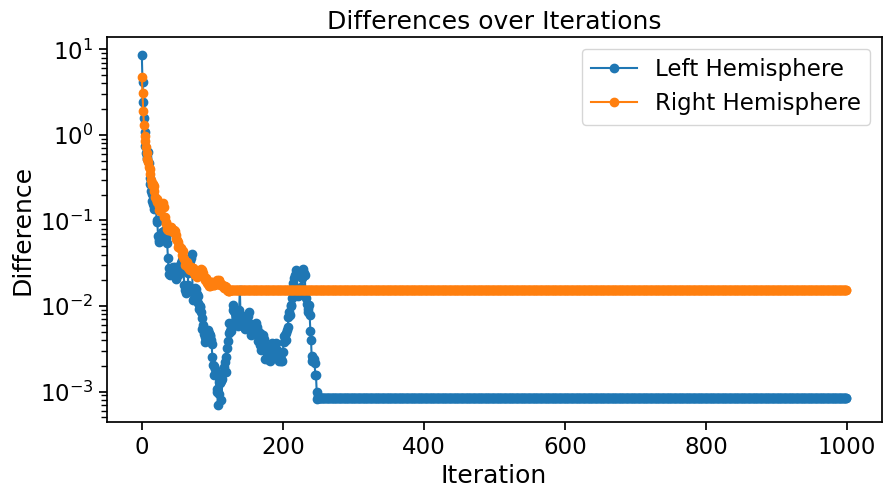

In [126]:
# plots diffs
plt.figure(figsize=(10, 5))
plt.plot(diffs_L, label='Left Hemisphere', marker='o')
plt.plot(diffs_R, label='Right Hemisphere', marker='o')
plt.xlabel('Iteration')
plt.ylabel('Difference')
plt.yscale('log')
plt.title('Differences over Iterations')
plt.legend()
plt.show()

In [ ]:
to_plot_L_wake = posteriors_L
to_plot_R_wake = posteriors_R
T = to_plot_L_wake.shape[1]

TIME_OFFSET = WINDOW_SIZE / 2.0
total_time = TIME_OFFSET + (T - 1) * STEP_SIZE
DEFAULT_DURATION_SEC = total_time / 50.0  # show 1/50 of session by default

def plot_segment_wake(start_sec=0.0, duration_sec=DEFAULT_DURATION_SEC):
    # clamp
    start_sec = max(0.0, min(start_sec, total_time))
    duration_sec = max(STEP_SIZE, duration_sec)

    # seconds → bin indices
    start_bin = int(round((start_sec - TIME_OFFSET) / STEP_SIZE))
    start_bin = max(0, min(start_bin, T - 1))

    end_sec = start_sec + duration_sec
    end_sec = min(end_sec, total_time)

    end_bin = int(round((end_sec - TIME_OFFSET) / STEP_SIZE)) + 1
    end_bin = max(start_bin + 1, min(end_bin, T))

    # x-range in seconds
    x_min = TIME_OFFSET + start_bin * STEP_SIZE
    x_max = TIME_OFFSET + (end_bin - 1) * STEP_SIZE
    y_min = 0
    y_max = to_plot_L_wake.shape[0]

    fig, axs = plt.subplots(2, 1, figsize=(20, 10), sharex=True)
    axL, axR = axs

    for side, to_plot, ax in zip(
        ['Left', 'Right'],
        [to_plot_L_wake, to_plot_R_wake],
        [axL, axR]
    ):
        # ignore any NaNs when computing vmin/vmax (shouldn’t be any if stitching worked)
        vmin = np.nanpercentile(to_plot, 2.5)
        vmax = np.nanpercentile(to_plot, 97.5)

        im = ax.imshow(
            to_plot[:, start_bin:end_bin],
            aspect='auto',
            origin='lower',
            cmap='viridis',
            vmin=vmin,
            vmax=vmax,
            extent=[x_min, x_max, y_min, y_max]
        )

        # overlay true position
        t_slice = np.linspace(x_min, x_max, end_bin - start_bin)
        y_true_slice = Y_true_full[start_bin:end_bin]

        ax.plot(
            t_slice,
            y_true_slice,
            color='k',
            alpha=0.4,
            linewidth=2,
            label='True position'
        )

        ax.set_ylabel('Position bins')
        ax.set_title(f'{side} Hemisphere Wake Decoding ')

    axR.set_xlabel('Time (s)')
    plt.tight_layout()
    plt.show()


# interactive sliders
interact(
    plot_segment_wake,
    start_sec=FloatSlider(
        min=0.0,
        max=total_time,
        step=1.0,
        value=0.0,
        description='Start (s)'
    ),
    duration_sec=FloatSlider(
        min=STEP_SIZE,
        max=total_time,
        step=1.0,
        value=DEFAULT_DURATION_SEC,
        description='Duration (s)'
    )
)

interactive(children=(FloatSlider(value=0.0, description='Start (s)', max=2568.46, step=1.0), FloatSlider(valu…

<function __main__.plot_segment_wake(start_sec=0.0, duration_sec=51.3692)>